In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
import re 
import xlrd
import openpyxl
import numpy as np




In [6]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('energy_measurement.csv')  # Change filename if needed

# Show all rows and columns in the output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Display the DataFrame with all rows in blue and all columns in white
def highlight_rows(s):
    return ['color: blue'] * len(s)

def highlight_columns(val):
    return 'color: white'

styled_df = df.style.apply(highlight_rows, axis=1).map(highlight_columns)

display(styled_df)

,device,videoName,luminanceReduction,bitrate,Power
0,BrandA-Model1,gameplay_4k_10s_luminance_60,0,600,34.540000
1,BrandA-Model1,timescapes_4k_8s_luminance_100,0,600,41.800000
2,BrandA-Model1,tos_4k_10s_luminance_120,0,600,54.840000
3,BrandA-Model1,tos_4k_10s_luminance_80,0,600,35.400000
4,BrandA-Model2,gameplay_4k_10s_luminance_60,0,600,38.040000
5,BrandA-Model2,timescapes_4k_8s_luminance_100,0,600,45.060000
6,BrandA-Model2,tos_4k_10s_luminance_120,0,600,58.600000
7,BrandA-Model2,tos_4k_10s_luminance_80,0,600,39.380000
8,BrandA-Model3,gameplay_4k_10s_luminance_60,0,600,52.740000
9,BrandA-Model3,timescapes_4k_8s_luminance_100,0,600,66.780000


In [19]:
import pandas as pd
from IPython.display import display

# Load the CSV file
df = pd.read_csv('energy_measurement.csv')

# Show initial info
print(f"Initial shape: {df.shape}")
print("\nColumn names and types:")
print(df.dtypes)

# Remove duplicate rows
print("\nDuplicate rows before cleaning:", df.duplicated().sum())
df = df.drop_duplicates().copy()
print("Duplicate rows after cleaning:", df.duplicated().sum())

# Report missing values
print("\nMissing values per column BEFORE filling:\n", df.isna().sum())

# Try numeric conversion on object columns
for col in df.select_dtypes(include=["object"]).columns:
    converted = pd.to_numeric(df[col], errors="coerce")
    if converted.notna().sum() > 0:
        df[col] = converted

# Fill numeric columns with mean
numeric_cols = df.select_dtypes(include=["number"]).columns
for col in numeric_cols:
    mean_val = df[col].mean()
    df[col] = df[col].fillna(mean_val)

# Fill non-numeric columns with placeholder
non_numeric_cols = df.select_dtypes(exclude=["number"]).columns
for col in non_numeric_cols:
    df[col] = df[col].fillna("Unknown")

print("Missing values per column AFTER filling:\n", df.isna().sum())

# Convert timestamp/datetime columns if present
for name in ["timestamp", "Timestamp", "time", "date", "Date", "Time"]:
    if name in df.columns:
        df[name] = pd.to_datetime(df[name], errors="coerce")

print("\nFinal DataFrame info:")
df.info()

# Save cleaned energy data for later analysis
df_energy_clean = df

# Display cleaned data
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
display(df_energy_clean)

Initial shape: (704, 5)

Column names and types:
device                    str
videoName                 str
luminanceReduction      int64
bitrate                 int64
Power                 float64
dtype: object

Duplicate rows before cleaning: 0
Duplicate rows after cleaning: 0

Missing values per column BEFORE filling:
 device                0
videoName             0
luminanceReduction    0
bitrate               0
Power                 0
dtype: int64
Missing values per column AFTER filling:
 device                0
videoName             0
luminanceReduction    0
bitrate               0
Power                 0
dtype: int64

Final DataFrame info:
<class 'pandas.DataFrame'>
RangeIndex: 704 entries, 0 to 703
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   device              704 non-null    str    
 1   videoName           704 non-null    str    
 2   luminanceReduction  704 non-null    int64  
 3   b

,device,videoName,luminanceReduction,bitrate,Power
0,BrandA-Model1,gameplay_4k_10s_luminance_60,0,600,34.540000
1,BrandA-Model1,timescapes_4k_8s_luminance_100,0,600,41.800000
2,BrandA-Model1,tos_4k_10s_luminance_120,0,600,54.840000
3,BrandA-Model1,tos_4k_10s_luminance_80,0,600,35.400000
4,BrandA-Model2,gameplay_4k_10s_luminance_60,0,600,38.040000
5,BrandA-Model2,timescapes_4k_8s_luminance_100,0,600,45.060000
6,BrandA-Model2,tos_4k_10s_luminance_120,0,600,58.600000
7,BrandA-Model2,tos_4k_10s_luminance_80,0,600,39.380000
8,BrandA-Model3,gameplay_4k_10s_luminance_60,0,600,52.740000
9,BrandA-Model3,timescapes_4k_8s_luminance_100,0,600,66.780000


In [14]:
average_power = df_energy_clean['Power'].mean()

print(f"Average Power: {average_power:.2f} W")

Average Power: 57.11 W


In [17]:
import os
import json
import pandas as pd
from IPython.display import display

# Objective-score root folder
root = "../objective-score"
frames = []

for dirpath, _, filenames in os.walk(root):
    for filename in filenames:
        if filename.lower().endswith(".json"):
            filepath = os.path.join(dirpath, filename)
            with open(filepath, "r", encoding="utf-8") as f:
                obj = json.load(f)

            # Normalize dict or list JSON
            flat = pd.json_normalize(obj if isinstance(obj, list) else [obj])
            flat["source_file"] = filename
            flat["source_path"] = os.path.relpath(filepath, root)
            frames.append(flat)

print(f"Loaded {len(frames)} JSON files from {root}")

if frames:
    df = pd.concat(frames, ignore_index=True, sort=False)
    print(f"Combined shape: {df.shape}")
    print(f"\nColumns: {list(df.columns)}")
    
    pd.set_option("display.max_rows", None)
    pd.set_option("display.max_columns", None)
    display(df)
else:
    print("No JSON files found.")

Loaded 352 JSON files from ../objective-score
Combined shape: (352, 127)

Columns: ['psnr', 'ssim', 'input_file_dist', 'input_file_ref', 'global.psnr.mse_avg.average', 'global.psnr.mse_avg.median', 'global.psnr.mse_avg.stdev', 'global.psnr.mse_avg.min', 'global.psnr.mse_avg.max', 'global.psnr.mse_y.average', 'global.psnr.mse_y.median', 'global.psnr.mse_y.stdev', 'global.psnr.mse_y.min', 'global.psnr.mse_y.max', 'global.psnr.mse_u.average', 'global.psnr.mse_u.median', 'global.psnr.mse_u.stdev', 'global.psnr.mse_u.min', 'global.psnr.mse_u.max', 'global.psnr.mse_v.average', 'global.psnr.mse_v.median', 'global.psnr.mse_v.stdev', 'global.psnr.mse_v.min', 'global.psnr.mse_v.max', 'global.psnr.psnr_avg.average', 'global.psnr.psnr_avg.median', 'global.psnr.psnr_avg.stdev', 'global.psnr.psnr_avg.min', 'global.psnr.psnr_avg.max', 'global.psnr.psnr_y.average', 'global.psnr.psnr_y.median', 'global.psnr.psnr_y.stdev', 'global.psnr.psnr_y.min', 'global.psnr.psnr_y.max', 'global.psnr.psnr_u.average',

,psnr,ssim,input_file_dist,input_file_ref,global.psnr.mse_avg.average,global.psnr.mse_avg.median,global.psnr.mse_avg.stdev,global.psnr.mse_avg.min,global.psnr.mse_avg.max,global.psnr.mse_y.average,global.psnr.mse_y.median,global.psnr.mse_y.stdev,global.psnr.mse_y.min,global.psnr.mse_y.max,global.psnr.mse_u.average,global.psnr.mse_u.median,global.psnr.mse_u.stdev,global.psnr.mse_u.min,global.psnr.mse_u.max,global.psnr.mse_v.average,global.psnr.mse_v.median,global.psnr.mse_v.stdev,global.psnr.mse_v.min,global.psnr.mse_v.max,global.psnr.psnr_avg.average,global.psnr.psnr_avg.median,global.psnr.psnr_avg.stdev,global.psnr.psnr_avg.min,global.psnr.psnr_avg.max,global.psnr.psnr_y.average,global.psnr.psnr_y.median,global.psnr.psnr_y.stdev,global.psnr.psnr_y.min,global.psnr.psnr_y.max,global.psnr.psnr_u.average,global.psnr.psnr_u.median,global.psnr.psnr_u.stdev,global.psnr.psnr_u.min,global.psnr.psnr_u.max,global.psnr.psnr_v.average,global.psnr.psnr_v.median,global.psnr.psnr_v.stdev,global.psnr.psnr_v.min,global.psnr.psnr_v.max,global.ssim.ssim_y.average,global.ssim.ssim_y.median,global.ssim.ssim_y.stdev,global.ssim.ssim_y.min,global.ssim.ssim_y.max,global.ssim.ssim_u.average,global.ssim.ssim_u.median,global.ssim.ssim_u.stdev,global.ssim.ssim_u.min,global.ssim.ssim_u.max,global.ssim.ssim_v.average,global.ssim.ssim_v.median,global.ssim.ssim_v.stdev,global.ssim.ssim_v.min,global.ssim.ssim_v.max,global.ssim.ssim_avg.average,global.ssim.ssim_avg.median,global.ssim.ssim_avg.stdev,global.ssim.ssim_avg.min,global.ssim.ssim_avg.max,source_file,source_path,vmaf,global.vmaf.integer_adm2.average,global.vmaf.integer_adm2.median,global.vmaf.integer_adm2.stdev,global.vmaf.integer_adm2.min,global.vmaf.integer_adm2.max,global.vmaf.integer_adm_scale0.average,global.vmaf.integer_adm_scale0.median,global.vmaf.integer_adm_scale0.stdev,global.vmaf.integer_adm_scale0.min,global.vmaf.integer_adm_scale0.max,global.vmaf.integer_adm_scale1.average,global.vmaf.integer_adm_scale1.median,global.vmaf.integer_adm_scale1.stdev,global.vmaf.integer_adm_scale1.min,global.vmaf.integer_adm_scale1.max,global.vmaf.integer_adm_scale2.average,global.vmaf.integer_adm_scale2.median,global.vmaf.integer_adm_scale2.stdev,global.vmaf.integer_adm_scale2.min,global.vmaf.integer_adm_scale2.max,global.vmaf.integer_adm_scale3.average,global.vmaf.integer_adm_scale3.median,global.vmaf.integer_adm_scale3.stdev,global.vmaf.integer_adm_scale3.min,global.vmaf.integer_adm_scale3.max,global.vmaf.integer_motion2.average,global.vmaf.integer_motion2.median,global.vmaf.integer_motion2.stdev,global.vmaf.integer_motion2.min,global.vmaf.integer_motion2.max,global.vmaf.integer_motion.average,global.vmaf.integer_motion.median,global.vmaf.integer_motion.stdev,global.vmaf.integer_motion.min,global.vmaf.integer_motion.max,global.vmaf.integer_vif_scale0.average,global.vmaf.integer_vif_scale0.median,global.vmaf.integer_vif_scale0.stdev,global.vmaf.integer_vif_scale0.min,global.vmaf.integer_vif_scale0.max,global.vmaf.integer_vif_scale1.average,global.vmaf.integer_vif_scale1.median,global.vmaf.integer_vif_scale1.stdev,global.vmaf.integer_vif_scale1.min,global.vmaf.integer_vif_scale1.max,global.vmaf.integer_vif_scale2.average,global.vmaf.integer_vif_scale2.median,global.vmaf.integer_vif_scale2.stdev,global.vmaf.integer_vif_scale2.min,global.vmaf.integer_vif_scale2.max,global.vmaf.integer_vif_scale3.average,global.vmaf.integer_vif_scale3.median,global.vmaf.integer_vif_scale3.stdev,global.vmaf.integer_vif_scale3.min,global.vmaf.integer_vif_scale3.max,global.vmaf.vmaf.average,global.vmaf.vmaf.median,global.vmaf.vmaf.stdev,global.vmaf.vmaf.min,global.vmaf.vmaf.max
0,"[{'n': 1, 'mse_avg': 0.12, 'mse_y': 0.12, 'mse...","[{'n': 1, 'ssim_y': 1.0, 'ssim_u': 1.0, 'ssim_...",./gameplay_4k_10s_luminance_60/gameplay_4k_10s...,/Users/minh/Documents/dash_videos/raw_videos/g...,0.159,0.100,0.173,0.03,1.10,0.200,0.120,0.218,0.04,1.44,0.074,0.040,0.077,0.02,0.39,0.083,0.050,0.089,0.02,0.45,57.678,58.210,3.391,47.72,62.92,56.701,5

In [18]:
import pandas as pd
from IPython.display import display

# Assuming df is already loaded from previous cell with objective data
# Convert unhashable types (lists, dicts) to strings for duplicate detection
hashable_df = df.copy()
for col in hashable_df.columns:
    if hashable_df[col].dtype == "object":
        hashable_df[col] = hashable_df[col].apply(lambda x: str(x) if isinstance(x, (list, dict)) else x)

# Remove duplicates
print("Duplicate rows before cleaning:", hashable_df.duplicated().sum())
df = df.loc[~hashable_df.duplicated(keep='first')].copy()
print("Duplicate rows after cleaning: 0")

# Try numeric conversion on object columns (pandas 3.0 safe)
for col in df.select_dtypes(include=["object", "string"]).columns:
    converted = pd.to_numeric(df[col], errors="coerce")
    if converted.notna().sum() > 0:
        df[col] = converted

# Missing values before fill
print("\nMissing values per column BEFORE filling:\n", df.isna().sum())

# Fill numeric NaN with mean
numeric_cols = df.select_dtypes(include=["number"]).columns
for col in numeric_cols:
    mean_val = df[col].mean()
    df[col] = df[col].fillna(mean_val)

# Fill non-numeric NaN with placeholder
non_numeric_cols = df.select_dtypes(exclude=["number"]).columns
for col in non_numeric_cols:
    df[col] = df[col].fillna("Unknown")

# Optional datetime conversion
for name in ["timestamp", "Timestamp", "time", "date"]:
    if name in df.columns:
        df[name] = pd.to_datetime(df[name], errors="coerce")

print("Missing values per column AFTER filling:\n", df.isna().sum())
print("\nDataFrame info:")
df.info()

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
display(df)

Duplicate rows before cleaning: 0
Duplicate rows after cleaning: 0

Missing values per column BEFORE filling:
 psnr                                      176
ssim                                      176
input_file_dist                             0
input_file_ref                              0
global.psnr.mse_avg.average               176
global.psnr.mse_avg.median                176
global.psnr.mse_avg.stdev                 176
global.psnr.mse_avg.min                   176
global.psnr.mse_avg.max                   176
global.psnr.mse_y.average                 176
global.psnr.mse_y.median                  176
global.psnr.mse_y.stdev                   176
global.psnr.mse_y.min                     176
global.psnr.mse_y.max                     176
global.psnr.mse_u.average                 176
global.psnr.mse_u.median                  176
global.psnr.mse_u.stdev                   176
global.psnr.mse_u.min                     176
global.psnr.mse_u.max                     176
global.psnr.mse

,psnr,ssim,input_file_dist,input_file_ref,global.psnr.mse_avg.average,global.psnr.mse_avg.median,global.psnr.mse_avg.stdev,global.psnr.mse_avg.min,global.psnr.mse_avg.max,global.psnr.mse_y.average,global.psnr.mse_y.median,global.psnr.mse_y.stdev,global.psnr.mse_y.min,global.psnr.mse_y.max,global.psnr.mse_u.average,global.psnr.mse_u.median,global.psnr.mse_u.stdev,global.psnr.mse_u.min,global.psnr.mse_u.max,global.psnr.mse_v.average,global.psnr.mse_v.median,global.psnr.mse_v.stdev,global.psnr.mse_v.min,global.psnr.mse_v.max,global.psnr.psnr_avg.average,global.psnr.psnr_avg.median,global.psnr.psnr_avg.stdev,global.psnr.psnr_avg.min,global.psnr.psnr_avg.max,global.psnr.psnr_y.average,global.psnr.psnr_y.median,global.psnr.psnr_y.stdev,global.psnr.psnr_y.min,global.psnr.psnr_y.max,global.psnr.psnr_u.average,global.psnr.psnr_u.median,global.psnr.psnr_u.stdev,global.psnr.psnr_u.min,global.psnr.psnr_u.max,global.psnr.psnr_v.average,global.psnr.psnr_v.median,global.psnr.psnr_v.stdev,global.psnr.psnr_v.min,global.psnr.psnr_v.max,global.ssim.ssim_y.average,global.ssim.ssim_y.median,global.ssim.ssim_y.stdev,global.ssim.ssim_y.min,global.ssim.ssim_y.max,global.ssim.ssim_u.average,global.ssim.ssim_u.median,global.ssim.ssim_u.stdev,global.ssim.ssim_u.min,global.ssim.ssim_u.max,global.ssim.ssim_v.average,global.ssim.ssim_v.median,global.ssim.ssim_v.stdev,global.ssim.ssim_v.min,global.ssim.ssim_v.max,global.ssim.ssim_avg.average,global.ssim.ssim_avg.median,global.ssim.ssim_avg.stdev,global.ssim.ssim_avg.min,global.ssim.ssim_avg.max,source_file,source_path,vmaf,global.vmaf.integer_adm2.average,global.vmaf.integer_adm2.median,global.vmaf.integer_adm2.stdev,global.vmaf.integer_adm2.min,global.vmaf.integer_adm2.max,global.vmaf.integer_adm_scale0.average,global.vmaf.integer_adm_scale0.median,global.vmaf.integer_adm_scale0.stdev,global.vmaf.integer_adm_scale0.min,global.vmaf.integer_adm_scale0.max,global.vmaf.integer_adm_scale1.average,global.vmaf.integer_adm_scale1.median,global.vmaf.integer_adm_scale1.stdev,global.vmaf.integer_adm_scale1.min,global.vmaf.integer_adm_scale1.max,global.vmaf.integer_adm_scale2.average,global.vmaf.integer_adm_scale2.median,global.vmaf.integer_adm_scale2.stdev,global.vmaf.integer_adm_scale2.min,global.vmaf.integer_adm_scale2.max,global.vmaf.integer_adm_scale3.average,global.vmaf.integer_adm_scale3.median,global.vmaf.integer_adm_scale3.stdev,global.vmaf.integer_adm_scale3.min,global.vmaf.integer_adm_scale3.max,global.vmaf.integer_motion2.average,global.vmaf.integer_motion2.median,global.vmaf.integer_motion2.stdev,global.vmaf.integer_motion2.min,global.vmaf.integer_motion2.max,global.vmaf.integer_motion.average,global.vmaf.integer_motion.median,global.vmaf.integer_motion.stdev,global.vmaf.integer_motion.min,global.vmaf.integer_motion.max,global.vmaf.integer_vif_scale0.average,global.vmaf.integer_vif_scale0.median,global.vmaf.integer_vif_scale0.stdev,global.vmaf.integer_vif_scale0.min,global.vmaf.integer_vif_scale0.max,global.vmaf.integer_vif_scale1.average,global.vmaf.integer_vif_scale1.median,global.vmaf.integer_vif_scale1.stdev,global.vmaf.integer_vif_scale1.min,global.vmaf.integer_vif_scale1.max,global.vmaf.integer_vif_scale2.average,global.vmaf.integer_vif_scale2.median,global.vmaf.integer_vif_scale2.stdev,global.vmaf.integer_vif_scale2.min,global.vmaf.integer_vif_scale2.max,global.vmaf.integer_vif_scale3.average,global.vmaf.integer_vif_scale3.median,global.vmaf.integer_vif_scale3.stdev,global.vmaf.integer_vif_scale3.min,global.vmaf.integer_vif_scale3.max,global.vmaf.vmaf.average,global.vmaf.vmaf.median,global.vmaf.vmaf.stdev,global.vmaf.vmaf.min,global.vmaf.vmaf.max
0,"[{'n': 1, 'mse_avg': 0.12, 'mse_y': 0.12, 'mse...","[{'n': 1, 'ssim_y': 1.0, 'ssim_u': 1.0, 'ssim_...",./gameplay_4k_10s_luminance_60/gameplay_4k_10s...,/Users/minh/Documents/dash_videos/raw_videos/g...,0.159000,0.100000,0.173000,0.030000,1.100000,0.200000,0.120000,0.218000,0.040000,1.440000,0.074000,0.040000,0.077000,0.020000,0.390000,0.083000,0.050000

In [19]:
import json
import pandas as pd
from IPython.display import display

# Load subjective score JSON file
subjective_path = "../subjective-score/subjective_score.json"

with open(subjective_path, "r", encoding="utf-8") as f:
    data = json.load(f)

# Convert to DataFrame
df = pd.json_normalize(data if isinstance(data, list) else [data])

print(f"Loaded subjective dataset shape: {df.shape}")
print(f"\nColumns: {list(df.columns)}")

# Display as formatted table with better styling
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# Style the table with better visibility
styled_df = df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#4CAF50'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'left'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
])

display(styled_df)

Loaded subjective dataset shape: (1, 80)

Columns: ['timescapes_4k_8s_luminance_100.10.11600', 'timescapes_4k_8s_luminance_100.10.2400', 'timescapes_4k_8s_luminance_100.10.600', 'timescapes_4k_8s_luminance_100.10.4500', 'timescapes_4k_8s_luminance_100.6.2400', 'timescapes_4k_8s_luminance_100.6.11600', 'timescapes_4k_8s_luminance_100.6.600', 'timescapes_4k_8s_luminance_100.6.4500', 'timescapes_4k_8s_luminance_100.8.11600', 'timescapes_4k_8s_luminance_100.8.2400', 'timescapes_4k_8s_luminance_100.8.4500', 'timescapes_4k_8s_luminance_100.8.600', 'timescapes_4k_8s_luminance_100.4.4500', 'timescapes_4k_8s_luminance_100.4.2400', 'timescapes_4k_8s_luminance_100.4.11600', 'timescapes_4k_8s_luminance_100.4.600', 'timescapes_4k_8s_luminance_100.2.11600', 'timescapes_4k_8s_luminance_100.2.2400', 'timescapes_4k_8s_luminance_100.2.4500', 'timescapes_4k_8s_luminance_100.2.600', 'tos_4k_10s_luminance_120.2.11600', 'tos_4k_10s_luminance_120.2.4500', 'tos_4k_10s_luminance_120.2.600', 'tos_4k_10s_luminan

,timescapes_4k_8s_luminance_100.10.11600,timescapes_4k_8s_luminance_100.10.2400,timescapes_4k_8s_luminance_100.10.600,timescapes_4k_8s_luminance_100.10.4500,timescapes_4k_8s_luminance_100.6.2400,timescapes_4k_8s_luminance_100.6.11600,timescapes_4k_8s_luminance_100.6.600,timescapes_4k_8s_luminance_100.6.4500,timescapes_4k_8s_luminance_100.8.11600,timescapes_4k_8s_luminance_100.8.2400,timescapes_4k_8s_luminance_100.8.4500,timescapes_4k_8s_luminance_100.8.600,timescapes_4k_8s_luminance_100.4.4500,timescapes_4k_8s_luminance_100.4.2400,timescapes_4k_8s_luminance_100.4.11600,timescapes_4k_8s_luminance_100.4.600,timescapes_4k_8s_luminance_100.2.11600,timescapes_4k_8s_luminance_100.2.2400,timescapes_4k_8s_luminance_100.2.4500,timescapes_4k_8s_luminance_100.2.600,tos_4k_10s_luminance_120.2.11600,tos_4k_10s_luminance_120.2.4500,tos_4k_10s_luminance_120.2.600,tos_4k_10s_luminance_120.2.2400,tos_4k_10s_luminance_120.8.600,tos_4k_10s_luminance_120.8.2400,tos_4k_10s_luminance_120.8.11600,tos_4k_10s_luminance_120.8.4500,tos_4k_10s_luminance_120.10.4500,tos_4k_10s_luminance_120.10.11600,tos_4k_10s_luminance_120.10.2400,tos_4k_10s_luminance_120.10.600,tos_4k_10s_luminance_120.6.2400,tos_4k_10s_luminance_120.6.11600,tos_4k_10s_luminance_120.6.600,tos_4k_10s_luminance_120.6.4500,tos_4k_10s_luminance_120.4.2400,tos_4k_10s_luminance_120.4.11600,tos_4k_10s_luminance_120.4.600,tos_4k_10s_luminance_120.4.4500,tos_4k_10s_luminance_80.8.11600,tos_4k_10s_luminance_80.8.2400,tos_4k_10s_luminance_80.8.4500,tos_4k_10s_luminance_80.8.600,tos_4k_10s_luminance_80.2.2400,tos_4k_10s_luminance_80.2.4500,tos_4k_10s_luminance_80.2.600,tos_4k_10s_luminance_80.2.11600,tos_4k_10s_luminance_80.6.4500,tos_4k_10s_luminance_80.6.600,tos_4k_10s_luminance_80.6.2400,tos_4k_10s_luminance_80.6.11600,tos_4k_10s_luminance_80.4.11600,tos_4k_10s_luminance_80.4.600,tos_4k_10s_luminance_80.4.4500,tos_4k_10s_luminance_80.4.2400,tos_4k_10s_luminance_80.10.4500,tos_4k_10s_luminance_80.10.600,tos_4k_10s_luminance_80.10.2400,tos_4k_10s_luminance_80.10.11600,gameplay_4k_10s_luminance_60.10.2400,gameplay_4k_10s_luminance_60.10.4500,gameplay_4k_10s_luminance_60.10.11600,gameplay_4k_10s_luminance_60.10.600,gameplay_4k_10s_luminance_60.8.2400,gameplay_4k_10s_luminance_60.8.11600,gameplay_4k_10s_luminance_60.8.600,gameplay_4k_10s_luminance_60.8.4500,gameplay_4k_10s_luminance_60.2.4500,gameplay_4k_10s_luminance_60.2.11600,gameplay_4k_10s_luminance_60.2.600,gameplay_4k_10s_luminance_60.2.2400,gameplay_4k_10s_luminance_60.6.11600,gameplay_4k_10s_luminance_60.6.4500,gameplay_4k_10s_luminance_60.6.600,gameplay_4k_10s_luminance_60.6.2400,gameplay_4k_10s_luminance_60.4.2400,gameplay_4k_10s_luminance_60.4.600,gameplay_4k_10s_luminance_60.4.4500,gameplay_4k_10s_luminance_60.4.11600
0,"[3, 3, 1, 2, 4, 2, 3, 2, 2, 4, 2, 2, 2, 2, 3, 3, 2, 3, 1, 3, 1, 3, 3, 2, 1, 3, 1, 3]","[2, 2, 2, 2, 4, 2, 3, 2, 3, 3, 2, 3, 2, 2, 3, 4, 1, 3, 2, 3, 1, 3, 3, 3, 2, 3, 2, 4]","[2, 3, 1, 2, 3, 3, 1, 1, 2, 2, 1, 2, 4, 2, 1, 3, 2, 3, 1, 3, 1, 3, 3, 2, 1, 2, 1, 2]","[1, 2, 1, 4, 3, 2, 2, 1, 1, 2, 2, 2, 2, 3, 1, 3, 4, 3, 1, 3, 1, 3, 3, 2, 1, 2, 2, 2]","[4, 3, 3, 4, 4, 2, 1, 2, 3, 3, 4, 4, 4, 4, 3, 3, 4, 3, 3, 3, 2, 4, 3, 3, 2, 4, 2, 4]","[3, 3, 3, 3, 4, 5, 2, 4, 3, 4, 3, 2, 3, 4, 3, 4, 4, 3, 3, 3, 3, 4, 4, 3, 4, 3, 2, 4]","[2, 3, 3, 3, 4, 3, 3, 2, 2, 3, 3, 2, 3, 3, 2, 4, 4, 3, 3, 3, 2, 4, 4, 4, 4, 3, 2, 4]","[3, 4, 2, 2, 4, 4, 2, 3, 3, 4, 3, 2, 2, 4, 2, 4, 2, 3, 2, 3, 2, 4, 4, 3, 4, 4, 2, 3]","[4, 3, 3, 2, 3, 3, 2, 2, 1, 2, 2, 3, 3, 3, 2, 4, 2, 4, 2, 4, 2, 4, 4, 3, 3, 3, 3, 4]","[2, 3, 3, 4, 4, 3, 2, 2, 4, 4, 3, 3, 3, 3, 2, 4, 2, 3, 2, 3, 2, 3, 4, 3, 2, 3, 4, 3]","[2, 4, 2, 2, 4, 2, 1, 2, 4, 3, 3, 2, 2, 2, 2, 4, 1, 3, 1, 3, 2, 3, 3, 3, 3, 3, 1, 2]","[2, 3, 3, 3, 4, 1, 2, 2, 2, 3, 2, 3, 3, 2, 3, 3, 1, 3, 2, 3, 2, 3, 3, 3, 2, 2, 3, 3]","[5, 4, 4, 4, 4, 3, 3, 4, 3, 4, 4, 4, 3, 4, 4, 4, 3, 3, 3, 4, 2, 4, 4, 4, 5, 4, 4, 3]","[3, 4, 4, 4, 4, 3, 3, 3, 3, 5, 5, 4, 4, 4, 3, 4, 3, 4, 5, 4, 3, 4, 4, 5, 4, 4, 3, 4]","[3, 4, 3, 3, 4, 5, 3, 

In [20]:
import pandas as pd
from IPython.display import display

# Assuming df is already loaded from previous cell with subjective data

# Convert unhashable types (lists, dicts) to strings for duplicate detection
hashable_df = df.copy()
for col in hashable_df.columns:
    if hashable_df[col].dtype == "object":
        hashable_df[col] = hashable_df[col].apply(lambda x: str(x) if isinstance(x, (list, dict)) else x)

# Remove duplicate rows
print("Duplicate rows before cleaning:", hashable_df.duplicated().sum())
df = df.loc[~hashable_df.duplicated(keep='first')].copy()
print("Duplicate rows after cleaning: 0")

# Report missing values
print("\nMissing values per column BEFORE filling:\n", df.isna().sum())

# Try numeric conversion on object columns
for col in df.select_dtypes(include=["object", "string"]).columns:
    converted = pd.to_numeric(df[col], errors="coerce")
    if converted.notna().sum() > 0:
        df[col] = converted

# Fill numeric columns with mean
numeric_cols = df.select_dtypes(include=["number"]).columns
for col in numeric_cols:
    mean_val = df[col].mean()
    df[col] = df[col].fillna(mean_val)

# Fill non-numeric columns with placeholder
non_numeric_cols = df.select_dtypes(exclude=["number"]).columns
for col in non_numeric_cols:
    df[col] = df[col].fillna("Unknown")

print("Missing values per column AFTER filling:\n", df.isna().sum())

# Convert timestamp/datetime columns if present
for name in ["timestamp", "Timestamp", "time", "date", "Date", "Time"]:
    if name in df.columns:
        df[name] = pd.to_datetime(df[name], errors="coerce")

print("\nFinal DataFrame info:")
df.info()

# Display cleaned data in styled table
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

styled_df = df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#4CAF50'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'left'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
])

display(styled_df)

Duplicate rows before cleaning: 0
Duplicate rows after cleaning: 0

Missing values per column BEFORE filling:
 timescapes_4k_8s_luminance_100.10.11600    0
timescapes_4k_8s_luminance_100.10.2400     0
timescapes_4k_8s_luminance_100.10.600      0
timescapes_4k_8s_luminance_100.10.4500     0
timescapes_4k_8s_luminance_100.6.2400      0
timescapes_4k_8s_luminance_100.6.11600     0
timescapes_4k_8s_luminance_100.6.600       0
timescapes_4k_8s_luminance_100.6.4500      0
timescapes_4k_8s_luminance_100.8.11600     0
timescapes_4k_8s_luminance_100.8.2400      0
timescapes_4k_8s_luminance_100.8.4500      0
timescapes_4k_8s_luminance_100.8.600       0
timescapes_4k_8s_luminance_100.4.4500      0
timescapes_4k_8s_luminance_100.4.2400      0
timescapes_4k_8s_luminance_100.4.11600     0
timescapes_4k_8s_luminance_100.4.600       0
timescapes_4k_8s_luminance_100.2.11600     0
timescapes_4k_8s_luminance_100.2.2400      0
timescapes_4k_8s_luminance_100.2.4500      0
timescapes_4k_8s_luminance_100.2.6

,timescapes_4k_8s_luminance_100.10.11600,timescapes_4k_8s_luminance_100.10.2400,timescapes_4k_8s_luminance_100.10.600,timescapes_4k_8s_luminance_100.10.4500,timescapes_4k_8s_luminance_100.6.2400,timescapes_4k_8s_luminance_100.6.11600,timescapes_4k_8s_luminance_100.6.600,timescapes_4k_8s_luminance_100.6.4500,timescapes_4k_8s_luminance_100.8.11600,timescapes_4k_8s_luminance_100.8.2400,timescapes_4k_8s_luminance_100.8.4500,timescapes_4k_8s_luminance_100.8.600,timescapes_4k_8s_luminance_100.4.4500,timescapes_4k_8s_luminance_100.4.2400,timescapes_4k_8s_luminance_100.4.11600,timescapes_4k_8s_luminance_100.4.600,timescapes_4k_8s_luminance_100.2.11600,timescapes_4k_8s_luminance_100.2.2400,timescapes_4k_8s_luminance_100.2.4500,timescapes_4k_8s_luminance_100.2.600,tos_4k_10s_luminance_120.2.11600,tos_4k_10s_luminance_120.2.4500,tos_4k_10s_luminance_120.2.600,tos_4k_10s_luminance_120.2.2400,tos_4k_10s_luminance_120.8.600,tos_4k_10s_luminance_120.8.2400,tos_4k_10s_luminance_120.8.11600,tos_4k_10s_luminance_120.8.4500,tos_4k_10s_luminance_120.10.4500,tos_4k_10s_luminance_120.10.11600,tos_4k_10s_luminance_120.10.2400,tos_4k_10s_luminance_120.10.600,tos_4k_10s_luminance_120.6.2400,tos_4k_10s_luminance_120.6.11600,tos_4k_10s_luminance_120.6.600,tos_4k_10s_luminance_120.6.4500,tos_4k_10s_luminance_120.4.2400,tos_4k_10s_luminance_120.4.11600,tos_4k_10s_luminance_120.4.600,tos_4k_10s_luminance_120.4.4500,tos_4k_10s_luminance_80.8.11600,tos_4k_10s_luminance_80.8.2400,tos_4k_10s_luminance_80.8.4500,tos_4k_10s_luminance_80.8.600,tos_4k_10s_luminance_80.2.2400,tos_4k_10s_luminance_80.2.4500,tos_4k_10s_luminance_80.2.600,tos_4k_10s_luminance_80.2.11600,tos_4k_10s_luminance_80.6.4500,tos_4k_10s_luminance_80.6.600,tos_4k_10s_luminance_80.6.2400,tos_4k_10s_luminance_80.6.11600,tos_4k_10s_luminance_80.4.11600,tos_4k_10s_luminance_80.4.600,tos_4k_10s_luminance_80.4.4500,tos_4k_10s_luminance_80.4.2400,tos_4k_10s_luminance_80.10.4500,tos_4k_10s_luminance_80.10.600,tos_4k_10s_luminance_80.10.2400,tos_4k_10s_luminance_80.10.11600,gameplay_4k_10s_luminance_60.10.2400,gameplay_4k_10s_luminance_60.10.4500,gameplay_4k_10s_luminance_60.10.11600,gameplay_4k_10s_luminance_60.10.600,gameplay_4k_10s_luminance_60.8.2400,gameplay_4k_10s_luminance_60.8.11600,gameplay_4k_10s_luminance_60.8.600,gameplay_4k_10s_luminance_60.8.4500,gameplay_4k_10s_luminance_60.2.4500,gameplay_4k_10s_luminance_60.2.11600,gameplay_4k_10s_luminance_60.2.600,gameplay_4k_10s_luminance_60.2.2400,gameplay_4k_10s_luminance_60.6.11600,gameplay_4k_10s_luminance_60.6.4500,gameplay_4k_10s_luminance_60.6.600,gameplay_4k_10s_luminance_60.6.2400,gameplay_4k_10s_luminance_60.4.2400,gameplay_4k_10s_luminance_60.4.600,gameplay_4k_10s_luminance_60.4.4500,gameplay_4k_10s_luminance_60.4.11600
0,"[3, 3, 1, 2, 4, 2, 3, 2, 2, 4, 2, 2, 2, 2, 3, 3, 2, 3, 1, 3, 1, 3, 3, 2, 1, 3, 1, 3]","[2, 2, 2, 2, 4, 2, 3, 2, 3, 3, 2, 3, 2, 2, 3, 4, 1, 3, 2, 3, 1, 3, 3, 3, 2, 3, 2, 4]","[2, 3, 1, 2, 3, 3, 1, 1, 2, 2, 1, 2, 4, 2, 1, 3, 2, 3, 1, 3, 1, 3, 3, 2, 1, 2, 1, 2]","[1, 2, 1, 4, 3, 2, 2, 1, 1, 2, 2, 2, 2, 3, 1, 3, 4, 3, 1, 3, 1, 3, 3, 2, 1, 2, 2, 2]","[4, 3, 3, 4, 4, 2, 1, 2, 3, 3, 4, 4, 4, 4, 3, 3, 4, 3, 3, 3, 2, 4, 3, 3, 2, 4, 2, 4]","[3, 3, 3, 3, 4, 5, 2, 4, 3, 4, 3, 2, 3, 4, 3, 4, 4, 3, 3, 3, 3, 4, 4, 3, 4, 3, 2, 4]","[2, 3, 3, 3, 4, 3, 3, 2, 2, 3, 3, 2, 3, 3, 2, 4, 4, 3, 3, 3, 2, 4, 4, 4, 4, 3, 2, 4]","[3, 4, 2, 2, 4, 4, 2, 3, 3, 4, 3, 2, 2, 4, 2, 4, 2, 3, 2, 3, 2, 4, 4, 3, 4, 4, 2, 3]","[4, 3, 3, 2, 3, 3, 2, 2, 1, 2, 2, 3, 3, 3, 2, 4, 2, 4, 2, 4, 2, 4, 4, 3, 3, 3, 3, 4]","[2, 3, 3, 4, 4, 3, 2, 2, 4, 4, 3, 3, 3, 3, 2, 4, 2, 3, 2, 3, 2, 3, 4, 3, 2, 3, 4, 3]","[2, 4, 2, 2, 4, 2, 1, 2, 4, 3, 3, 2, 2, 2, 2, 4, 1, 3, 1, 3, 2, 3, 3, 3, 3, 3, 1, 2]","[2, 3, 3, 3, 4, 1, 2, 2, 2, 3, 2, 3, 3, 2, 3, 3, 1, 3, 2, 3, 2, 3, 3, 3, 2, 2, 3, 3]","[5, 4, 4, 4, 4, 3, 3, 4, 3, 4, 4, 4, 3, 4, 4, 4, 3, 3, 3, 4, 2, 4, 4, 4, 5, 4, 4, 3]","[3, 4, 4, 4, 4, 3, 3, 3, 3, 5, 5, 4, 4, 4, 3, 4, 3, 4, 5, 4, 3, 4, 4, 5, 4, 4, 3, 4]","[3, 4, 3, 3, 4, 5, 3, 

In [21]:
import os
import pandas as pd
from IPython.display import display

# Load test-sequence directory structure and files
root = "../test-sequence"
data = []

for dirpath, _, filenames in os.walk(root):
    for filename in filenames:
        filepath = os.path.join(dirpath, filename)
        rel_folder = os.path.relpath(dirpath, root)
        data.append({
            'folder': rel_folder,
            'filename': filename,
            'file_path': os.path.relpath(filepath, root)
        })

print(f"Loaded {len(data)} test sequence files from {root}")

if data:
    df = pd.DataFrame(data)
    print(f"\nDataFrame shape: {df.shape}")
    print(f"\nFolders found: {df['folder'].unique()}")
    
    pd.set_option("display.max_rows", None)
    pd.set_option("display.max_columns", None)
    
    # Style the table
    styled_df = df.style.set_properties(**{
        'background-color': '#ffffff',
        'border': '1px solid #ddd',
        'color': '#000000',
        'padding': '8px'
    }).set_table_styles([
        {'selector': 'th', 'props': [
            ('background-color', '#2196F3'),
            ('color', 'white'),
            ('text-align', 'center'),
            ('border', '1px solid #ddd'),
            ('padding', '10px'),
            ('font-weight', 'bold')
        ]},
        {'selector': 'td', 'props': [
            ('text-align', 'left'),
            ('border', '1px solid #ddd'),
            ('padding', '8px'),
            ('color', '#333333')
        ]},
    ])
    
    display(styled_df)
else:
    print("No test sequence files found.")

Loaded 177 test sequence files from ../test-sequence

DataFrame shape: (177, 3)

Folders found: <StringArray>
[                             '.',   'gameplay_4k_10s_luminance_60',
 'timescapes_4k_8s_luminance_100',       'tos_4k_10s_luminance_120',
        'tos_4k_10s_luminance_80']
Length: 5, dtype: str


,folder,filename,file_path
0,.,.DS_Store,.DS_Store
1,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_11600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_11600k.mp4
2,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_2400k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_2400k.mp4
3,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_4500k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_4500k.mp4
4,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_600k.mp4
5,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_11600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_11600k.mp4
6,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_2400k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_2400k.mp4
7,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_4500k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_4500k.mp4
8,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_600k.mp4
9,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_1_11600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_1_11600k.mp4


In [22]:
import os
import pandas as pd
from IPython.display import display

# Assuming df is already loaded from previous cell with test-sequence data

root = "../test-sequence"

print(f"Initial test-sequence dataset shape: {df.shape}")

# Remove duplicate filenames (keep first occurrence)
print("\nDuplicate rows before cleaning:", df.duplicated(subset=['filename']).sum())
df = df.drop_duplicates(subset=['filename'], keep='first').copy()
print("Duplicate rows after cleaning:", df.duplicated(subset=['filename']).sum())

# Check file existence and size
df['file_exists'] = df['file_path'].apply(lambda x: os.path.exists(os.path.join(root, x)))
df['file_size_bytes'] = df.apply(
    lambda row: os.path.getsize(os.path.join(root, row['file_path'])) if row['file_exists'] else 0,
    axis=1
)

print(f"\nFiles that exist: {df['file_exists'].sum()}/{len(df)}")
print(f"Missing files: {(~df['file_exists']).sum()}")

# Only keep existing files
if (~df['file_exists']).sum() > 0:
    print(f"Removing {(~df['file_exists']).sum()} missing files...")
    df = df[df['file_exists']].copy()

# Convert file size to MB for readability
df['file_size_mb'] = df['file_size_bytes'] / (1024 * 1024)

# Summary statistics by folder
print("\nFiles per folder:")
print(df['folder'].value_counts().sort_index())

print("\nFile size statistics (MB):")
print(df['file_size_mb'].describe())

# Display cleaned data in styled table
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

styled_df = df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#FF9800'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'left'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
])

print("\nCleaned test-sequence dataset:")
display(styled_df)

Initial test-sequence dataset shape: (177, 3)

Duplicate rows before cleaning: 0
Duplicate rows after cleaning: 0

Files that exist: 177/177
Missing files: 0

Files per folder:
folder
.                                  1
gameplay_4k_10s_luminance_60      44
timescapes_4k_8s_luminance_100    44
tos_4k_10s_luminance_120          44
tos_4k_10s_luminance_80           44
Name: count, dtype: int64

File size statistics (MB):
count    177.000000
mean       5.042705
std        4.471974
min        0.009769
25%        0.896750
50%        3.224620
75%        5.800951
max       14.546743
Name: file_size_mb, dtype: float64

Cleaned test-sequence dataset:


,folder,filename,file_path,file_exists,file_size_bytes,file_size_mb
0,.,.DS_Store,.DS_Store,True,10244,0.009769
1,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_11600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_11600k.mp4,True,9886420,9.428425
2,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_2400k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_2400k.mp4,True,2237779,2.134112
3,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_4500k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_4500k.mp4,True,3670490,3.500452
4,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_0_600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_0_600k.mp4,True,706469,0.673741
5,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_11600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_11600k.mp4,True,9743970,9.292574
6,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_2400k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_2400k.mp4,True,2202268,2.100246
7,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_4500k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_4500k.mp4,True,3624619,3.456706
8,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_10_600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_10_600k.mp4,True,706296,0.673576
9,gameplay_4k_10s_luminance_60,gameplay_4k_10s_luminance_60_1_11600k.mp4,gameplay_4k_10s_luminance_60\gameplay_4k_10s_luminance_60_1_11600k.mp4,True,9883308,9.425457


In [23]:
import pandas as pd
from IPython.display import display

# Assuming df_energy_clean contains the cleaned energy consumption data
# Calculate descriptive statistics for numeric columns

print("=" * 80)
print("DESCRIPTIVE STATISTICS - ENERGY CONSUMPTION DATASET (Cleaned)")
print("=" * 80)

# Select only numeric columns
numeric_cols = df_energy_clean.select_dtypes(include=['number']).columns

# Create a comprehensive statistics dataframe
stats_dict = {
    'Mean': df_energy_clean[numeric_cols].mean(),
    'Median': df_energy_clean[numeric_cols].median(),
    'Minimum': df_energy_clean[numeric_cols].min(),
    'Maximum': df_energy_clean[numeric_cols].max(),
    'Std Deviation': df_energy_clean[numeric_cols].std()
}

stats_df = pd.DataFrame(stats_dict).T

print(f"\nDataset shape: {df_energy_clean.shape}")
print(f"Number of numeric columns: {len(numeric_cols)}")
print(f"\nNumeric columns: {list(numeric_cols)}")

print("\n" + "=" * 80)
print("SUMMARY STATISTICS")
print("=" * 80)
print(stats_df)

# Display with styled table
styled_stats = stats_df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px',
    'text-align': 'right'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#9C27B0'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'right'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
    {'selector': 'th.row_heading', 'props': [
        ('background-color', '#E1BEE7'),
        ('color', '#333333'),
        ('text-align', 'left'),
        ('font-weight', 'bold')
    ]},
]).format(precision=4)

print("\n" + "=" * 80)
print("FORMATTED STATISTICS TABLE")
print("=" * 80)
display(styled_stats)

DESCRIPTIVE STATISTICS - ENERGY CONSUMPTION DATASET (Cleaned)

Dataset shape: (704, 5)
Number of numeric columns: 3

Numeric columns: ['luminanceReduction', 'bitrate', 'Power']

SUMMARY STATISTICS
               luminanceReduction       bitrate       Power
Mean                     5.000000   4775.000000   57.105069
Median                   5.000000   3450.000000   53.320000
Minimum                  0.000000    600.000000   33.220000
Maximum                 10.000000  11600.000000  110.600000
Std Deviation            3.164526   4178.118166   20.322619

FORMATTED STATISTICS TABLE


,luminanceReduction,bitrate,Power
Mean,5.0000,4775.0000,57.1051
Median,5.0000,3450.0000,53.3200
Minimum,0.0000,600.0000,33.2200
Maximum,10.0000,11600.0000,110.6000
Std Deviation,3.1645,4178.1182,20.3226


UNIVARIATE ANALYSIS - LUMINANCE REDUCTION

1. DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------
Count:           704
Mean:            5.0000
Median:          5.0000
Minimum:         0.0000
Maximum:         10.0000
Std Deviation:   3.1645
Range:           10.0000

2. FREQUENCY DISTRIBUTION
--------------------------------------------------------------------------------
luminanceReduction
0     64
1     64
2     64
3     64
4     64
5     64
6     64
7     64
8     64
9     64
10    64
Name: count, dtype: int64

3. SKEWNESS AND KURTOSIS
--------------------------------------------------------------------------------
Skewness:        0.0000
  Interpretation: Approximately symmetric

Kurtosis:        -1.2200
  Interpretation: Light-tailed (platykurtic)


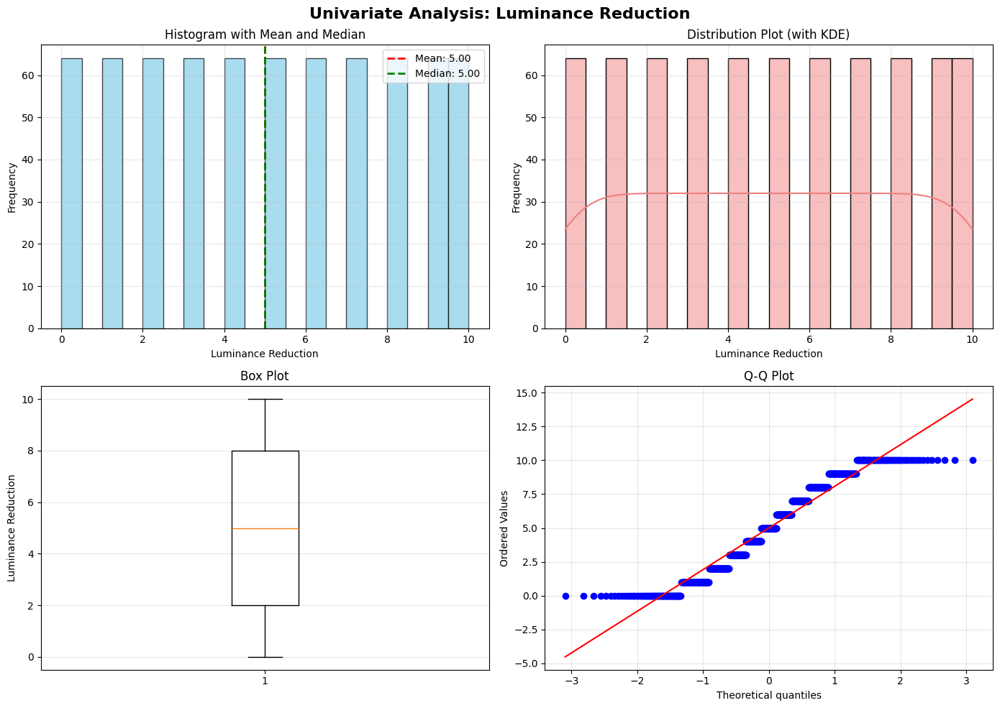


SUMMARY TABLE


,Statistic,Value
0,Count,704
1,Mean,5.0000
2,Median,5.0000
3,Minimum,0.0000
4,Maximum,10.0000
5,Std Deviation,3.1645
6,Range,10.0000
7,Skewness,0.0000
8,Kurtosis,-1.2200


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from IPython.display import display

# Assuming df_energy_clean contains the cleaned energy consumption data
# Extract luminanceReduction column
luminance = df_energy_clean['luminanceReduction']

print("=" * 80)
print("UNIVARIATE ANALYSIS - LUMINANCE REDUCTION")
print("=" * 80)

# 1. DESCRIPTIVE STATISTICS (from previous analysis)
print("\n1. DESCRIPTIVE STATISTICS")
print("-" * 80)
print(f"Count:           {luminance.count()}")
print(f"Mean:            {luminance.mean():.4f}")
print(f"Median:          {luminance.median():.4f}")
print(f"Minimum:         {luminance.min():.4f}")
print(f"Maximum:         {luminance.max():.4f}")
print(f"Std Deviation:   {luminance.std():.4f}")
print(f"Range:           {luminance.max() - luminance.min():.4f}")

# 2. FREQUENCY DISTRIBUTION
print("\n2. FREQUENCY DISTRIBUTION")
print("-" * 80)
freq_dist = luminance.value_counts().sort_index()
print(freq_dist)

# 3. SKEWNESS AND KURTOSIS
print("\n3. SKEWNESS AND KURTOSIS")
print("-" * 80)
skewness = stats.skew(luminance)
kurtosis_val = stats.kurtosis(luminance)
print(f"Skewness:        {skewness:.4f}")
print(f"  Interpretation: ", end="")
if abs(skewness) < 0.5:
    print("Approximately symmetric")
elif skewness > 0:
    print("Right-skewed (positively skewed)")
else:
    print("Left-skewed (negatively skewed)")

print(f"\nKurtosis:        {kurtosis_val:.4f}")
print(f"  Interpretation: ", end="")
if abs(kurtosis_val) < 0.5:
    print("Normal distribution (mesokurtic)")
elif kurtosis_val > 0:
    print("Heavy-tailed (leptokurtic)")
else:
    print("Light-tailed (platykurtic)")

# 4. CREATE VISUALIZATIONS
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Univariate Analysis: Luminance Reduction', fontsize=16, fontweight='bold')

# Histogram with KDE
axes[0, 0].hist(luminance, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(luminance.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {luminance.mean():.2f}')
axes[0, 0].axvline(luminance.median(), color='green', linestyle='--', linewidth=2, label=f'Median: {luminance.median():.2f}')
axes[0, 0].set_xlabel('Luminance Reduction')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Histogram with Mean and Median')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Distribution Plot
sns.histplot(luminance, bins=20, kde=True, color='lightcoral', ax=axes[0, 1])
axes[0, 1].set_xlabel('Luminance Reduction')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution Plot (with KDE)')
axes[0, 1].grid(True, alpha=0.3)

# Box Plot
axes[1, 0].boxplot(luminance, vert=True)
axes[1, 0].set_ylabel('Luminance Reduction')
axes[1, 0].set_title('Box Plot')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Q-Q Plot
stats.probplot(luminance, dist="norm", plot=axes[1, 1])
axes[1, 1].set_title('Q-Q Plot')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Summary Table
print("\n" + "=" * 80)
print("SUMMARY TABLE")
print("=" * 80)
summary_data = {
    'Statistic': ['Count', 'Mean', 'Median', 'Minimum', 'Maximum', 'Std Deviation', 'Range', 'Skewness', 'Kurtosis'],
    'Value': [
        f"{luminance.count()}",
        f"{luminance.mean():.4f}",
        f"{luminance.median():.4f}",
        f"{luminance.min():.4f}",
        f"{luminance.max():.4f}",
        f"{luminance.std():.4f}",
        f"{luminance.max() - luminance.min():.4f}",
        f"{skewness:.4f}",
        f"{kurtosis_val:.4f}"
    ]
}
summary_df = pd.DataFrame(summary_data)

styled_summary = summary_df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#1976D2'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'left'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
])

display(styled_summary)

                         videoName         device  count
0     gameplay_4k_10s_luminance_60  BrandA-Model1     44
1     gameplay_4k_10s_luminance_60  BrandA-Model2     44
2     gameplay_4k_10s_luminance_60  BrandA-Model3     44
3     gameplay_4k_10s_luminance_60  BrandB-Model1     44
4   timescapes_4k_8s_luminance_100  BrandA-Model1     44
5   timescapes_4k_8s_luminance_100  BrandA-Model2     44
6   timescapes_4k_8s_luminance_100  BrandA-Model3     44
7   timescapes_4k_8s_luminance_100  BrandB-Model1     44
8         tos_4k_10s_luminance_120  BrandA-Model1     44
9         tos_4k_10s_luminance_120  BrandA-Model2     44
10        tos_4k_10s_luminance_120  BrandA-Model3     44
11        tos_4k_10s_luminance_120  BrandB-Model1     44
12         tos_4k_10s_luminance_80  BrandA-Model1     44
13         tos_4k_10s_luminance_80  BrandA-Model2     44
14         tos_4k_10s_luminance_80  BrandA-Model3     44
15         tos_4k_10s_luminance_80  BrandB-Model1     44


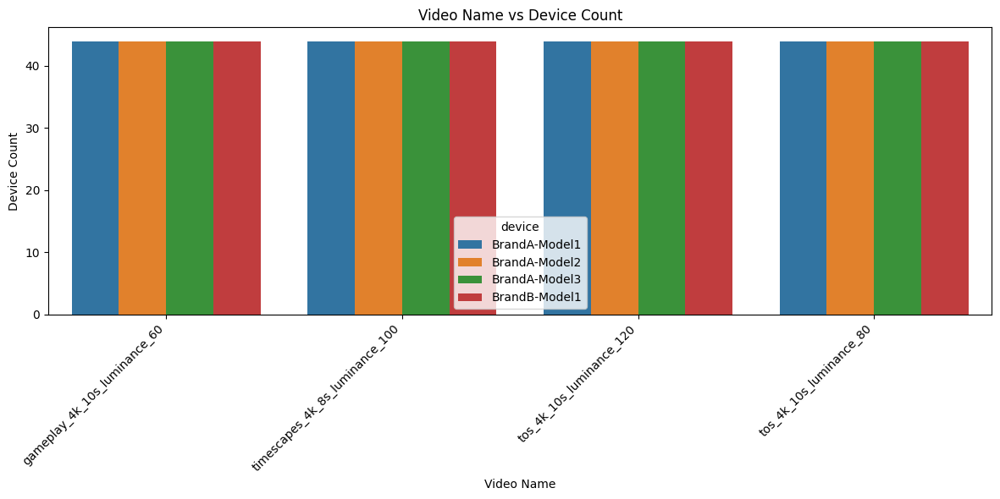

In [26]:
# Count each video name by device
video_device_count = (
    df_energy_clean
    .groupby(['videoName', 'device'])
    .size()
    .reset_index(name='count')
)

# Display the counts
print(video_device_count)

# Plot bar chart
plt.figure(figsize=(12, 6))
# Sort the data in ascending order of count from highest to lowest
video_device_count = video_device_count.sort_values(by='count', ascending=True)
sns.barplot(
    data=video_device_count,
    x='videoName',
    y='count',
    hue='device'
)

plt.title('Video Name vs Device Count')
plt.xlabel('Video Name')
plt.ylabel('Device Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

                        videoName  luminance
0    gameplay_4k_10s_luminance_60         60
3         tos_4k_10s_luminance_80         80
1  timescapes_4k_8s_luminance_100        100
2        tos_4k_10s_luminance_120        120


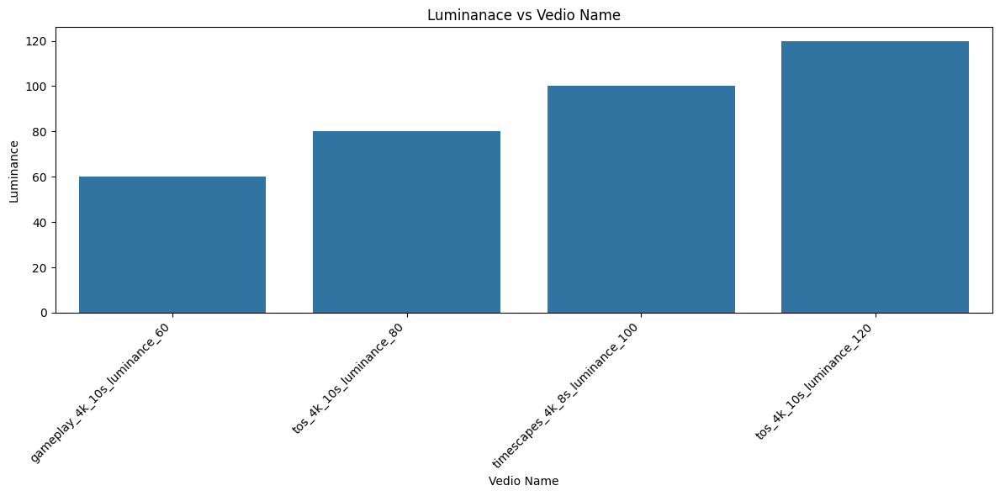

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Extract luminance from videoName
df_plot = df_energy_clean.copy()
df_plot['luminance'] = df_plot['videoName'].str.extract(r'luminance_(\d+)').astype(int)

# Keep one luminance value per video name and sort from lowest to highest
luminance_video = (
    df_plot[['videoName', 'luminance']]
    .drop_duplicates()
    .sort_values(by='luminance', ascending=True)
)

# Display the result
print(luminance_video)

# Plot bar chart
plt.figure(figsize=(12, 6))
sns.barplot(
    data=luminance_video,
    x='videoName',
    y='luminance'
) 

plt.title('Luminanace vs Vedio Name')
plt.xlabel('Vedio Name')
plt.ylabel('Luminance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

   duration         device  luminance                       videoName
0       10s  BrandA-Model1         60    gameplay_4k_10s_luminance_60
3       10s  BrandA-Model1         80         tos_4k_10s_luminance_80
2       10s  BrandA-Model1        120        tos_4k_10s_luminance_120
4       10s  BrandA-Model2         60    gameplay_4k_10s_luminance_60
7       10s  BrandA-Model2         80         tos_4k_10s_luminance_80
6       10s  BrandA-Model2        120        tos_4k_10s_luminance_120
8       10s  BrandA-Model3         60    gameplay_4k_10s_luminance_60
11      10s  BrandA-Model3         80         tos_4k_10s_luminance_80
10      10s  BrandA-Model3        120        tos_4k_10s_luminance_120
12      10s  BrandB-Model1         60    gameplay_4k_10s_luminance_60
15      10s  BrandB-Model1         80         tos_4k_10s_luminance_80
14      10s  BrandB-Model1        120        tos_4k_10s_luminance_120
1        8s  BrandA-Model1        100  timescapes_4k_8s_luminance_100
5        8s  BrandA-

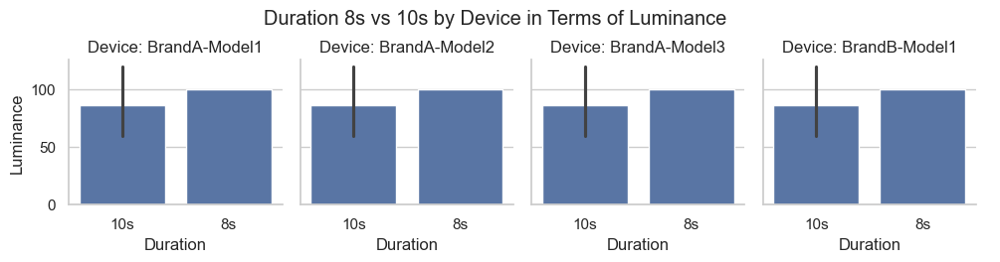

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_plot = df_energy_clean.copy()
df_plot['duration'] = df_plot['videoName'].str.extract(r'_(\d+s)_')
df_plot['luminance'] = df_plot['videoName'].str.extract(r'luminance_(\d+)').astype(int)

duration_device_luminance = (
    df_plot[['duration', 'device', 'luminance', 'videoName']]
    .drop_duplicates()
    .sort_values(by=['duration', 'device', 'luminance'])
)

print(duration_device_luminance)

g = sns.catplot(
    data=duration_device_luminance,
    x='duration',
    y='luminance',
    col='device',
    kind='bar',
    height=2.5,
    aspect=1.0
)

g.figure.suptitle('Duration 8s vs 10s by Device in Terms of Luminance', y=1.05)
g.set_axis_labels('Duration', 'Luminance')
g.set_titles('Device: {col_name}')
plt.show()

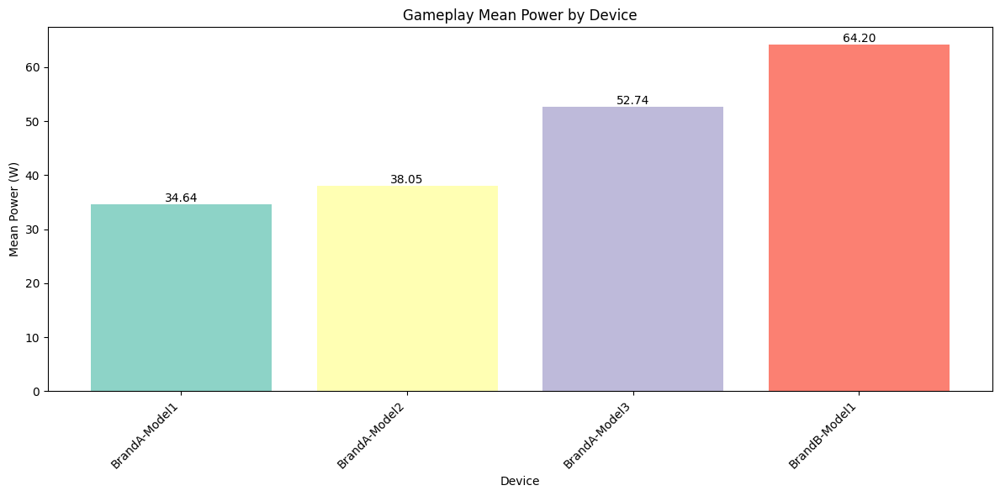

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

gameplay_df = df_energy_clean[
    df_energy_clean['videoName'].str.contains('gameplay', case=False, na=False)
].copy()

gameplay_device_mean_power = (
    gameplay_df
    .groupby('device', as_index=False)['Power']
    .mean()
    .rename(columns={'Power': 'mean_power'})
    .sort_values('mean_power', ascending=True)
)

colors = sns.color_palette('Set3', n_colors=len(gameplay_device_mean_power))

plt.figure(figsize=(12, 6))
bars = plt.bar(
    gameplay_device_mean_power['device'],
    gameplay_device_mean_power['mean_power'],
    color=colors
)

for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f'{height:.2f}',
        ha='center',
        va='bottom'
    )

plt.title('Gameplay Mean Power by Device')
plt.xlabel('Device')
plt.ylabel('Mean Power (W)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

                        videoName  luminanceReduction
0    gameplay_4k_10s_luminance_60                 5.0
1  timescapes_4k_8s_luminance_100                 5.0
2        tos_4k_10s_luminance_120                 5.0
3         tos_4k_10s_luminance_80                 5.0


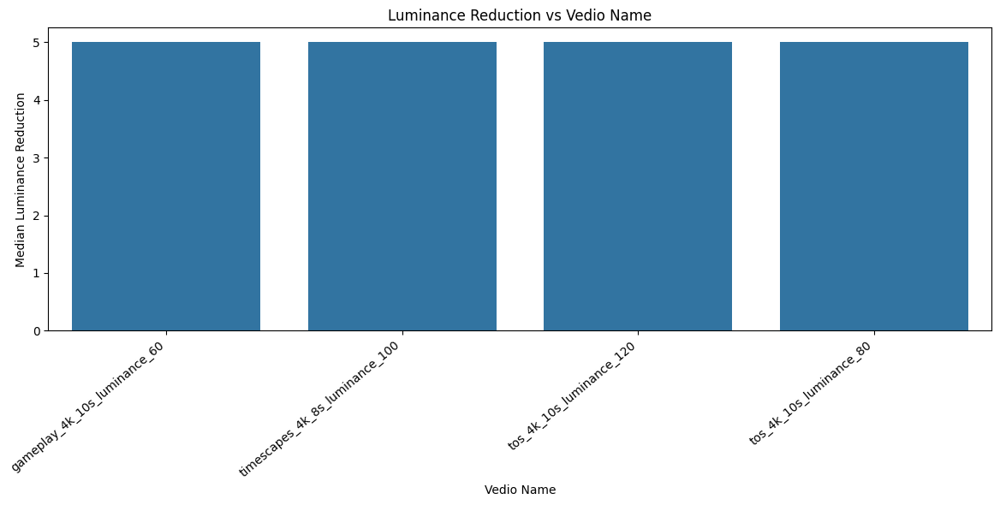

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

median_luminance_video = (
    df_energy_clean
    .groupby('videoName', as_index=False)['luminanceReduction']
    .median()
    .sort_values(by='luminanceReduction', ascending=True)
)

print(median_luminance_video)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=median_luminance_video,
    x='videoName',
    y='luminanceReduction'
)

plt.title('Luminance Reduction vs Vedio Name')
plt.xlabel('Vedio Name')
plt.ylabel('Median Luminance Reduction')
plt.xticks(rotation=40, ha='right')
plt.tight_layout()
plt.show()

                        videoName  luminance
0    gameplay_4k_10s_luminance_60         60
3         tos_4k_10s_luminance_80         80
1  timescapes_4k_8s_luminance_100        100
2        tos_4k_10s_luminance_120        120


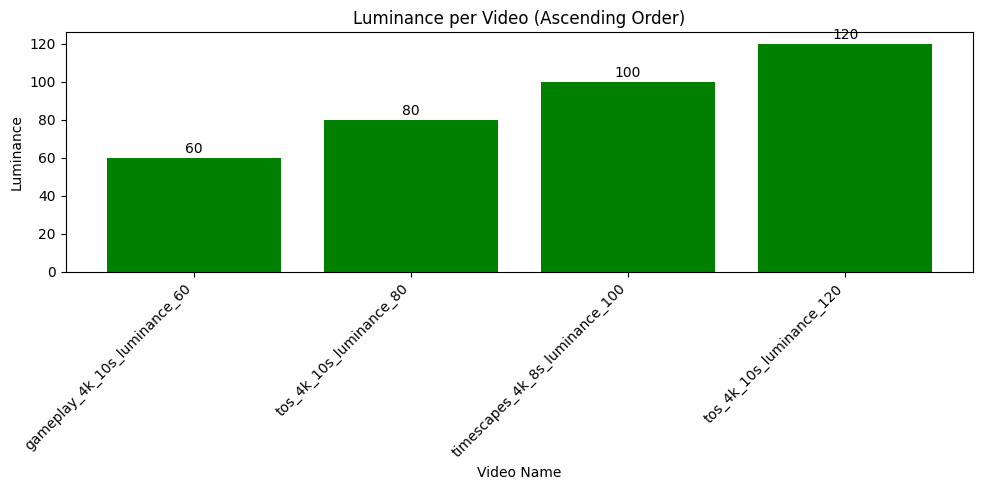

In [31]:
import matplotlib.pyplot as plt

# Extract the luminance value encoded in each video name
video_luminance = (
    df_energy_clean.assign(
        luminance=df_energy_clean["videoName"].str.extract(r"luminance_(\d+)").astype(int)
    )[["videoName", "luminance"]]
    .drop_duplicates()
    .sort_values("luminance", ascending=True)
)

print(video_luminance)

# Plot
plt.figure(figsize=(10, 5))
bars = plt.bar(
    video_luminance["videoName"],
    video_luminance["luminance"],
    color="green"
)

# Add labels on bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 1,
        f"{height:.0f}",
        ha="center",
        va="bottom"
    )

plt.xlabel("Video Name")
plt.ylabel("Luminance")
plt.title("Luminance per Video (Ascending Order)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

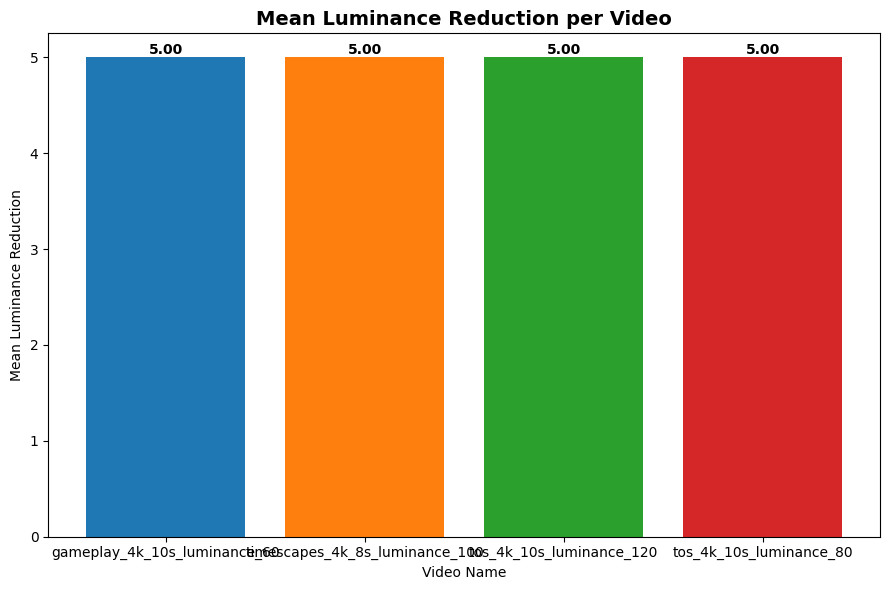

In [32]:
import matplotlib.pyplot as plt

# 1. Group by video and calculate mean luminance reduction (sorted descending)
summary = (
    df_energy_clean
    .groupby('videoName', as_index=False)['luminanceReduction']
    .mean()
    .sort_values(by='luminanceReduction', ascending=True)
)

# 2. Custom colours for each bar
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"]  # blue, orange, green, red

# 3. Plot the bar chart
plt.figure(figsize=(9,6))
bars = plt.bar(
    summary['videoName'],
    summary['luminanceReduction'],
    color=colors[:len(summary)]  # Use as many colors as needed
)

# 4. Add value labels on each bar
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height,
        f"{height:.2f}",        # format to 2 decimal places
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold"
    )

# 5. Titles and labels
plt.title("Mean Luminance Reduction per Video", fontsize=14, fontweight="bold")
plt.xlabel("Video Name")
plt.ylabel("Mean Luminance Reduction")
plt.tight_layout()

plt.show()

          device  luminanceReduction
0  BrandA-Model1                 5.0
1  BrandA-Model2                 5.0
2  BrandA-Model3                 5.0
3  BrandB-Model1                 5.0


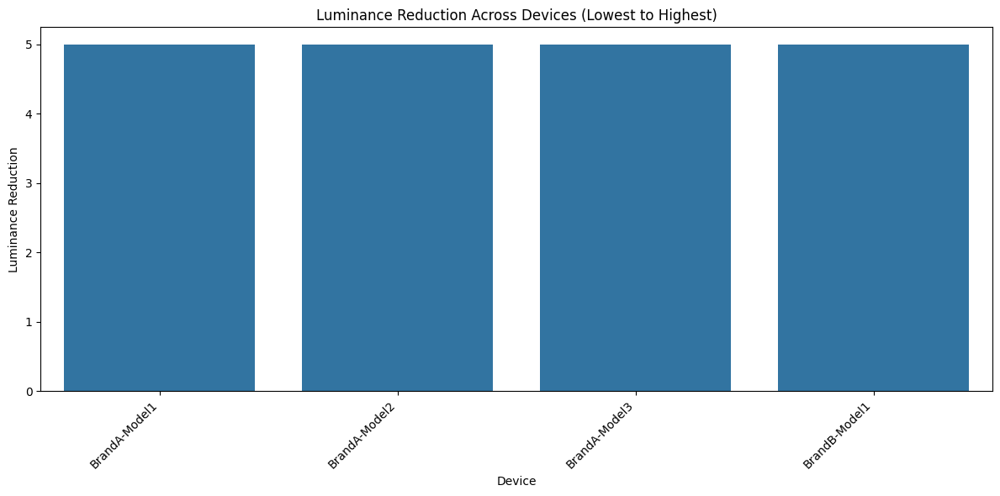

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate  luminance reduction for each device
device_luminance = (
    df_energy_clean
    .groupby('device', as_index=False)['luminanceReduction']
    .mean()
    .sort_values(by='luminanceReduction', ascending=True)
)

device_order = device_luminance['device'].tolist()

# Display the result
print(device_luminance)

# Plot bar chart
plt.figure(figsize=(12, 6))
sns.barplot(
    data=device_luminance,
    x='device',
    y='luminanceReduction',
    order=device_order
)

plt.title('Luminance Reduction Across Devices (Lowest to Highest)')
plt.xlabel('Device')
plt.ylabel('Luminance Reduction')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

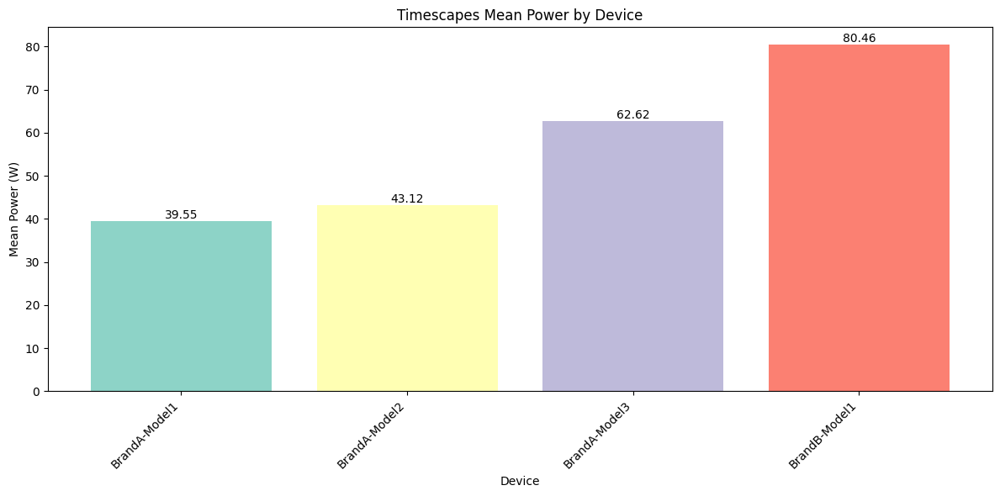

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

timescapes_df = df_energy_clean[
    df_energy_clean['videoName'].str.contains('timescapes', case=False, na=False)
].copy()

timescapes_device_mean_power = (
    timescapes_df
    .groupby('device', as_index=False)['Power']
    .mean()
    .rename(columns={'Power': 'mean_power'})
    .sort_values('mean_power', ascending=True)
)

colors = sns.color_palette('Set3', n_colors=len(timescapes_device_mean_power))

plt.figure(figsize=(12, 6))
bars = plt.bar(
    timescapes_device_mean_power['device'],
    timescapes_device_mean_power['mean_power'],
    color=colors
)

for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f'{height:.2f}',
        ha='center',
        va='bottom'
    )

plt.title('Timescapes Mean Power by Device')
plt.xlabel('Device')
plt.ylabel('Mean Power (W)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

          device  mean_power
0  BrandA-Model1   43.568636
1  BrandA-Model2   47.174375
2  BrandA-Model3   76.305170
3  BrandB-Model1   82.106591


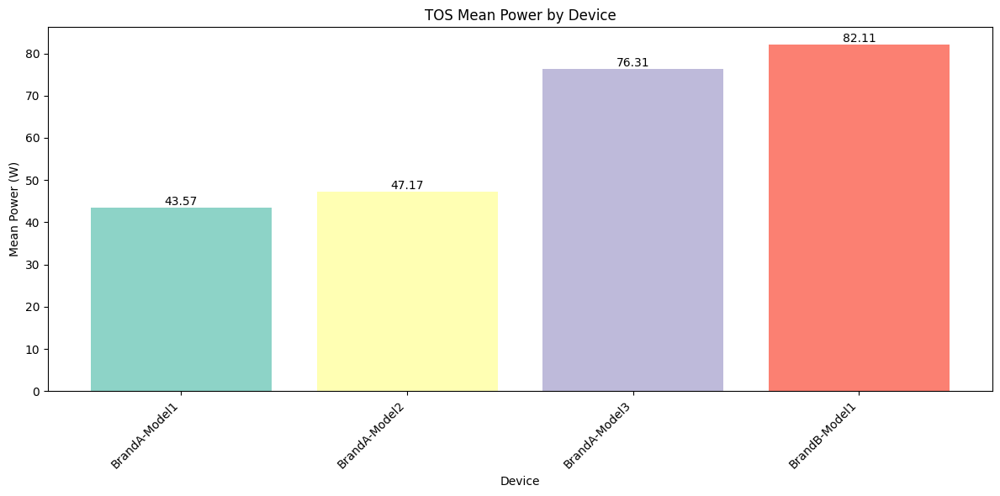

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter only TOS rows
tos_df = df_energy_clean[
    df_energy_clean['videoName'].str.contains('tos', case=False, na=False)
].copy()

# Calculate mean power by device and sort from lowest to highest
tos_device_mean_power = (
    tos_df
    .groupby('device', as_index=False)['Power']
    .mean()
    .rename(columns={'Power': 'mean_power'})
    .sort_values('mean_power', ascending=True)
)

print(tos_device_mean_power)

# Different color for each device
colors = sns.color_palette('Set3', n_colors=len(tos_device_mean_power))

plt.figure(figsize=(12, 6))
bars = plt.bar(
    tos_device_mean_power['device'],
    tos_device_mean_power['mean_power'],
    color=colors
)

# Show values on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f'{height:.2f}',
        ha='center',
        va='bottom'
    )

plt.title('TOS Mean Power by Device')
plt.xlabel('Device')
plt.ylabel('Mean Power (W)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

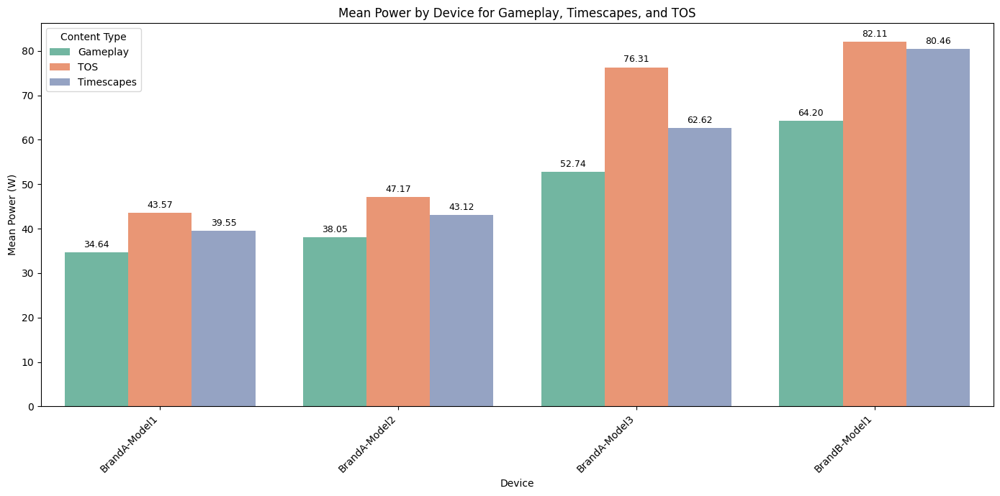

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

combined_df = df_energy_clean[
    df_energy_clean['videoName'].str.contains('gameplay|timescapes|tos', case=False, na=False)
].copy()

def get_content_type(name):
    name = str(name).lower()
    if 'gameplay' in name:
        return 'Gameplay'
    if 'timescapes' in name:
        return 'Timescapes'
    if 'tos' in name:
        return 'TOS'
    return 'Other'

combined_df['content_type'] = combined_df['videoName'].apply(get_content_type)

combined_mean_power = (
    combined_df
    .groupby(['content_type', 'device'], as_index=False)['Power']
    .mean()
    .rename(columns={'Power': 'mean_power'})
)

device_order = (
    combined_mean_power
    .groupby('device')['mean_power']
    .mean()
    .sort_values(ascending=True)
    .index
)

plt.figure(figsize=(14, 7))
ax = sns.barplot(
    data=combined_mean_power,
    x='device',
    y='mean_power',
    hue='content_type',
    order=device_order,
    palette='Set2'
)

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3, fontsize=9)

plt.title('Mean Power by Device for Gameplay, Timescapes, and TOS')
plt.xlabel('Device')
plt.ylabel('Mean Power (W)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Content Type')
plt.tight_layout()
plt.show()

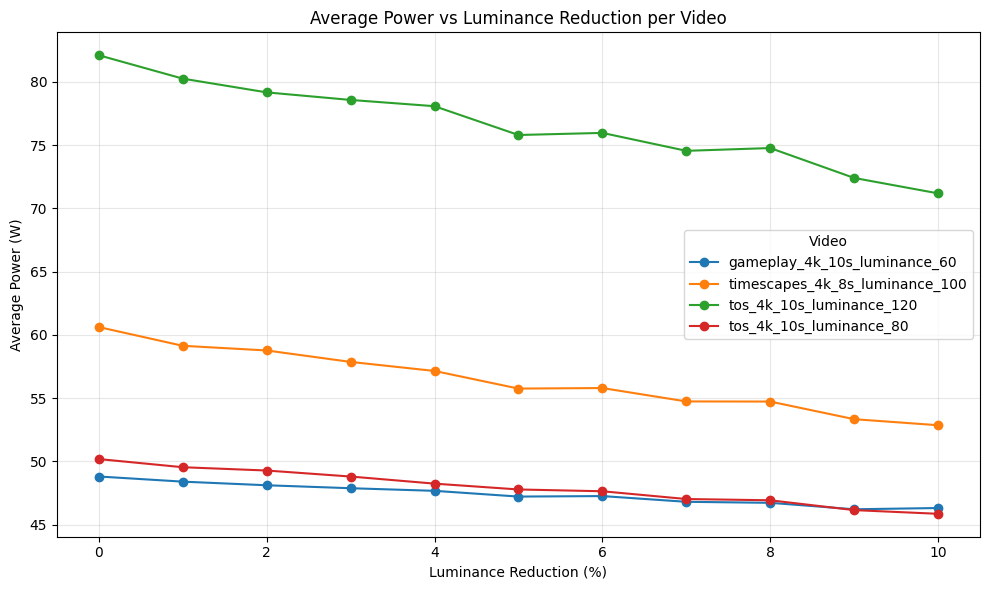

In [37]:
# Average Power vs Luminance Reduction per Video
avg_power_vs_luminance = df_energy_clean.groupby(['videoName', 'luminanceReduction'])['Power'].mean().reset_index()

# Plot for each video
plt.figure(figsize=(10, 6))
for video in avg_power_vs_luminance['videoName'].unique():
    data = avg_power_vs_luminance[avg_power_vs_luminance['videoName'] == video]
    plt.plot(data['luminanceReduction'], data['Power'], marker='o', label=video)

plt.xlabel('Luminance Reduction (%)')
plt.ylabel('Average Power (W)')
plt.title('Average Power vs Luminance Reduction per Video')
plt.legend(title='Video')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

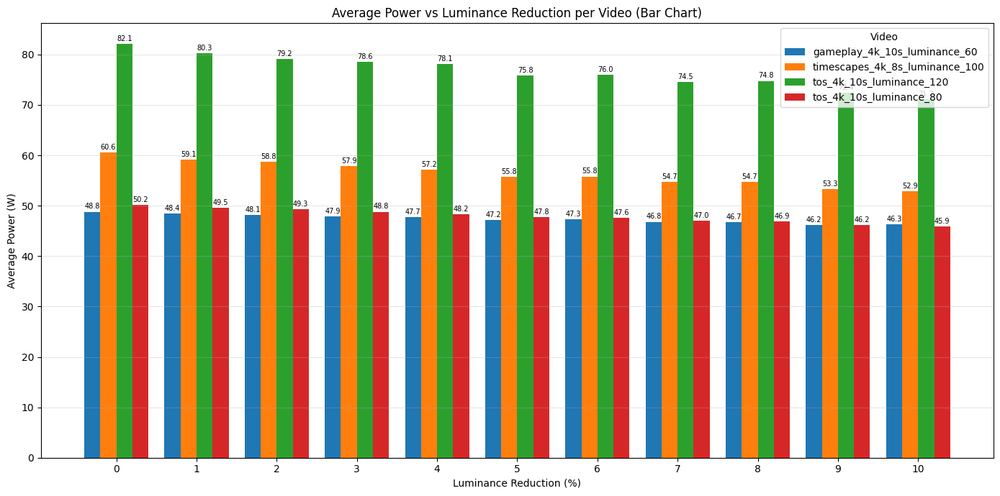

In [38]:
# Bar Chart: Average Power vs Luminance Reduction per Video
avg_power_vs_luminance = df_energy_clean.groupby(['videoName', 'luminanceReduction'])['Power'].mean().reset_index()

videos = avg_power_vs_luminance['videoName'].unique()
luminance_levels = sorted(avg_power_vs_luminance['luminanceReduction'].unique())
x = np.arange(len(luminance_levels))
width = 0.2

fig, ax = plt.subplots(figsize=(14, 7))
for i, video in enumerate(videos):
    data = avg_power_vs_luminance[avg_power_vs_luminance['videoName'] == video]
    bars = ax.bar(x + i * width, data['Power'], width, label=video)
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height + 0.3, f'{height:.1f}',
                ha='center', va='bottom', fontsize=7)

ax.set_xlabel('Luminance Reduction (%)')
ax.set_ylabel('Average Power (W)')
ax.set_title('Average Power vs Luminance Reduction per Video (Bar Chart)')
ax.set_xticks(x + width * (len(videos) - 1) / 2)
ax.set_xticklabels(luminance_levels)
ax.legend(title='Video')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

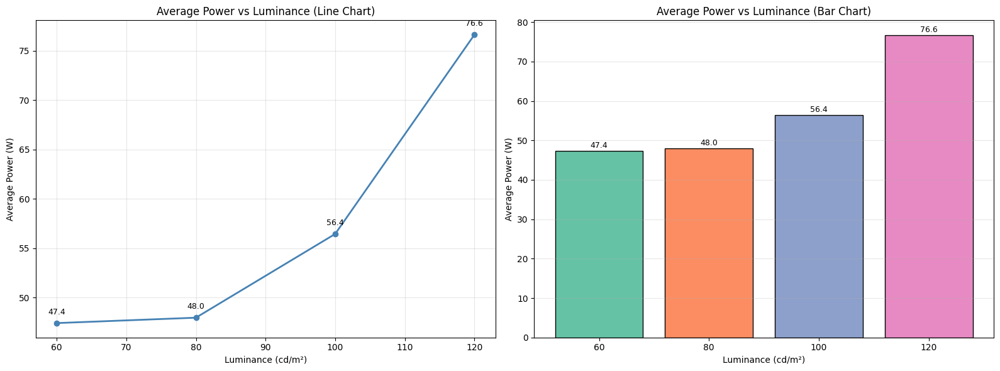

In [40]:
# Extract luminance level from videoName (e.g. gameplay_4k_10s_luminance_60 -> 60)
df_energy_clean['luminance'] = df_energy_clean['videoName'].str.extract(r'luminance_(\d+)').astype(int)

# Average Power per Luminance level
avg_power_by_luminance = df_energy_clean.groupby('luminance')['Power'].mean().reset_index()

# Line Chart: Power vs Luminance
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].plot(avg_power_by_luminance['luminance'], avg_power_by_luminance['Power'], marker='o', color='steelblue', linewidth=2)
for _, row in avg_power_by_luminance.iterrows():
    axes[0].annotate(f'{row["Power"]:.1f}', (row['luminance'], row['Power']),
                     textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axes[0].set_xlabel('Luminance (cd/m²)')
axes[0].set_ylabel('Average Power (W)')
axes[0].set_title('Average Power vs Luminance (Line Chart)')
axes[0].grid(True, alpha=0.3)

# Bar Chart: Power vs Luminance
bars = axes[1].bar(avg_power_by_luminance['luminance'].astype(str), avg_power_by_luminance['Power'],
                   color=sns.color_palette('Set2', len(avg_power_by_luminance)), edgecolor='black')
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, height + 0.3, f'{height:.1f}',
                 ha='center', va='bottom', fontsize=9)
axes[1].set_xlabel('Luminance (cd/m²)')
axes[1].set_ylabel('Average Power (W)')
axes[1].set_title('Average Power vs Luminance (Bar Chart)')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

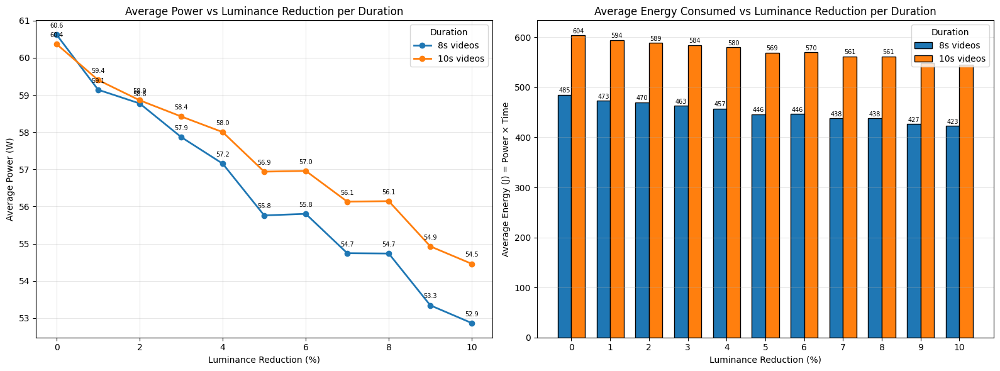

In [41]:
# Extract video duration (time spent) from videoName (e.g. gameplay_4k_10s -> 10)
df_energy_clean['duration_s'] = df_energy_clean['videoName'].str.extract(r'_(\d+)s_').astype(int)

# Calculate Energy consumed = Power (W) × Duration (s) in Joules
df_energy_clean['Energy_J'] = df_energy_clean['Power'] * df_energy_clean['duration_s']

# Average Power per luminance reduction and duration
power_by_reduction_duration = df_energy_clean.groupby(['luminanceReduction', 'duration_s']).agg(
    Avg_Power=('Power', 'mean'),
    Avg_Energy_J=('Energy_J', 'mean')
).reset_index()

durations = sorted(power_by_reduction_duration['duration_s'].unique())

# --- Line Chart: Power vs Reduction per Duration ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

for dur in durations:
    subset = power_by_reduction_duration[power_by_reduction_duration['duration_s'] == dur]
    axes[0].plot(subset['luminanceReduction'], subset['Avg_Power'],
                 marker='o', linewidth=2, label=f'{dur}s videos')
    for _, row in subset.iterrows():
        axes[0].annotate(f'{row["Avg_Power"]:.1f}',
                         (row['luminanceReduction'], row['Avg_Power']),
                         textcoords="offset points", xytext=(0, 8), ha='center', fontsize=7)

axes[0].set_xlabel('Luminance Reduction (%)')
axes[0].set_ylabel('Average Power (W)')
axes[0].set_title('Average Power vs Luminance Reduction per Duration')
axes[0].legend(title='Duration')
axes[0].grid(True, alpha=0.3)

# --- Bar Chart: Energy (Power × Time) vs Reduction per Duration ---
reductions = sorted(power_by_reduction_duration['luminanceReduction'].unique())
x = np.arange(len(reductions))
width = 0.35

for i, dur in enumerate(durations):
    subset = power_by_reduction_duration[power_by_reduction_duration['duration_s'] == dur]
    bars = axes[1].bar(x + i * width, subset['Avg_Energy_J'], width, label=f'{dur}s videos', edgecolor='black')
    for bar in bars:
        height = bar.get_height()
        axes[1].text(bar.get_x() + bar.get_width() / 2, height + 2, f'{height:.0f}',
                     ha='center', va='bottom', fontsize=7)

axes[1].set_xlabel('Luminance Reduction (%)')
axes[1].set_ylabel('Average Energy (J) = Power × Time')
axes[1].set_title('Average Energy Consumed vs Luminance Reduction per Duration')
axes[1].set_xticks(x + width * (len(durations) - 1) / 2)
axes[1].set_xticklabels(reductions)
axes[1].legend(title='Duration')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

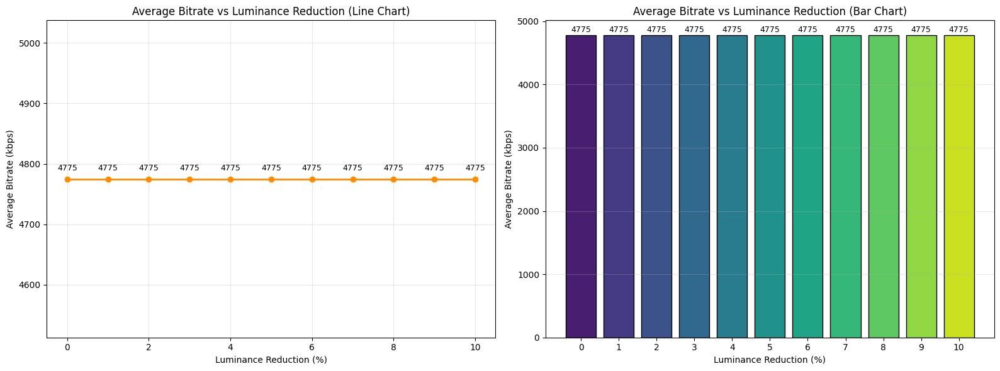

In [42]:
# Average Bitrate vs Luminance Reduction
avg_bitrate_vs_reduction = df_energy_clean.groupby('luminanceReduction')['bitrate'].mean().reset_index()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Line Chart
axes[0].plot(avg_bitrate_vs_reduction['luminanceReduction'], avg_bitrate_vs_reduction['bitrate'],
             marker='o', color='darkorange', linewidth=2)
for _, row in avg_bitrate_vs_reduction.iterrows():
    axes[0].annotate(f'{row["bitrate"]:.0f}',
                     (row['luminanceReduction'], row['bitrate']),
                     textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
axes[0].set_xlabel('Luminance Reduction (%)')
axes[0].set_ylabel('Average Bitrate (kbps)')
axes[0].set_title('Average Bitrate vs Luminance Reduction (Line Chart)')
axes[0].grid(True, alpha=0.3)

# Bar Chart
bars = axes[1].bar(avg_bitrate_vs_reduction['luminanceReduction'].astype(str),
                   avg_bitrate_vs_reduction['bitrate'],
                   color=sns.color_palette('viridis', len(avg_bitrate_vs_reduction)), edgecolor='black')
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width() / 2, height + 20, f'{height:.0f}',
                 ha='center', va='bottom', fontsize=9)
axes[1].set_xlabel('Luminance Reduction (%)')
axes[1].set_ylabel('Average Bitrate (kbps)')
axes[1].set_title('Average Bitrate vs Luminance Reduction (Bar Chart)')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

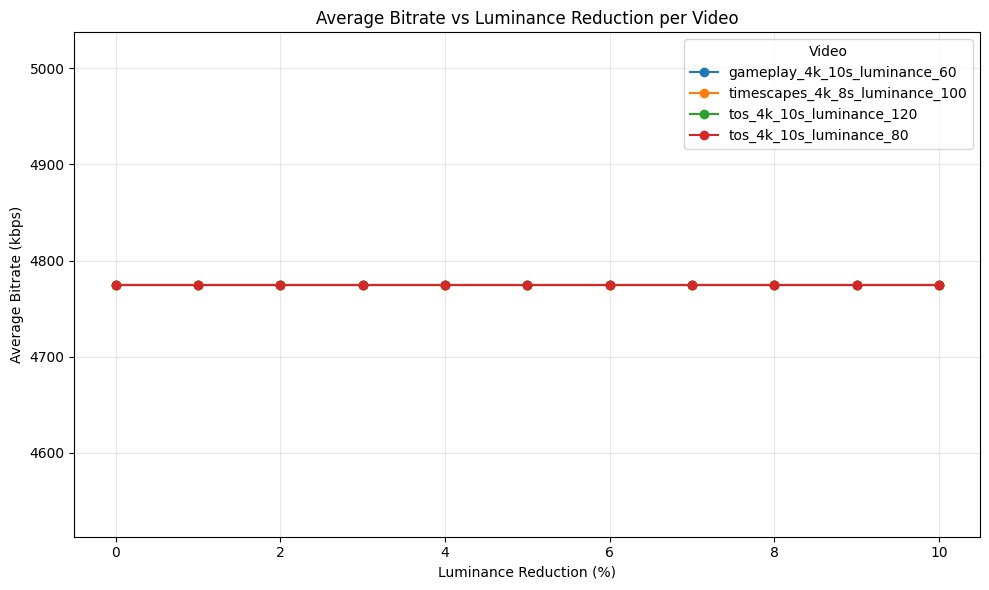

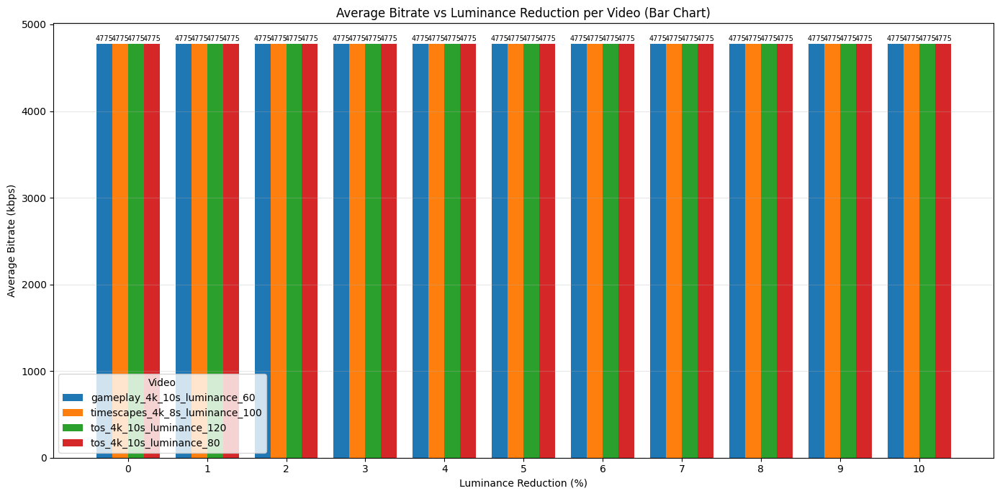

In [44]:
# Average Bitrate vs Luminance Reduction per Video
avg_bitrate_per_video = df_energy_clean.groupby(['videoName', 'luminanceReduction'])['bitrate'].mean().reset_index()

# Line Chart
plt.figure(figsize=(10, 6))
for video in avg_bitrate_per_video['videoName'].unique():
    data = avg_bitrate_per_video[avg_bitrate_per_video['videoName'] == video]
    plt.plot(data['luminanceReduction'], data['bitrate'], marker='o', label=video)

plt.xlabel('Luminance Reduction (%)')
plt.ylabel('Average Bitrate (kbps)')
plt.title('Average Bitrate vs Luminance Reduction per Video')
plt.legend(title='Video')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Bar Chart
videos = avg_bitrate_per_video['videoName'].unique()
luminance_levels = sorted(avg_bitrate_per_video['luminanceReduction'].unique())
x = np.arange(len(luminance_levels))
width = 0.2

fig, ax = plt.subplots(figsize=(14, 7))
for i, video in enumerate(videos):
    data = avg_bitrate_per_video[avg_bitrate_per_video['videoName'] == video]
    bars = ax.bar(x + i * width, data['bitrate'], width, label=video)
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height + 20, f'{height:.0f}',
                ha='center', va='bottom', fontsize=7)

ax.set_xlabel('Luminance Reduction (%)')
ax.set_ylabel('Average Bitrate (kbps)')
ax.set_title('Average Bitrate vs Luminance Reduction per Video (Bar Chart)')
ax.set_xticks(x + width * (len(videos) - 1) / 2)
ax.set_xticklabels(luminance_levels)
ax.legend(title='Video')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

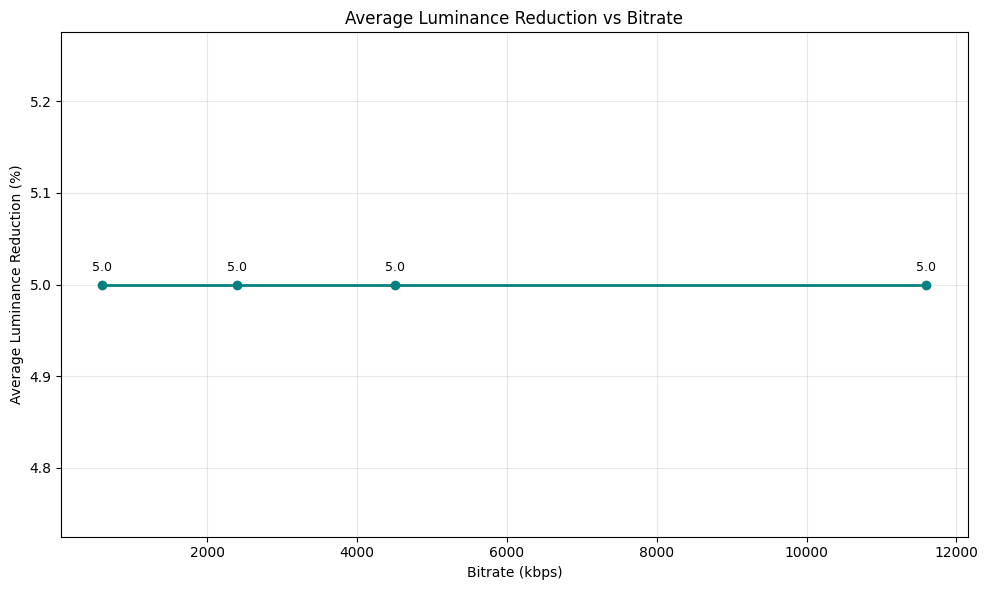

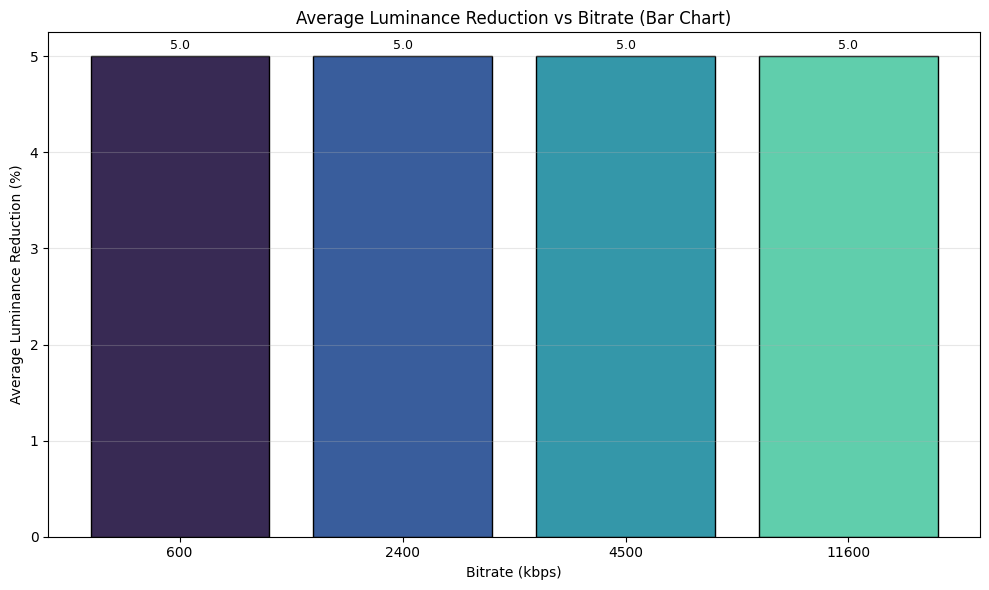

In [46]:
# Average Luminance Reduction vs Bitrate
avg_lum_vs_bitrate = df_energy_clean.groupby('bitrate')['luminanceReduction'].mean().reset_index()

# Line Chart
plt.figure(figsize=(10, 6))
plt.plot(avg_lum_vs_bitrate['bitrate'], avg_lum_vs_bitrate['luminanceReduction'],
         marker='o', color='teal', linewidth=2)
for _, row in avg_lum_vs_bitrate.iterrows():
    plt.annotate(f'{row["luminanceReduction"]:.1f}',
                 (row['bitrate'], row['luminanceReduction']),
                 textcoords="offset points", xytext=(0, 10), ha='center', fontsize=9)
plt.xlabel('Bitrate (kbps)')
plt.ylabel('Average Luminance Reduction (%)')
plt.title('Average Luminance Reduction vs Bitrate')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Bar Chart
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(avg_lum_vs_bitrate['bitrate'].astype(str),
              avg_lum_vs_bitrate['luminanceReduction'],
              color=sns.color_palette('mako', len(avg_lum_vs_bitrate)), edgecolor='black')
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.05, f'{height:.1f}',
            ha='center', va='bottom', fontsize=9)
ax.set_xlabel('Bitrate (kbps)')
ax.set_ylabel('Average Luminance Reduction (%)')
ax.set_title('Average Luminance Reduction vs Bitrate (Bar Chart)')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

UNIVARIATE ANALYSIS - BITRATE

1. DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------
Count:           704
Mean:            4775.0000
Median:          3450.0000
Minimum:         600.0000
Maximum:         11600.0000
Std Deviation:   4178.1182
Range:           11000.0000

2. FREQUENCY DISTRIBUTION
--------------------------------------------------------------------------------
bitrate
600      176
2400     176
4500     176
11600    176
Name: count, dtype: int64

3. SKEWNESS AND KURTOSIS
--------------------------------------------------------------------------------
Skewness:        0.7960
  Interpretation: Right-skewed (positively skewed)

Kurtosis:        -0.9388
  Interpretation: Light-tailed (platykurtic)


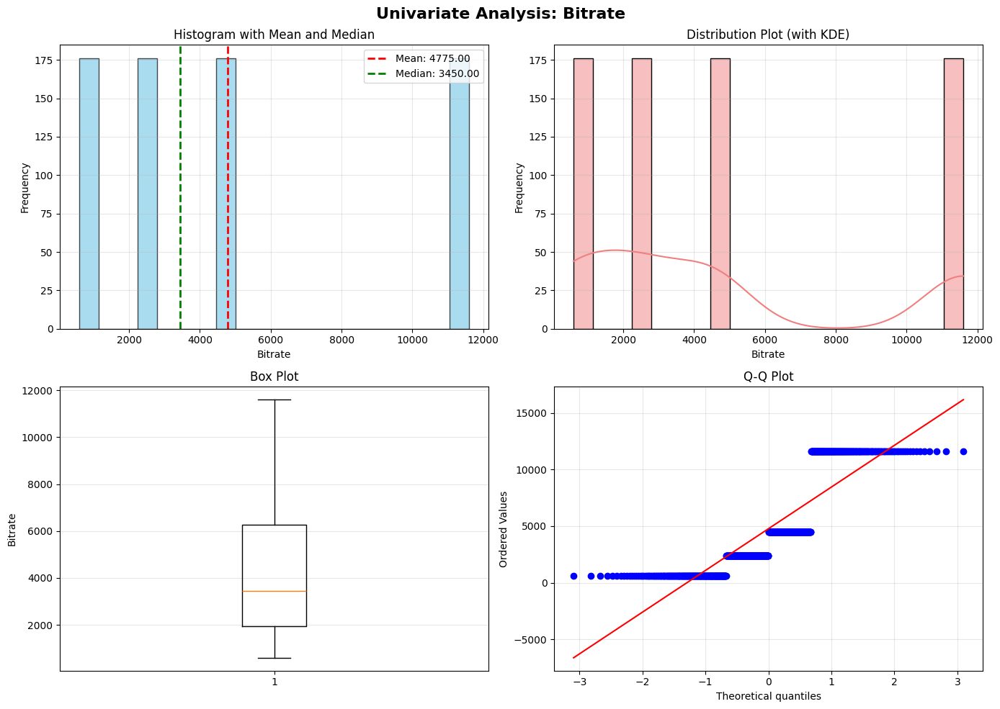


SUMMARY TABLE


,Statistic,Value
0,Count,704
1,Mean,4775.0000
2,Median,3450.0000
3,Minimum,600.0000
4,Maximum,11600.0000
5,Std Deviation,4178.1182
6,Range,11000.0000
7,Skewness,0.7960
8,Kurtosis,-0.9388


In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from IPython.display import display

# Assuming df_energy_clean contains the cleaned energy consumption data
# Extract bitrate column
bitrate = df_energy_clean['bitrate']

print("=" * 80)
print("UNIVARIATE ANALYSIS - BITRATE")
print("=" * 80)

# 1. DESCRIPTIVE STATISTICS (from previous analysis)
print("\n1. DESCRIPTIVE STATISTICS")
print("-" * 80)
print(f"Count:           {bitrate.count()}")
print(f"Mean:            {bitrate.mean():.4f}")
print(f"Median:          {bitrate.median():.4f}")
print(f"Minimum:         {bitrate.min():.4f}")
print(f"Maximum:         {bitrate.max():.4f}")
print(f"Std Deviation:   {bitrate.std():.4f}")
print(f"Range:           {bitrate.max() - bitrate.min():.4f}")

# 2. FREQUENCY DISTRIBUTION
print("\n2. FREQUENCY DISTRIBUTION")
print("-" * 80)
freq_dist = bitrate.value_counts().sort_index()
print(freq_dist)

# 3. SKEWNESS AND KURTOSIS
print("\n3. SKEWNESS AND KURTOSIS")
print("-" * 80)
skewness = stats.skew(bitrate)
kurtosis_val = stats.kurtosis(bitrate)
print(f"Skewness:        {skewness:.4f}")
print(f"  Interpretation: ", end="")
if abs(skewness) < 0.5:
    print("Approximately symmetric")
elif skewness > 0:
    print("Right-skewed (positively skewed)")
else:
    print("Left-skewed (negatively skewed)")

print(f"\nKurtosis:        {kurtosis_val:.4f}")
print(f"  Interpretation: ", end="")
if abs(kurtosis_val) < 0.5:
    print("Normal distribution (mesokurtic)")
elif kurtosis_val > 0:
    print("Heavy-tailed (leptokurtic)")
else:
    print("Light-tailed (platykurtic)")

# 4. CREATE VISUALIZATIONS
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Univariate Analysis: Bitrate', fontsize=16, fontweight='bold')

# Histogram with KDE
axes[0, 0].hist(bitrate, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(bitrate.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {bitrate.mean():.2f}')
axes[0, 0].axvline(bitrate.median(), color='green', linestyle='--', linewidth=2, label=f'Median: {bitrate.median():.2f}')
axes[0, 0].set_xlabel('Bitrate')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Histogram with Mean and Median')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Distribution Plot
sns.histplot(bitrate, bins=20, kde=True, color='lightcoral', ax=axes[0, 1])
axes[0, 1].set_xlabel('Bitrate')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution Plot (with KDE)')
axes[0, 1].grid(True, alpha=0.3)

# Box Plot
axes[1, 0].boxplot(bitrate, vert=True)
axes[1, 0].set_ylabel('Bitrate')
axes[1, 0].set_title('Box Plot')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Q-Q Plot
stats.probplot(bitrate, dist="norm", plot=axes[1, 1])
axes[1, 1].set_title('Q-Q Plot')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Summary Table
print("\n" + "=" * 80)
print("SUMMARY TABLE")
print("=" * 80)
summary_data = {
    'Statistic': ['Count', 'Mean', 'Median', 'Minimum', 'Maximum', 'Std Deviation', 'Range', 'Skewness', 'Kurtosis'],
    'Value': [
        f"{bitrate.count()}",
        f"{bitrate.mean():.4f}",
        f"{bitrate.median():.4f}",
        f"{bitrate.min():.4f}",
        f"{bitrate.max():.4f}",
        f"{bitrate.std():.4f}",
        f"{bitrate.max() - bitrate.min():.4f}",
        f"{skewness:.4f}",
        f"{kurtosis_val:.4f}"
    ]
}
summary_df = pd.DataFrame(summary_data)

styled_summary = summary_df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#1976D2'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'left'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
])

display(styled_summary)

UNIVARIATE ANALYSIS - POWER

1. DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------
Count:           704
Mean:            57.1051
Median:          53.3200
Minimum:         33.2200
Maximum:         110.6000
Std Deviation:   20.3226
Range:           77.3800

2. FREQUENCY DISTRIBUTION
--------------------------------------------------------------------------------
Power
33.220000     1
33.260000     1
33.280000     1
33.340000     1
33.400000     1
33.420000     1
33.460000     1
33.520000     1
33.540000     1
33.560000     1
33.580000     1
33.640000     1
33.700000     1
33.720000     1
33.780000     2
33.800000     1
33.820000     1
33.820000     1
33.860000     1
33.900000     1
33.980000     1
34.000000     1
34.020000     1
34.040000     1
34.100000     1
34.140000     2
34.160000     1
34.180000     1
34.220000     1
34.240000     1
34.280000     1
34.320000     1
34.380000     2
34.400000     1
34.420000     1
34.440000     2
34

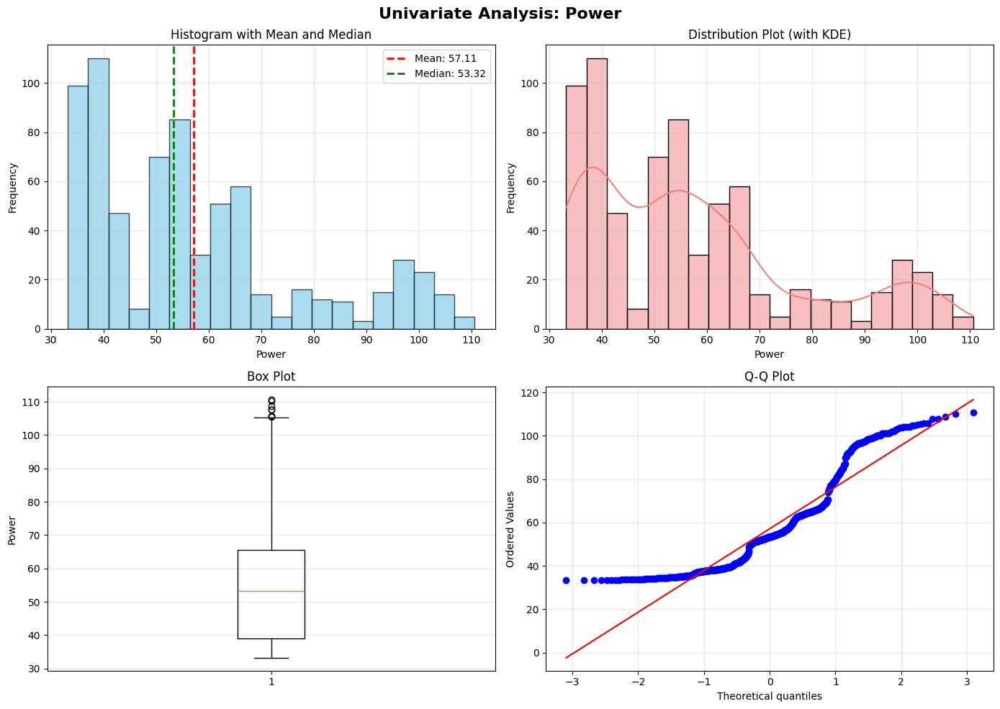


SUMMARY TABLE


,Statistic,Value
0,Count,704
1,Mean,57.1051
2,Median,53.3200
3,Minimum,33.2200
4,Maximum,110.6000
5,Std Deviation,20.3226
6,Range,77.3800
7,Skewness,0.9097
8,Kurtosis,-0.1064


In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from IPython.display import display

# Assuming df_energy_clean contains the cleaned energy consumption data
# Extract power column
power = df_energy_clean['Power']

print("=" * 80)
print("UNIVARIATE ANALYSIS - POWER")
print("=" * 80)

# 1. DESCRIPTIVE STATISTICS (from previous analysis)
print("\n1. DESCRIPTIVE STATISTICS")
print("-" * 80)
print(f"Count:           {power.count()}")
print(f"Mean:            {power.mean():.4f}")
print(f"Median:          {power.median():.4f}")
print(f"Minimum:         {power.min():.4f}")
print(f"Maximum:         {power.max():.4f}")
print(f"Std Deviation:   {power.std():.4f}")
print(f"Range:           {power.max() - power.min():.4f}")

# 2. FREQUENCY DISTRIBUTION
print("\n2. FREQUENCY DISTRIBUTION")
print("-" * 80)
freq_dist = power.value_counts().sort_index()
print(freq_dist)

# 3. SKEWNESS AND KURTOSIS
print("\n3. SKEWNESS AND KURTOSIS")
print("-" * 80)
skewness = stats.skew(power)
kurtosis_val = stats.kurtosis(power)
print(f"Skewness:        {skewness:.4f}")
print(f"  Interpretation: ", end="")
if abs(skewness) < 0.5:
    print("Approximately symmetric")
elif skewness > 0:
    print("Right-skewed (positively skewed)")
else:
    print("Left-skewed (negatively skewed)")

print(f"\nKurtosis:        {kurtosis_val:.4f}")
print(f"  Interpretation: ", end="")
if abs(kurtosis_val) < 0.5:
    print("Normal distribution (mesokurtic)")
elif kurtosis_val > 0:
    print("Heavy-tailed (leptokurtic)")
else:
    print("Light-tailed (platykurtic)")

# 4. CREATE VISUALIZATIONS
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Univariate Analysis: Power', fontsize=16, fontweight='bold')

# Histogram with KDE
axes[0, 0].hist(power, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(power.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {power.mean():.2f}')
axes[0, 0].axvline(power.median(), color='green', linestyle='--', linewidth=2, label=f'Median: {power.median():.2f}')
axes[0, 0].set_xlabel('Power')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Histogram with Mean and Median')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Distribution Plot
sns.histplot(power, bins=20, kde=True, color='lightcoral', ax=axes[0, 1])
axes[0, 1].set_xlabel('Power')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution Plot (with KDE)')
axes[0, 1].grid(True, alpha=0.3)

# Box Plot
axes[1, 0].boxplot(power, vert=True)
axes[1, 0].set_ylabel('Power')
axes[1, 0].set_title('Box Plot')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Q-Q Plot
stats.probplot(power, dist="norm", plot=axes[1, 1])
axes[1, 1].set_title('Q-Q Plot')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Summary Table
print("\n" + "=" * 80)
print("SUMMARY TABLE")
print("=" * 80)
summary_data = {
    'Statistic': ['Count', 'Mean', 'Median', 'Minimum', 'Maximum', 'Std Deviation', 'Range', 'Skewness', 'Kurtosis'],
    'Value': [
        f"{power.count()}",
        f"{power.mean():.4f}",
        f"{power.median():.4f}",
        f"{power.min():.4f}",
        f"{power.max():.4f}",
        f"{power.std():.4f}",
        f"{power.max() - power.min():.4f}",
        f"{skewness:.4f}",
        f"{kurtosis_val:.4f}"
    ]
}
summary_df = pd.DataFrame(summary_data)

styled_summary = summary_df.style.set_properties(**{
    'background-color': '#ffffff',
    'border': '1px solid #ddd',
    'color': '#000000',
    'padding': '8px'
}).set_table_styles([
    {'selector': 'th', 'props': [
        ('background-color', '#1976D2'),
        ('color', 'white'),
        ('text-align', 'center'),
        ('border', '1px solid #ddd'),
        ('padding', '10px'),
        ('font-weight', 'bold')
    ]},
    {'selector': 'td', 'props': [
        ('text-align', 'left'),
        ('border', '1px solid #ddd'),
        ('padding', '8px'),
        ('color', '#333333')
    ]},
])

display(styled_summary)

BIVARIATE ANALYSIS - SCATTER PLOTS
Correlation (Luminance Reduction vs Power): -0.0939
Correlation (Bitrate vs Power): 0.0181


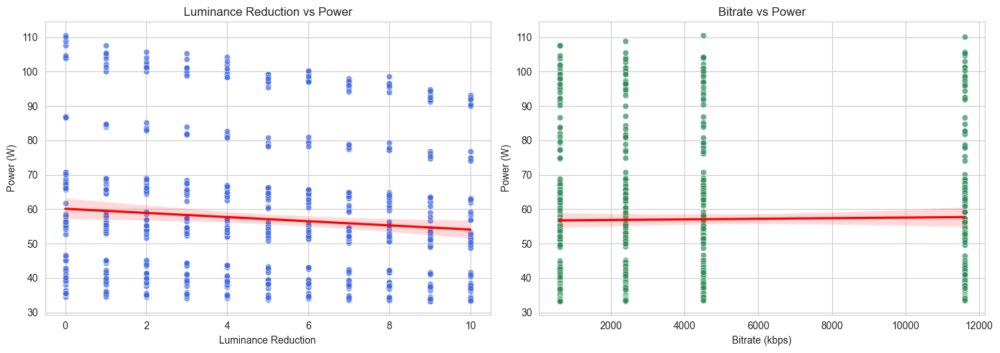

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming df_energy_clean is your cleaned dataset
# Keep only needed columns and drop missing rows for safe plotting
biv_df = df_energy_clean[['luminanceReduction', 'bitrate', 'Power']].dropna().copy()

# Correlation values
corr_lum_power = biv_df['luminanceReduction'].corr(biv_df['Power'])
corr_bitrate_power = biv_df['bitrate'].corr(biv_df['Power'])

print("=" * 80)
print("BIVARIATE ANALYSIS - SCATTER PLOTS")
print("=" * 80)
print(f"Correlation (Luminance Reduction vs Power): {corr_lum_power:.4f}")
print(f"Correlation (Bitrate vs Power): {corr_bitrate_power:.4f}")

# Plot settings
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 1) Luminance Reduction vs Power
sns.scatterplot(
    data=biv_df,
    x='luminanceReduction',
    y='Power',
    alpha=0.7,
    color='royalblue',
    ax=axes[0]
)
sns.regplot(
    data=biv_df,
    x='luminanceReduction',
    y='Power',
    scatter=False,
    color='red',
    ax=axes[0]
)
axes[0].set_title('Luminance Reduction vs Power')
axes[0].set_xlabel('Luminance Reduction')
axes[0].set_ylabel('Power (W)')

# 2) Bitrate vs Power
sns.scatterplot(
    data=biv_df,
    x='bitrate',
    y='Power',
    alpha=0.7,
    color='seagreen',
    ax=axes[1]
)
sns.regplot(
    data=biv_df,
    x='bitrate',
    y='Power',
    scatter=False,
    color='red',
    ax=axes[1]
)
axes[1].set_title('Bitrate vs Power')
axes[1].set_xlabel('Bitrate (kbps)')
axes[1].set_ylabel('Power (W)')

plt.tight_layout()
plt.show() 

BIVARIATE ANALYSIS - LINE PLOTS
Correlation (Luminance Reduction vs Power): -0.0939
Correlation (Bitrate vs Power): 0.0181


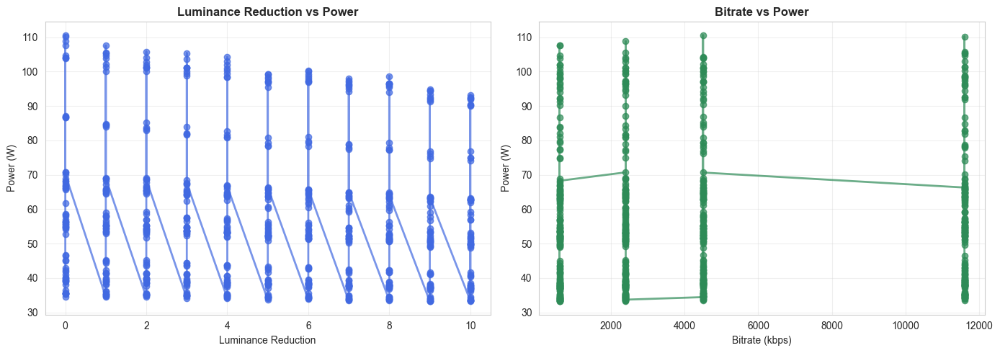

In [50]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df_energy_clean is your cleaned dataset
# Sort by x-axis values for proper line plotting
lum_power_df = df_energy_clean[['luminanceReduction', 'Power']].dropna().copy()
lum_power_df = lum_power_df.sort_values('luminanceReduction')

bitrate_power_df = df_energy_clean[['bitrate', 'Power']].dropna().copy()
bitrate_power_df = bitrate_power_df.sort_values('bitrate')

# Correlation values
corr_lum_power = lum_power_df['luminanceReduction'].corr(lum_power_df['Power'])
corr_bitrate_power = bitrate_power_df['bitrate'].corr(bitrate_power_df['Power'])

print("=" * 80)
print("BIVARIATE ANALYSIS - LINE PLOTS")
print("=" * 80)
print(f"Correlation (Luminance Reduction vs Power): {corr_lum_power:.4f}")
print(f"Correlation (Bitrate vs Power): {corr_bitrate_power:.4f}")

# Plot settings
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 1) Luminance Reduction vs Power (Line Plot)
axes[0].plot(
    lum_power_df['luminanceReduction'],
    lum_power_df['Power'],
    marker='o',
    color='royalblue',
    linewidth=2,
    markersize=6,
    alpha=0.7
)
axes[0].set_title('Luminance Reduction vs Power', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Luminance Reduction')
axes[0].set_ylabel('Power (W)')
axes[0].grid(True, alpha=0.3)

# 2) Bitrate vs Power (Line Plot)
axes[1].plot(
    bitrate_power_df['bitrate'],
    bitrate_power_df['Power'],
    marker='o',
    color='seagreen',
    linewidth=2,
    markersize=6,
    alpha=0.7
)
axes[1].set_title('Bitrate vs Power', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Bitrate (kbps)')
axes[1].set_ylabel('Power (W)')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

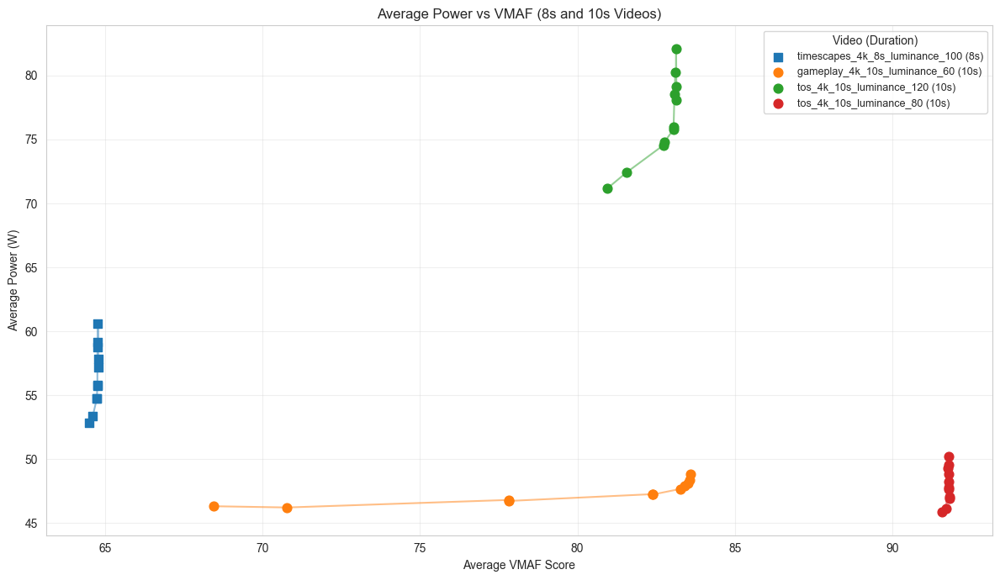

In [52]:
# Average Power vs VMAF for 8s and 10s videos
import json
import glob

# Load all VMAF scores from JSON files
vmaf_base = '../objective-score/vmaf'
vmaf_records = []

for folder in os.listdir(vmaf_base):
    folder_path = os.path.join(vmaf_base, folder)
    if not os.path.isdir(folder_path) or folder.startswith('.'):
        continue
    for fname in os.listdir(folder_path):
        if not fname.endswith('.json'):
            continue
        fpath = os.path.join(folder_path, fname)
        parts = fname.replace('vmaf_', '').replace('.json', '')
        tokens = parts.rsplit('_', 1)
        bitrate_str = tokens[1].replace('k', '')
        remaining = tokens[0]
        tokens2 = remaining.rsplit('_', 1)
        reduction = int(tokens2[1])
        videoName = tokens2[0]
        
        with open(fpath, 'r') as f:
            data = json.load(f)
        
        frames = data.get('vmaf', [])
        mean_vmaf = np.mean([frame['vmaf'] for frame in frames])
        
        vmaf_records.append({
            'videoName': videoName,
            'luminanceReduction': reduction,
            'bitrate': int(bitrate_str),
            'mean_vmaf': mean_vmaf
        })

df_vmaf = pd.DataFrame(vmaf_records)

# Merge VMAF with energy data
df_merged = pd.merge(df_energy_clean, df_vmaf, on=['videoName', 'luminanceReduction', 'bitrate'], how='inner')

# Extract duration (8s or 10s)
df_merged['duration_s'] = df_merged['videoName'].str.extract(r'_(\d+)s_').astype(int)

# Group by videoName and luminanceReduction to get average Power and VMAF
avg_power_vmaf = df_merged.groupby(['duration_s', 'videoName', 'luminanceReduction']).agg(
    Avg_Power=('Power', 'mean'),
    Avg_VMAF=('mean_vmaf', 'mean')
).reset_index()

# Create label with duration for legend
avg_power_vmaf['label'] = avg_power_vmaf['videoName'] + ' (' + avg_power_vmaf['duration_s'].astype(str) + 's)'

# Single plot with all videos, marker style by duration
fig, ax = plt.subplots(figsize=(12, 7))
markers = {8: 's', 10: 'o'}  # square for 8s, circle for 10s

for video in avg_power_vmaf['videoName'].unique():
    vdata = avg_power_vmaf[avg_power_vmaf['videoName'] == video].sort_values('Avg_VMAF')
    dur = vdata['duration_s'].iloc[0]
    label = vdata['label'].iloc[0]
    ax.scatter(vdata['Avg_VMAF'], vdata['Avg_Power'], label=label, s=60, marker=markers[dur])
    ax.plot(vdata['Avg_VMAF'], vdata['Avg_Power'], alpha=0.5)

ax.set_xlabel('Average VMAF Score')
ax.set_ylabel('Average Power (W)')
ax.set_title('Average Power vs VMAF (8s and 10s Videos)')
ax.legend(title='Video (Duration)', fontsize=9)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

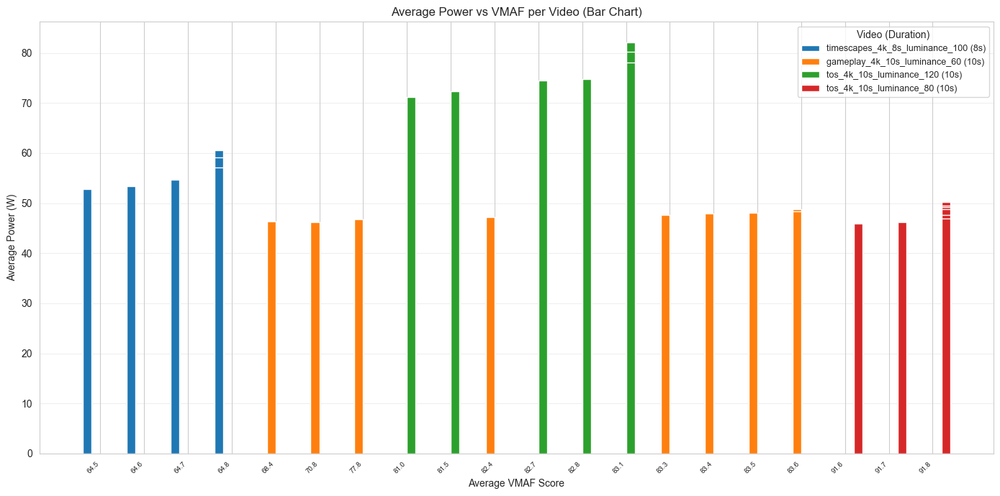

In [53]:
# Bar Chart: Average Power vs VMAF per Video
fig, ax = plt.subplots(figsize=(14, 7))

videos = avg_power_vmaf['videoName'].unique()
colors = sns.color_palette('tab10', len(videos))

# Round VMAF to nearest integer for cleaner x-axis labels
avg_power_vmaf['VMAF_rounded'] = avg_power_vmaf['Avg_VMAF'].round(1)

# Get sorted unique VMAF bins across all videos
all_vmaf = sorted(avg_power_vmaf['VMAF_rounded'].unique())
n_videos = len(videos)
width = 0.8 / n_videos
x = np.arange(len(all_vmaf))

for i, video in enumerate(videos):
    vdata = avg_power_vmaf[avg_power_vmaf['videoName'] == video].sort_values('VMAF_rounded')
    dur = vdata['duration_s'].iloc[0]
    label = f"{video} ({dur}s)"
    # Map each video's VMAF values to the shared x positions
    positions = [list(all_vmaf).index(v) for v in vdata['VMAF_rounded']]
    offset = (i - n_videos / 2 + 0.5) * width
    ax.bar(np.array(positions) + offset, vdata['Avg_Power'], width=width, label=label, color=colors[i])

ax.set_xlabel('Average VMAF Score')
ax.set_ylabel('Average Power (W)')
ax.set_title('Average Power vs VMAF per Video (Bar Chart)')
ax.set_xticks(x)
ax.set_xticklabels([f"{v:.1f}" for v in all_vmaf], rotation=45, ha='right', fontsize=7)
ax.legend(title='Video (Duration)', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

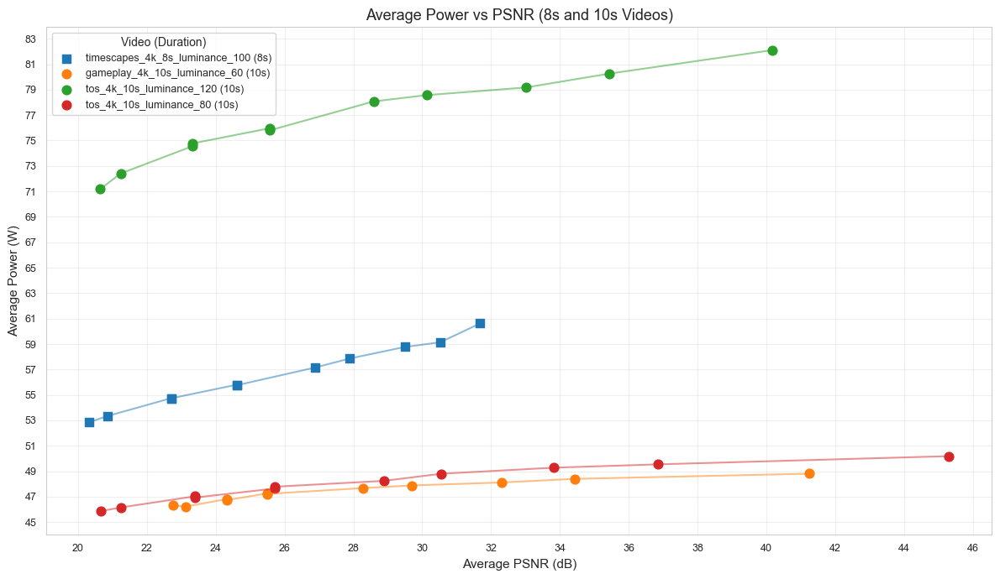

In [55]:
# Average Power vs PSNR per Video (8s and 10s)
import json

# Load PSNR scores from JSON files
psnr_base = '../objective-score/psnr-ssim'
psnr_records = []

for folder in os.listdir(psnr_base):
    folder_path = os.path.join(psnr_base, folder)
    if not os.path.isdir(folder_path) or folder.startswith('.'):
        continue
    for fname in os.listdir(folder_path):
        if not fname.endswith('.json'):
            continue
        fpath = os.path.join(folder_path, fname)
        parts = fname.replace('.json', '')
        tokens = parts.rsplit('_', 1)
        bitrate_str = tokens[1].replace('k', '')
        remaining = tokens[0]
        tokens2 = remaining.rsplit('_', 1)
        reduction = int(tokens2[1])
        videoName = tokens2[0]

        with open(fpath, 'r') as f:
            data = json.load(f)

        frames = data.get('psnr', [])
        mean_psnr = np.mean([frame['psnr_avg'] for frame in frames])

        psnr_records.append({
            'videoName': videoName,
            'luminanceReduction': reduction,
            'bitrate': int(bitrate_str),
            'mean_psnr': mean_psnr
        })

df_psnr = pd.DataFrame(psnr_records)

# Merge PSNR with energy data
df_psnr_merged = pd.merge(df_energy_clean, df_psnr, on=['videoName', 'luminanceReduction', 'bitrate'], how='inner')
df_psnr_merged['duration_s'] = df_psnr_merged['videoName'].str.extract(r'_(\d+)s_').astype(int)

# Group by video and reduction level
avg_power_psnr = df_psnr_merged.groupby(['duration_s', 'videoName', 'luminanceReduction']).agg(
    Avg_Power=('Power', 'mean'),
    Avg_PSNR=('mean_psnr', 'mean')
).reset_index()

# Plot
fig, ax = plt.subplots(figsize=(12, 7))
markers = {8: 's', 10: 'o'}
colors = sns.color_palette('tab10', len(avg_power_psnr['videoName'].unique()))

for i, video in enumerate(avg_power_psnr['videoName'].unique()):
    vdata = avg_power_psnr[avg_power_psnr['videoName'] == video].sort_values('Avg_PSNR')
    dur = vdata['duration_s'].iloc[0]
    label = f"{video} ({dur}s)"
    ax.scatter(vdata['Avg_PSNR'], vdata['Avg_Power'], label=label, s=60,
               marker=markers[dur], color=colors[i])
    ax.plot(vdata['Avg_PSNR'], vdata['Avg_Power'], alpha=0.5, color=colors[i])

# Set explicit x-axis ticks every 2 dB
x_min = int(np.floor(avg_power_psnr['Avg_PSNR'].min()))
x_max = int(np.ceil(avg_power_psnr['Avg_PSNR'].max())) + 1
ax.set_xticks(np.arange(x_min, x_max, 2))
ax.set_xticklabels([f"{v}" for v in np.arange(x_min, x_max, 2)], fontsize=9)

# Set explicit y-axis ticks every 2W
y_min = int(np.floor(avg_power_psnr['Avg_Power'].min()))
y_max = int(np.ceil(avg_power_psnr['Avg_Power'].max())) + 1
ax.set_yticks(np.arange(y_min, y_max, 2))
ax.set_yticklabels([f"{v}" for v in np.arange(y_min, y_max, 2)], fontsize=9)

ax.set_xlabel('Average PSNR (dB)', fontsize=11)
ax.set_ylabel('Average Power (W)', fontsize=11)
ax.set_title('Average Power vs PSNR (8s and 10s Videos)', fontsize=13)
ax.legend(title='Video (Duration)', fontsize=9)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='both', which='major', length=5)
plt.tight_layout()
plt.show()

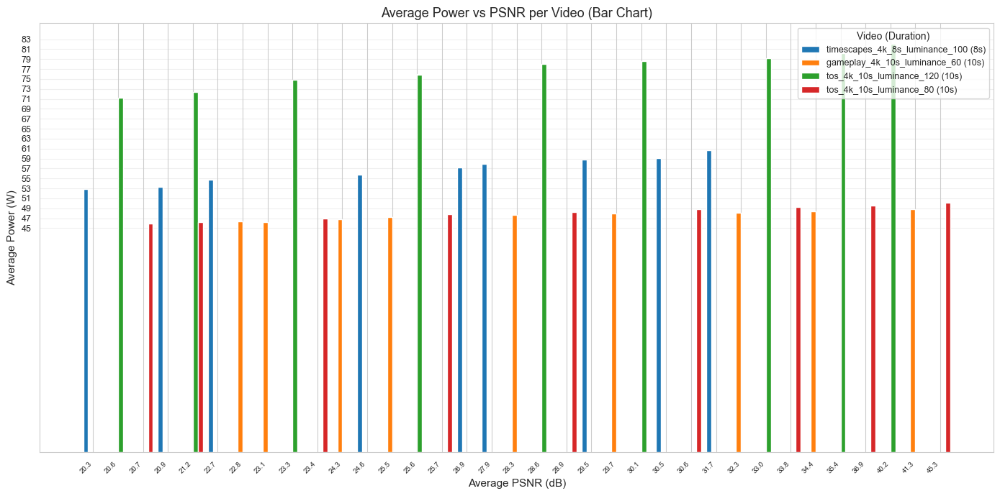

In [56]:
# Bar Chart: Average Power vs PSNR per Video
fig, ax = plt.subplots(figsize=(14, 7))

videos = avg_power_psnr['videoName'].unique()
colors = sns.color_palette('tab10', len(videos))

avg_power_psnr['PSNR_rounded'] = avg_power_psnr['Avg_PSNR'].round(1)
all_psnr = sorted(avg_power_psnr['PSNR_rounded'].unique())
n_videos = len(videos)
width = 0.8 / n_videos
x = np.arange(len(all_psnr))

for i, video in enumerate(videos):
    vdata = avg_power_psnr[avg_power_psnr['videoName'] == video].sort_values('PSNR_rounded')
    dur = vdata['duration_s'].iloc[0]
    label = f"{video} ({dur}s)"
    positions = [list(all_psnr).index(v) for v in vdata['PSNR_rounded']]
    offset = (i - n_videos / 2 + 0.5) * width
    ax.bar(np.array(positions) + offset, vdata['Avg_Power'], width=width, label=label, color=colors[i])

# Explicit y-axis ticks every 2W
y_min = int(np.floor(avg_power_psnr['Avg_Power'].min()))
y_max = int(np.ceil(avg_power_psnr['Avg_Power'].max())) + 1
ax.set_yticks(np.arange(y_min, y_max, 2))
ax.set_yticklabels([f"{v}" for v in np.arange(y_min, y_max, 2)], fontsize=9)

ax.set_xlabel('Average PSNR (dB)', fontsize=11)
ax.set_ylabel('Average Power (W)', fontsize=11)
ax.set_title('Average Power vs PSNR per Video (Bar Chart)', fontsize=13)
ax.set_xticks(x)
ax.set_xticklabels([f"{v:.1f}" for v in all_psnr], rotation=45, ha='right', fontsize=7)
ax.legend(title='Video (Duration)', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
ax.tick_params(axis='both', which='major', length=5)
plt.tight_layout()
plt.show()

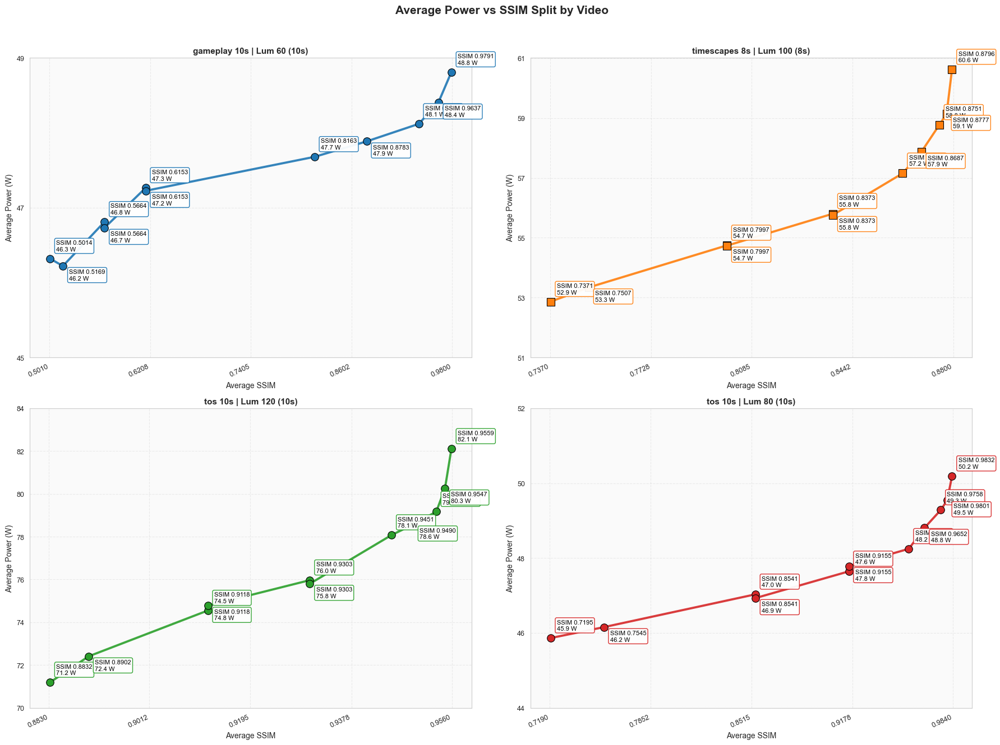

In [57]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load SSIM scores from JSON files
ssim_base = "../objective-score/psnr-ssim"
ssim_records = []

for folder in os.listdir(ssim_base):
    folder_path = os.path.join(ssim_base, folder)
    if not os.path.isdir(folder_path) or folder.startswith("."):
        continue

    for fname in os.listdir(folder_path):
        if not fname.endswith(".json"):
            continue

        fpath = os.path.join(folder_path, fname)

        # Example filename:
        # gameplay_4k_10s_luminance_60_0_600k.json
        name_without_ext = fname.replace(".json", "")
        bitrate_part = name_without_ext.rsplit("_", 1)
        bitrate = int(bitrate_part[1].replace("k", ""))

        reduction_part = bitrate_part[0].rsplit("_", 1)
        luminance_reduction = int(reduction_part[1])
        video_name = reduction_part[0]

        with open(fpath, "r") as f:
            data = json.load(f)

        frames = data.get("ssim", [])
        if not frames:
            continue

        mean_ssim = np.mean([frame["ssim_avg"] for frame in frames])

        ssim_records.append({
            "videoName": video_name,
            "luminanceReduction": luminance_reduction,
            "bitrate": bitrate,
            "mean_ssim": mean_ssim
        })

df_ssim = pd.DataFrame(ssim_records)

# Merge with cleaned energy data
df_ssim_merged = pd.merge(
    df_energy_clean,
    df_ssim,
    on=["videoName", "luminanceReduction", "bitrate"],
    how="inner"
)

df_ssim_merged["duration_s"] = (
    df_ssim_merged["videoName"].str.extract(r"_(\d+)s_").astype(int)
)

# Average power and SSIM by video and luminance reduction
avg_power_ssim = (
    df_ssim_merged
    .groupby(["duration_s", "videoName", "luminanceReduction"], as_index=False)
    .agg(
        Avg_Power=("Power", "mean"),
        Avg_SSIM=("mean_ssim", "mean")
    )
)

videos = sorted(avg_power_ssim["videoName"].unique())
color_map = {
    videos[0]: "#1f77b4",   # blue
    videos[1]: "#ff7f0e",   # orange
    videos[2]: "#2ca02c",   # green
    videos[3]: "#d62728"    # red
}
marker_map = {8: "s", 10: "o"}

fig, axes = plt.subplots(2, 2, figsize=(18, 13))
axes = axes.flatten()

for idx, video in enumerate(videos):
    ax = axes[idx]
    vdata = (
        avg_power_ssim[avg_power_ssim["videoName"] == video]
        .sort_values("Avg_SSIM")
        .reset_index(drop=True)
    )

    duration = int(vdata["duration_s"].iloc[0])
    color = color_map[video]
    marker = marker_map[duration]

    # Main line and markers
    ax.plot(
        vdata["Avg_SSIM"],
        vdata["Avg_Power"],
        color=color,
        linewidth=2.8,
        alpha=0.9,
        zorder=1
    )

    ax.scatter(
        vdata["Avg_SSIM"],
        vdata["Avg_Power"],
        s=95,
        color=color,
        marker=marker,
        edgecolors="black",
        linewidths=0.8,
        zorder=2
    )

    # Clear boxed annotations
    for point_idx, row in vdata.iterrows():
        offset_y = 10 if point_idx % 2 == 0 else -18
        ax.annotate(
            f"SSIM {row['Avg_SSIM']:.4f}\n{row['Avg_Power']:.1f} W",
            (row["Avg_SSIM"], row["Avg_Power"]),
            textcoords="offset points",
            xytext=(8, offset_y),
            fontsize=8,
            color="black",
            bbox=dict(
                boxstyle="round,pad=0.25",
                facecolor="white",
                edgecolor=color,
                linewidth=1,
                alpha=0.95
            )
        )

    # Per-video axis scaling so labels stay readable
    x_min = np.floor(vdata["Avg_SSIM"].min() * 1000) / 1000
    x_max = np.ceil(vdata["Avg_SSIM"].max() * 1000) / 1000
    x_ticks = np.round(np.linspace(x_min, x_max, 5), 4)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([f"{tick:.4f}" for tick in x_ticks], rotation=25, ha="right", fontsize=9)

    y_min = np.floor(vdata["Avg_Power"].min() - 1)
    y_max = np.ceil(vdata["Avg_Power"].max() + 1)
    y_ticks = np.arange(y_min, y_max + 1, 2)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f"{tick:.0f}" for tick in y_ticks], fontsize=9)

    title_text = video.replace("_4k_", " ").replace("_luminance_", " | Lum ").replace("_", " ")
    ax.set_title(f"{title_text} ({duration}s)", fontsize=11, fontweight="bold")
    ax.set_xlabel("Average SSIM", fontsize=10)
    ax.set_ylabel("Average Power (W)", fontsize=10)
    ax.grid(True, linestyle="--", alpha=0.35)
    ax.set_facecolor("#fafafa")

fig.suptitle("Average Power vs SSIM Split by Video", fontsize=15, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

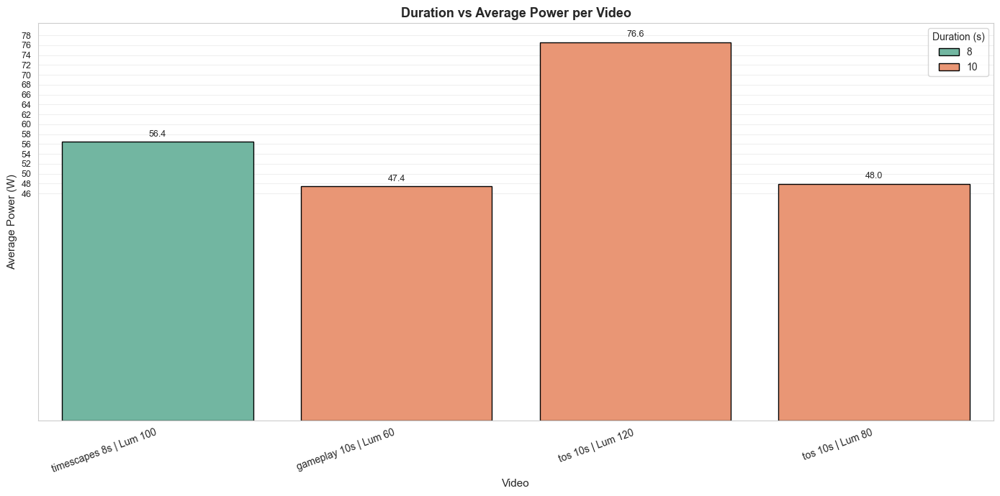

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Duration vs Average Power per Video
duration_power = (
    df_energy_clean.assign(
        duration_s=df_energy_clean['videoName'].str.extract(r'_(\d+)s_').astype(int)
    )
    .groupby(['videoName', 'duration_s'], as_index=False)
    .agg(Avg_Power=('Power', 'mean'))
    .sort_values(['duration_s', 'videoName'])
)

# Optional: shorter labels for cleaner display
duration_power['video_label'] = (
    duration_power['videoName']
    .str.replace('_4k_', ' ', regex=False)
    .str.replace('_luminance_', ' | Lum ', regex=False)
    .str.replace('_', ' ', regex=False)
)

plt.figure(figsize=(14, 7))
ax = sns.barplot(
    data=duration_power,
    x='video_label',
    y='Avg_Power',
    hue='duration_s',
    palette='Set2',
    edgecolor='black'
)

# Add values on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', padding=3, fontsize=9)

# Clear y-axis numbering
y_min = int(np.floor(duration_power['Avg_Power'].min())) - 1
y_max = int(np.ceil(duration_power['Avg_Power'].max())) + 2
ax.set_yticks(np.arange(y_min, y_max, 2))
ax.set_yticklabels([f"{v}" for v in np.arange(y_min, y_max, 2)], fontsize=9)

ax.set_xlabel('Video', fontsize=11)
ax.set_ylabel('Average Power (W)', fontsize=11)
ax.set_title('Duration vs Average Power per Video', fontsize=13, fontweight='bold')
ax.legend(title='Duration (s)')
plt.xticks(rotation=20, ha='right')
ax.grid(True, axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [59]:
duration_check = (
    df_energy_clean.assign(
        duration_s=df_energy_clean['videoName'].str.extract(r'_(\d+)s_').astype(int)
    )[['videoName', 'duration_s']]
    .drop_duplicates()
    .sort_values(['duration_s', 'videoName'])
)

print(duration_check)
print("\nCount by duration:")
print(duration_check['duration_s'].value_counts().sort_index())

                        videoName  duration_s
1  timescapes_4k_8s_luminance_100           8
0    gameplay_4k_10s_luminance_60          10
2        tos_4k_10s_luminance_120          10
3         tos_4k_10s_luminance_80          10

Count by duration:
duration_s
8     1
10    3
Name: count, dtype: int64


CORRELATION MATRIX - POWER, BITRATE, LUMINANCE REDUCTION
                    luminanceReduction       bitrate     Power
luminanceReduction        1.000000e+00 -1.393367e-16 -0.093900
bitrate                  -1.393367e-16  1.000000e+00  0.018094
Power                    -9.390018e-02  1.809395e-02  1.000000




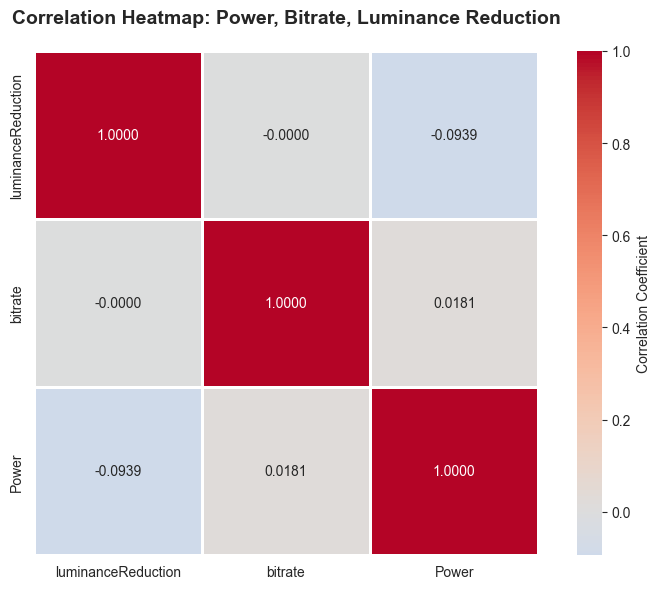

INDIVIDUAL CORRELATIONS:
--------------------------------------------------------------------------------
Power vs Bitrate:              0.0181
Power vs Luminance Reduction:  -0.0939
Bitrate vs Luminance Reduction: -0.0000


In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_energy_clean is your cleaned dataset
# Select the three variables for correlation analysis
heatmap_df = df_energy_clean[['luminanceReduction', 'bitrate', 'Power']].dropna().copy()

# Calculate correlation matrix
correlation_matrix = heatmap_df.corr()

print("=" * 80)
print("CORRELATION MATRIX - POWER, BITRATE, LUMINANCE REDUCTION")
print("=" * 80)
print(correlation_matrix)
print("\n")

# Create heatmap
fig, ax = plt.subplots(figsize=(8, 6))

sns.heatmap(
    correlation_matrix,
    annot=True,  # Show correlation values
    cmap='coolwarm',  # Color map: blue (negative) to red (positive)
    center=0,  # Center the color scale at 0
    fmt='.4f',  # Format to 4 decimal places
    square=True,  # Make cells square
    linewidths=1,  # Add gridlines
    cbar_kws={'label': 'Correlation Coefficient'},
    ax=ax
)

ax.set_title('Correlation Heatmap: Power, Bitrate, Luminance Reduction', 
             fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Print individual correlations
print("INDIVIDUAL CORRELATIONS:")
print("-" * 80)
print(f"Power vs Bitrate:              {correlation_matrix.loc['Power', 'bitrate']:.4f}")
print(f"Power vs Luminance Reduction:  {correlation_matrix.loc['Power', 'luminanceReduction']:.4f}")
print(f"Bitrate vs Luminance Reduction: {correlation_matrix.loc['bitrate', 'luminanceReduction']:.4f}")

MULTIVARIATE ANALYSIS - PAIR PLOT
Dataset shape: (704, 3)
Variables analyzed: luminanceReduction, bitrate, Power




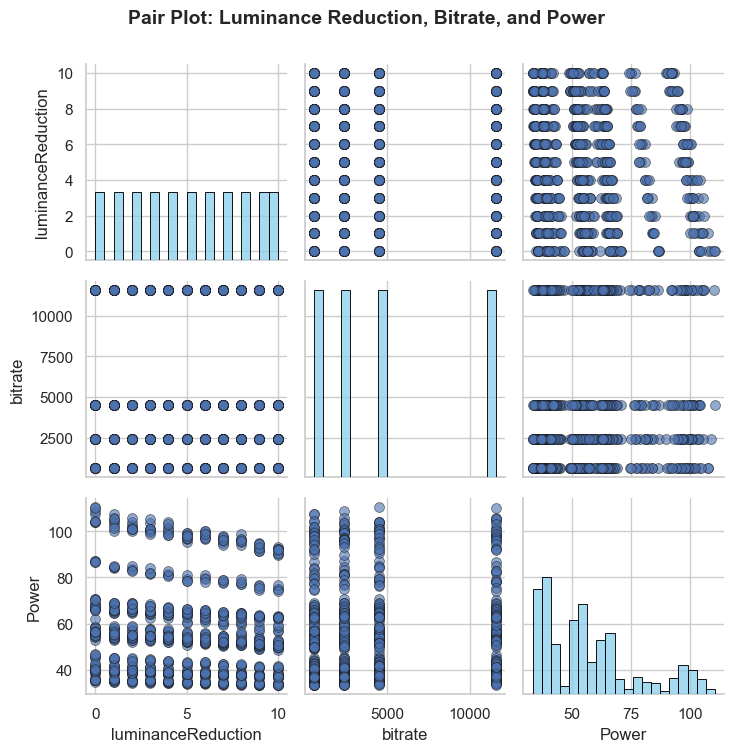


CORRELATION MATRIX:
--------------------------------------------------------------------------------
                    luminanceReduction       bitrate     Power
luminanceReduction        1.000000e+00 -1.393367e-16 -0.093900
bitrate                  -1.393367e-16  1.000000e+00  0.018094
Power                    -9.390018e-02  1.809395e-02  1.000000


In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_energy_clean is your cleaned dataset
# Select the three variables for pair plot analysis
pairplot_df = df_energy_clean[['luminanceReduction', 'bitrate', 'Power']].dropna().copy()

print("=" * 80)
print("MULTIVARIATE ANALYSIS - PAIR PLOT")
print("=" * 80)
print(f"Dataset shape: {pairplot_df.shape}")
print(f"Variables analyzed: luminanceReduction, bitrate, Power")
print("\n")

# Create pair plot
fig = sns.pairplot(
    pairplot_df,
    diag_kind='hist',  # Diagonal: histograms
    plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'},  # Scatter plot properties
    diag_kws={'bins': 20, 'edgecolor': 'black', 'color': 'skyblue'},  # Histogram properties
    corner=False,  # Show full matrix
    height=2.5,  # Size of each subplot
    aspect=1  # Aspect ratio
)

# Customize title
fig.figure.suptitle('Pair Plot: Luminance Reduction, Bitrate, and Power', 
                 fontsize=14, fontweight='bold', y=1.001)

plt.tight_layout()
plt.show()

# Print correlation matrix for reference
print("\nCORRELATION MATRIX:")
print("-" * 80)
correlation_matrix = pairplot_df.corr()
print(correlation_matrix)

MULTIVARIATE ANALYSIS - 3D SCATTER PLOT
Dataset shape: (704, 3)
Variables: Luminance Reduction (X), Bitrate (Y), Power (Z)




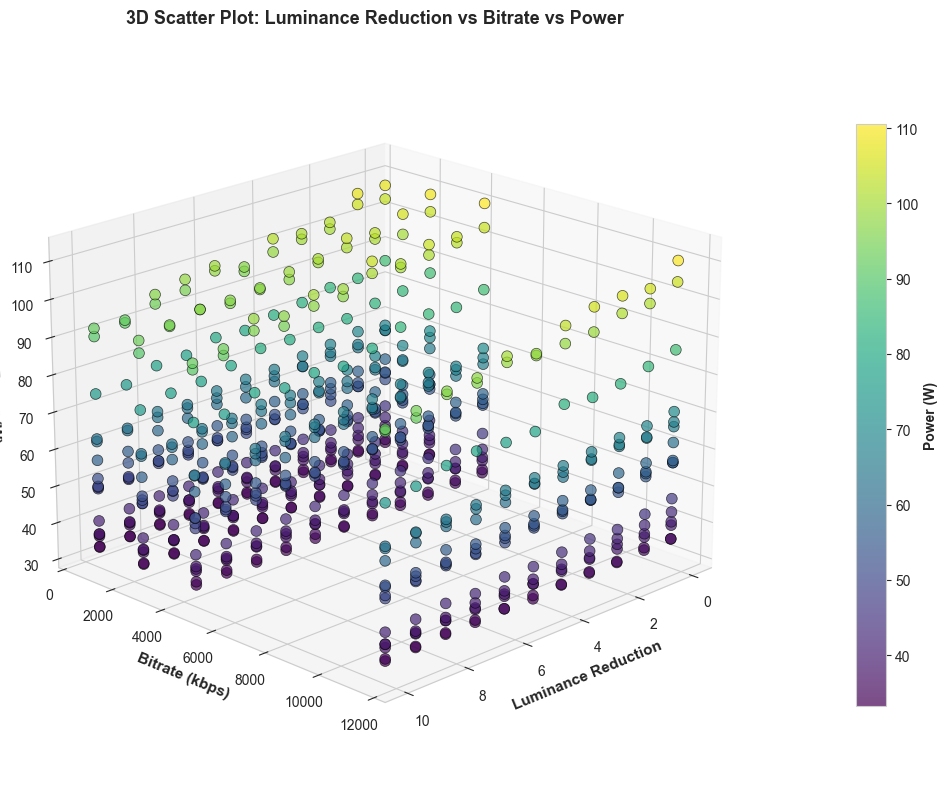

SUMMARY STATISTICS:
--------------------------------------------------------------------------------
       luminanceReduction       bitrate       Power
count          704.000000    704.000000  704.000000
mean             5.000000   4775.000000   57.105069
std              3.164526   4178.118166   20.322619
min              0.000000    600.000000   33.220000
25%              2.000000   1950.000000   38.980000
50%              5.000000   3450.000000   53.320000
75%              8.000000   6275.000000   65.510000
max             10.000000  11600.000000  110.600000


In [63]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming df_energy_clean is your cleaned dataset
# Select the three variables for 3D scatter plot
scatter_3d_df = df_energy_clean[['luminanceReduction', 'bitrate', 'Power']].dropna().copy()

print("=" * 80)
print("MULTIVARIATE ANALYSIS - 3D SCATTER PLOT")
print("=" * 80)
print(f"Dataset shape: {scatter_3d_df.shape}")
print(f"Variables: Luminance Reduction (X), Bitrate (Y), Power (Z)")
print("\n")

# Create 3D scatter plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plot with color gradient based on Power values
scatter = ax.scatter(
    scatter_3d_df['luminanceReduction'],
    scatter_3d_df['bitrate'],
    scatter_3d_df['Power'],
    c=scatter_3d_df['Power'],  # Color by Power values
    cmap='viridis',  # Color map
    s=60,  # Marker size
    alpha=0.7,  # Transparency
    edgecolors='k',  # Edge color
    linewidth=0.5
)

# Add labels
ax.set_xlabel('Luminance Reduction', fontsize=11, fontweight='bold')
ax.set_ylabel('Bitrate (kbps)', fontsize=11, fontweight='bold')
ax.set_zlabel('Power (W)', fontsize=11, fontweight='bold')
ax.set_title('3D Scatter Plot: Luminance Reduction vs Bitrate vs Power', 
             fontsize=13, fontweight='bold', pad=20)

# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Power (W)', fontsize=10, fontweight='bold')

# Adjust viewing angle
ax.view_init(elev=20, azim=45)

plt.tight_layout()
plt.show()

# Print summary statistics
print("SUMMARY STATISTICS:")
print("-" * 80)
print(scatter_3d_df.describe())

MULTIVARIATE ANALYSIS - CORRELATION MATRIX HEATMAP

CORRELATION MATRIX:
--------------------------------------------------------------------------------
                    luminanceReduction       bitrate     Power
luminanceReduction        1.000000e+00 -1.393367e-16 -0.093900
bitrate                  -1.393367e-16  1.000000e+00  0.018094
Power                    -9.390018e-02  1.809395e-02  1.000000




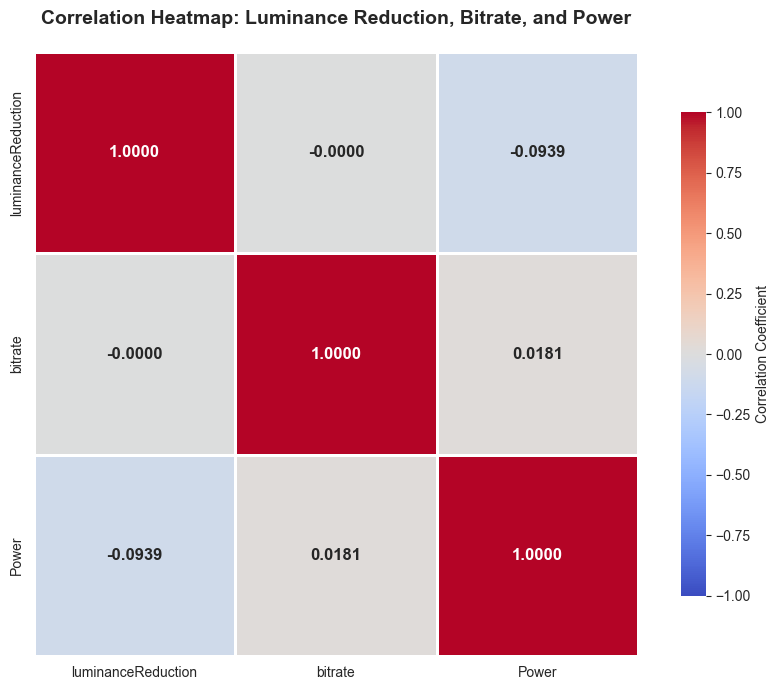

INDIVIDUAL CORRELATIONS WITH INTERPRETATION:
--------------------------------------------------------------------------------
Power vs bitrate:  0.0181  (Weak positive)
Power vs luminanceReduction: -0.0939  (Weak negative)
bitrate vs luminanceReduction: -0.0000  (Weak negative)


In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_energy_clean is your cleaned dataset
# Select the three variables for correlation analysis
corr_df = df_energy_clean[['luminanceReduction', 'bitrate', 'Power']].dropna().copy()

print("=" * 80)
print("MULTIVARIATE ANALYSIS - CORRELATION MATRIX HEATMAP")
print("=" * 80)

# Calculate correlation matrix
correlation_matrix = corr_df.corr()

print("\nCORRELATION MATRIX:")
print("-" * 80)
print(correlation_matrix)
print("\n")

# Create heatmap
fig, ax = plt.subplots(figsize=(9, 7))

sns.heatmap(
    correlation_matrix,
    annot=True,  # Show correlation values
    cmap='coolwarm',  # Color map: blue (negative) to red (positive)
    center=0,  # Center the color scale at 0
    fmt='.4f',  # Format to 4 decimal places
    square=True,  # Make cells square
    linewidths=2,  # Add gridlines
    cbar_kws={'label': 'Correlation Coefficient', 'shrink': 0.8},
    vmin=-1, vmax=1,  # Set scale from -1 to 1
    ax=ax,
    annot_kws={'fontsize': 12, 'fontweight': 'bold'}
)

ax.set_title('Correlation Heatmap: Luminance Reduction, Bitrate, and Power', 
             fontsize=14, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

# Print individual correlations with interpretation
print("INDIVIDUAL CORRELATIONS WITH INTERPRETATION:")
print("-" * 80)
corr_pairs = [
    ('Power', 'bitrate'),
    ('Power', 'luminanceReduction'),
    ('bitrate', 'luminanceReduction')
]

for var1, var2 in corr_pairs:
    corr_val = correlation_matrix.loc[var1, var2]
    if corr_val > 0.7:
        strength = "Strong positive"
    elif corr_val > 0.3:
        strength = "Moderate positive"
    elif corr_val > 0:
        strength = "Weak positive"
    elif corr_val > -0.3:
        strength = "Weak negative"
    elif corr_val > -0.7:
        strength = "Moderate negative"
    else:
        strength = "Strong negative"
    
    print(f"{var1} vs {var2}: {corr_val:7.4f}  ({strength})")

MULTIVARIATE ANALYSIS - CONTOUR AND SURFACE PLOTS
Dataset shape: (704, 3)




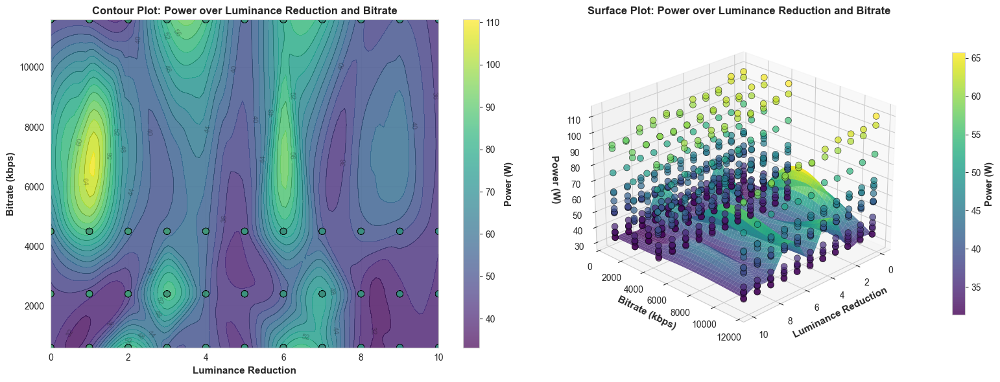

PLOT SUMMARY:
--------------------------------------------------------------------------------
Luminance Reduction Range: 0.00 to 10.00
Bitrate Range: 600.00 to 11600.00
Power Range: 33.22 to 110.60


In [66]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.interpolate import griddata

# Assuming df_energy_clean is your cleaned dataset
# Select the three variables for contour and surface plots
plot_df = df_energy_clean[['luminanceReduction', 'bitrate', 'Power']].dropna().copy()

print("=" * 80)
print("MULTIVARIATE ANALYSIS - CONTOUR AND SURFACE PLOTS")
print("=" * 80)
print(f"Dataset shape: {plot_df.shape}")
print("\n")

# Extract variables
x = plot_df['luminanceReduction'].values
y = plot_df['bitrate'].values
z = plot_df['Power'].values

# Create a regular grid for interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
Xi, Yi = np.meshgrid(xi, yi)

# Interpolate z values on the grid
Zi = griddata((x, y), z, (Xi, Yi), method='cubic')

# Create figure with two subplots
fig = plt.figure(figsize=(16, 6))

# --- CONTOUR PLOT ---
ax1 = fig.add_subplot(121)
contour = ax1.contourf(Xi, Yi, Zi, levels=20, cmap='viridis', alpha=0.8)
contour_lines = ax1.contour(Xi, Yi, Zi, levels=10, colors='black', alpha=0.3, linewidths=0.5)
ax1.clabel(contour_lines, inline=True, fontsize=8)
scatter1 = ax1.scatter(x, y, c=z, cmap='viridis', s=50, edgecolors='k', linewidth=0.5, alpha=0.7)
ax1.set_xlabel('Luminance Reduction', fontsize=11, fontweight='bold')
ax1.set_ylabel('Bitrate (kbps)', fontsize=11, fontweight='bold')
ax1.set_title('Contour Plot: Power over Luminance Reduction and Bitrate', fontsize=12, fontweight='bold')
cbar1 = plt.colorbar(scatter1, ax=ax1)
cbar1.set_label('Power (W)', fontsize=10, fontweight='bold')
ax1.grid(True, alpha=0.3)

# --- SURFACE PLOT ---
ax2 = fig.add_subplot(122, projection='3d')
surf = ax2.plot_surface(Xi, Yi, Zi, cmap='viridis', alpha=0.8, edgecolor='none')
ax2.scatter(x, y, z, c=z, cmap='viridis', s=50, alpha=0.7, edgecolors='k', linewidth=0.5)
ax2.set_xlabel('Luminance Reduction', fontsize=11, fontweight='bold')
ax2.set_ylabel('Bitrate (kbps)', fontsize=11, fontweight='bold')
ax2.set_zlabel('Power (W)', fontsize=11, fontweight='bold')
ax2.set_title('Surface Plot: Power over Luminance Reduction and Bitrate', fontsize=12, fontweight='bold')
cbar2 = plt.colorbar(surf, ax=ax2, pad=0.1, shrink=0.8)
cbar2.set_label('Power (W)', fontsize=10, fontweight='bold')
ax2.view_init(elev=25, azim=45)

plt.tight_layout()
plt.show()

# Print summary
print("PLOT SUMMARY:")
print("-" * 80)
print(f"Luminance Reduction Range: {x.min():.2f} to {x.max():.2f}")
print(f"Bitrate Range: {y.min():.2f} to {y.max():.2f}")
print(f"Power Range: {z.min():.2f} to {z.max():.2f}")

OUTLIER DIAGNOSTICS: BOXPLOT + Z-SCORE + RULE-BASED ASSESSMENT
Rows analyzed: 704
Columns analyzed: ['luminanceReduction', 'bitrate', 'Power']



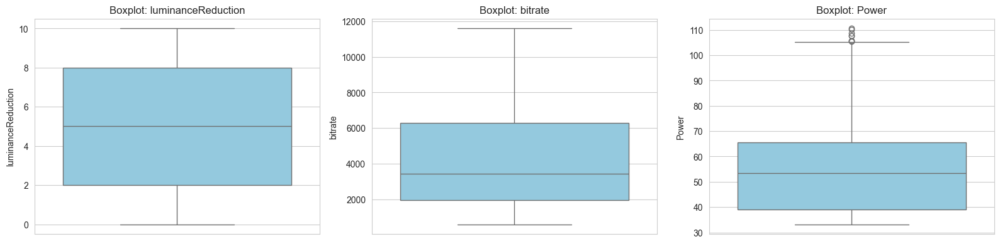

SUMMARY:
------------------------------------------------------------------------------------------
luminanceReduction   | IQR outliers:    0 | Z-score outliers (>|3.0|):    0
bitrate              | IQR outliers:    0 | Z-score outliers (>|3.0|):    0
Power                | IQR outliers:    8 | Z-score outliers (>|3.0|):    0

Row-level results:
assessment
Normal range                                     696
Potential realistic extreme (inspect context)      8
Name: count, dtype: int64

UNUSUAL ROWS (review these to decide error vs realistic extreme)


,luminanceReduction,bitrate,Power,luminanceReduction_zscore,bitrate_zscore,Power_zscore,luminanceReduction_iqr_outlier,bitrate_iqr_outlier,Power_iqr_outlier,luminanceReduction_z_outlier,bitrate_z_outlier,Power_z_outlier,luminanceReduction_outside_plausible,bitrate_outside_plausible,Power_outside_plausible,assessment
10,0,600,107.68,1.581139,0.999964,2.490372,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
26,0,2400,108.80,1.581139,0.568842,2.545523,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
42,0,4500,110.60,1.581139,0.065866,2.634157,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
58,0,11600,110.20,1.581139,1.634672,2.614460,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
74,1,600,107.60,1.264911,0.999964,2.486433,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
90,1,2400,105.62,1.264911,0.568842,2.388935,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
186,2,11600,105.80,0.948683,1.634672,2.397799,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
250,3,11600,105.40,0.632456,1.634672,2.378102,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)


In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# ============================================================
# OUTLIER IDENTIFICATION + ERROR vs REALISTIC EXTREME CHECK
# Methods: Boxplot/IQR + Z-score
# ============================================================

# 1) Use cleaned dataset
cols = ['luminanceReduction', 'bitrate', 'Power']
df_check = df_energy_clean[cols].dropna().copy()

print("=" * 90)
print("OUTLIER DIAGNOSTICS: BOXPLOT + Z-SCORE + RULE-BASED ASSESSMENT")
print("=" * 90)
print(f"Rows analyzed: {len(df_check)}")
print(f"Columns analyzed: {cols}\n")

# 2) Boxplots (visual unusual values)
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for i, col in enumerate(cols):
    sns.boxplot(y=df_check[col], ax=axes[i], color='skyblue')
    axes[i].set_title(f'Boxplot: {col}')
    axes[i].set_ylabel(col)
plt.tight_layout()
plt.show()

# 3) Compute Z-scores
z_scores = pd.DataFrame(
    np.abs(zscore(df_check[cols], nan_policy='omit')),
    columns=[f'{c}_zscore' for c in cols],
    index=df_check.index
)

# 4) Compute IQR bounds + flags
iqr_bounds = {}
iqr_flags = pd.DataFrame(index=df_check.index)

for col in cols:
    q1 = df_check[col].quantile(0.25)
    q3 = df_check[col].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    iqr_bounds[col] = (lower, upper)
    iqr_flags[f'{col}_iqr_outlier'] = (df_check[col] < lower) | (df_check[col] > upper)

# 5) Basic plausibility checks (edit if your experiment has stricter limits)
# None means "no upper/lower hard limit"
plausible_ranges = {
    'luminanceReduction': (0, 100),  # adjust if your study uses strict 0-10 scale
    'bitrate': (0, None),
    'Power': (0, None),
}

plausibility_flags = pd.DataFrame(index=df_check.index)
for col in cols:
    low, high = plausible_ranges[col]
    cond_low = df_check[col] < low if low is not None else pd.Series(False, index=df_check.index)
    cond_high = df_check[col] > high if high is not None else pd.Series(False, index=df_check.index)
    plausibility_flags[f'{col}_outside_plausible'] = cond_low | cond_high

# 6) Combine all diagnostics
result = df_check.copy()
result = pd.concat([result, z_scores, iqr_flags, plausibility_flags], axis=1)

# Z-score outlier threshold
Z_THRESHOLD = 3.0
for col in cols:
    result[f'{col}_z_outlier'] = result[f'{col}_zscore'] > Z_THRESHOLD

# Row-level summary flags
outlier_cols = []
for col in cols:
    outlier_cols.append(f'{col}_iqr_outlier')
    outlier_cols.append(f'{col}_z_outlier')

plaus_cols = [f'{col}_outside_plausible' for col in cols]

result['any_outlier'] = result[outlier_cols].any(axis=1)
result['outside_plausible_any'] = result[plaus_cols].any(axis=1)

# 7) Rule-based assessment
def assess_row(row):
    if not row['any_outlier']:
        return "Normal range"
    if row['outside_plausible_any']:
        return "Likely data error (outside plausible limits)"
    return "Potential realistic extreme (inspect context)"

result['assessment'] = result.apply(assess_row, axis=1)

# 8) Summary counts
print("SUMMARY:")
print("-" * 90)
for col in cols:
    iqr_n = result[f'{col}_iqr_outlier'].sum()
    z_n = result[f'{col}_z_outlier'].sum()
    print(f"{col:20s} | IQR outliers: {iqr_n:4d} | Z-score outliers (>|{Z_THRESHOLD}|): {z_n:4d}")

print("\nRow-level results:")
print(result['assessment'].value_counts())

# 9) Show only unusual rows for inspection
unusual = result[result['any_outlier']].copy()
unusual = unusual.sort_values(by=['outside_plausible_any', 'assessment'], ascending=[False, True])

print("\n" + "=" * 90)
print("UNUSUAL ROWS (review these to decide error vs realistic extreme)")
print("=" * 90)

# Display key columns first
display_cols = cols + \
               [f'{c}_zscore' for c in cols] + \
               [f'{c}_iqr_outlier' for c in cols] + \
               [f'{c}_z_outlier' for c in cols] + \
               [f'{c}_outside_plausible' for c in cols] + \
               ['assessment']

display(unusual[display_cols].head(100))

# Optional: save unusual rows
# unusual.to_csv("unusual_values_review.csv", index=False)

OUTLIER DIAGNOSTICS: BOXPLOT + Z-SCORE + RULE-BASED ASSESSMENT
Rows analyzed: 704
Columns analyzed: ['luminanceReduction', 'bitrate', 'Power']



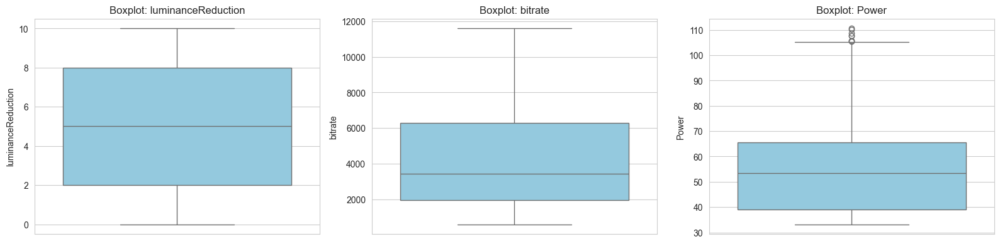

SUMMARY:
------------------------------------------------------------------------------------------
luminanceReduction   | IQR outliers:    0 | Z-score outliers (>|3.0|):    0
bitrate              | IQR outliers:    0 | Z-score outliers (>|3.0|):    0
Power                | IQR outliers:    8 | Z-score outliers (>|3.0|):    0

Row-level results:
assessment
Normal range                                     696
Potential realistic extreme (inspect context)      8
Name: count, dtype: int64

UNUSUAL ROWS (review these to decide error vs realistic extreme)


,luminanceReduction,bitrate,Power,luminanceReduction_zscore,bitrate_zscore,Power_zscore,luminanceReduction_iqr_outlier,bitrate_iqr_outlier,Power_iqr_outlier,luminanceReduction_z_outlier,bitrate_z_outlier,Power_z_outlier,luminanceReduction_outside_plausible,bitrate_outside_plausible,Power_outside_plausible,assessment
10,0,600,107.68,1.581139,0.999964,2.490372,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
26,0,2400,108.80,1.581139,0.568842,2.545523,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
42,0,4500,110.60,1.581139,0.065866,2.634157,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
58,0,11600,110.20,1.581139,1.634672,2.614460,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
74,1,600,107.60,1.264911,0.999964,2.486433,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
90,1,2400,105.62,1.264911,0.568842,2.388935,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
186,2,11600,105.80,0.948683,1.634672,2.397799,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)
250,3,11600,105.40,0.632456,1.634672,2.378102,False,False,True,False,False,False,False,False,False,Potential realistic extreme (inspect context)


In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# ============================================================
# OUTLIER IDENTIFICATION + ERROR vs REALISTIC EXTREME CHECK
# Methods: Boxplot/IQR + Z-score
# ============================================================

# 1) Use cleaned dataset
cols = ['luminanceReduction', 'bitrate', 'Power']
df_check = df_energy_clean[cols].dropna().copy()

print("=" * 90)
print("OUTLIER DIAGNOSTICS: BOXPLOT + Z-SCORE + RULE-BASED ASSESSMENT")
print("=" * 90)
print(f"Rows analyzed: {len(df_check)}")
print(f"Columns analyzed: {cols}\n")

# 2) Boxplots (visual unusual values)
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for i, col in enumerate(cols):
    sns.boxplot(y=df_check[col], ax=axes[i], color='skyblue')
    axes[i].set_title(f'Boxplot: {col}')
    axes[i].set_ylabel(col)
plt.tight_layout()
plt.show()

# 3) Compute Z-scores
z_scores = pd.DataFrame(
    np.abs(zscore(df_check[cols], nan_policy='omit')),
    columns=[f'{c}_zscore' for c in cols],
    index=df_check.index
)

# 4) Compute IQR bounds + flags
iqr_bounds = {}
iqr_flags = pd.DataFrame(index=df_check.index)

for col in cols:
    q1 = df_check[col].quantile(0.25)
    q3 = df_check[col].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    iqr_bounds[col] = (lower, upper)
    iqr_flags[f'{col}_iqr_outlier'] = (df_check[col] < lower) | (df_check[col] > upper)

# 5) Basic plausibility checks (edit if your experiment has stricter limits)
# None means "no upper/lower hard limit"
plausible_ranges = {
    'luminanceReduction': (0, 100),  # adjust if your study uses strict 0-10 scale
    'bitrate': (0, None),
    'Power': (0, None),
}

plausibility_flags = pd.DataFrame(index=df_check.index)
for col in cols:
    low, high = plausible_ranges[col]
    cond_low = df_check[col] < low if low is not None else pd.Series(False, index=df_check.index)
    cond_high = df_check[col] > high if high is not None else pd.Series(False, index=df_check.index)
    plausibility_flags[f'{col}_outside_plausible'] = cond_low | cond_high

# 6) Combine all diagnostics
result = df_check.copy()
result = pd.concat([result, z_scores, iqr_flags, plausibility_flags], axis=1)

# Z-score outlier threshold
Z_THRESHOLD = 3.0
for col in cols:
    result[f'{col}_z_outlier'] = result[f'{col}_zscore'] > Z_THRESHOLD

# Row-level summary flags
outlier_cols = []
for col in cols:
    outlier_cols.append(f'{col}_iqr_outlier')
    outlier_cols.append(f'{col}_z_outlier')

plaus_cols = [f'{col}_outside_plausible' for col in cols]

result['any_outlier'] = result[outlier_cols].any(axis=1)
result['outside_plausible_any'] = result[plaus_cols].any(axis=1)

# 7) Rule-based assessment
def assess_row(row):
    if not row['any_outlier']:
        return "Normal range"
    if row['outside_plausible_any']:
        return "Likely data error (outside plausible limits)"
    return "Potential realistic extreme (inspect context)"

result['assessment'] = result.apply(assess_row, axis=1)

# 8) Summary counts
print("SUMMARY:")
print("-" * 90)
for col in cols:
    iqr_n = result[f'{col}_iqr_outlier'].sum()
    z_n = result[f'{col}_z_outlier'].sum()
    print(f"{col:20s} | IQR outliers: {iqr_n:4d} | Z-score outliers (>|{Z_THRESHOLD}|): {z_n:4d}")

print("\nRow-level results:")
print(result['assessment'].value_counts())

# 9) Show only unusual rows for inspection
unusual = result[result['any_outlier']].copy()
unusual = unusual.sort_values(by=['outside_plausible_any', 'assessment'], ascending=[False, True])

print("\n" + "=" * 90)
print("UNUSUAL ROWS (review these to decide error vs realistic extreme)")
print("=" * 90)

# Display key columns first
display_cols = cols + \
               [f'{c}_zscore' for c in cols] + \
               [f'{c}_iqr_outlier' for c in cols] + \
               [f'{c}_z_outlier' for c in cols] + \
               [f'{c}_outside_plausible' for c in cols] + \
               ['assessment']

display(unusual[display_cols].head(100))

# Optional: save unusual rows
# unusual.to_csv("unusual_values_review.csv", index=False)

DATASET ROW COUNT SUMMARY

Energy consumption CSV:   704 rows
Objective score JSON:     176 rows
Subjective score JSON:    1 row
Test sequence JSON:       177 rows



In [ ]:
%pip install xgboost scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [1]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GroupShuffleSplit, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

try:
    from xgboost import XGBRegressor
    HAS_XGBOOST = True
except Exception:
    HAS_XGBOOST = False

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid")

model_df = df_energy_clean.copy() if "df_energy_clean" in globals() else pd.read_csv("energy_measurement.csv")

required_cols = ["device", "videoName", "luminanceReduction", "bitrate", "Power"]
missing_cols = [col for col in required_cols if col not in model_df.columns]
if missing_cols:
    raise ValueError(f"Missing required columns: {missing_cols}")

model_df = model_df[required_cols].dropna().copy()
model_df["duration_seconds"] = model_df["videoName"].str.extract(r"_(\d+)s_")[0].astype(float)

if model_df["duration_seconds"].isna().any():
    raise ValueError("Could not extract duration_seconds from one or more videoName values.")

model_df["bitrate_mbps"] = model_df["bitrate"] / 1000.0
model_df["Energy_Wh"] = model_df["Power"] * model_df["duration_seconds"] / 3600.0
model_df["device_video_group"] = model_df["device"].astype(str) + " | " + model_df["videoName"].astype(str)

summary_df = pd.DataFrame(
    {
        "Rows": [len(model_df)],
        "Unique devices": [model_df["device"].nunique()],
        "Unique videos": [model_df["videoName"].nunique()],
        "Unique luminance levels": [model_df["luminanceReduction"].nunique()],
        "Unique bitrates": [model_df["bitrate"].nunique()],
    }
)

display(summary_df)

combo_counts = (
    model_df.groupby(["device", "videoName", "luminanceReduction", "bitrate"])
    .size()
    .rename("row_count")
    .reset_index()
)

print("Rows per device-video-luminance-bitrate combination")
display(
    combo_counts["row_count"]
    .value_counts()
    .sort_index()
    .rename_axis("rows_per_combination")
    .reset_index(name="number_of_combinations")
)

display(model_df.head())

,Rows,Unique devices,Unique videos,Unique luminance levels,Unique bitrates
0,704,4,4,11,4


Rows per device-video-luminance-bitrate combination


,rows_per_combination,number_of_combinations
0,1,704


,device,videoName,luminanceReduction,bitrate,Power,duration_seconds,bitrate_mbps,Energy_Wh,device_video_group
0,BrandA-Model1,gameplay_4k_10s_luminance_60,0,600,34.54,10.0,0.6,0.095944,BrandA-Model1 | gameplay_4k_10s_luminance_60
1,BrandA-Model1,timescapes_4k_8s_luminance_100,0,600,41.80,8.0,0.6,0.092889,BrandA-Model1 | timescapes_4k_8s_luminance_100
2,BrandA-Model1,tos_4k_10s_luminance_120,0,600,54.84,10.0,0.6,0.152333,BrandA-Model1 | tos_4k_10s_luminance_120
3,BrandA-Model1,tos_4k_10s_luminance_80,0,600,35.40,10.0,0.6,0.098333,BrandA-Model1 | tos_4k_10s_luminance_80
4,BrandA-Model2,gameplay_4k_10s_luminance_60,0,600,38.04,10.0,0.6,0.105667,BrandA-Model2 | gameplay_4k_10s_luminance_60


In [2]:
def regression_metrics(y_true, y_pred):
    return {
        "MAE_Wh": float(mean_absolute_error(y_true, y_pred)),
        "RMSE_Wh": float(np.sqrt(mean_squared_error(y_true, y_pred))),
        "R2": float(r2_score(y_true, y_pred)),
    }

def build_splits(df, test_size=0.2, random_state=42):
    indices = np.arange(len(df))
    random_train, random_test = train_test_split(indices, test_size=test_size, random_state=random_state)

    gss = GroupShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)
    video_train, video_test = next(gss.split(df, groups=df["videoName"]))
    dev_video_train, dev_video_test = next(gss.split(df, groups=df["device_video_group"]))

    return {
        "random_row_split": (random_train, random_test),
        "group_by_video": (video_train, video_test),
        "group_by_device_video": (dev_video_train, dev_video_test),
    }

splits = build_splits(model_df)
baseline_features = ["luminanceReduction", "bitrate_mbps", "duration_seconds"]
X_base = model_df[baseline_features]
y = model_df["Energy_Wh"]

baseline_rows = []

for split_name, (train_idx, test_idx) in splits.items():
    y_train = y.iloc[train_idx]
    y_test = y.iloc[test_idx]

    mean_pred = np.repeat(y_train.mean(), len(test_idx))
    baseline_rows.append(
        {
            "Model": "Mean baseline",
            "Split": split_name,
            **regression_metrics(y_test, mean_pred),
        }
    )

    linear_model = LinearRegression()
    linear_model.fit(X_base.iloc[train_idx], y_train)
    linear_pred = linear_model.predict(X_base.iloc[test_idx])

    baseline_rows.append(
        {
            "Model": "Simple linear baseline",
            "Split": split_name,
            **regression_metrics(y_test, linear_pred),
        }
    )

baseline_results = (
    pd.DataFrame(baseline_rows)
    .sort_values(["Split", "RMSE_Wh"])
    .reset_index(drop=True)
)

display(baseline_results)

,Model,Split,MAE_Wh,RMSE_Wh,R2
0,Mean baseline,group_by_device_video,0.075585,0.079582,-0.047878
1,Simple linear baseline,group_by_device_video,0.077552,0.081200,-0.090944
2,Simple linear baseline,group_by_video,0.043605,0.049825,-0.817932
3,Mean baseline,group_by_video,0.043605,0.050100,-0.838090
4,Simple linear baseline,random_row_split,0.043911,0.055591,0.121043
5,Mean baseline,random_row_split,0.047069,0.059395,-0.003385


In [3]:
feature_cols = ["device", "videoName", "luminanceReduction", "bitrate_mbps", "duration_seconds"]
categorical_features = ["device", "videoName"]
numeric_features = ["luminanceReduction", "bitrate_mbps", "duration_seconds"]

X_full = model_df[feature_cols]
y_full = model_df["Energy_Wh"]

def make_ohe():
    try:
        return OneHotEncoder(handle_unknown="ignore", sparse_output=False)
    except TypeError:
        return OneHotEncoder(handle_unknown="ignore", sparse=False)

def make_preprocessor():
    return ColumnTransformer(
        transformers=[
            ("cat", make_ohe(), categorical_features),
            ("num", "passthrough", numeric_features),
        ]
    )

explanatory_rows = []

for split_name, (train_idx, test_idx) in splits.items():
    explanatory_pipeline = Pipeline(
        steps=[
            ("preprocessor", make_preprocessor()),
            ("model", LinearRegression()),
        ]
    )

    explanatory_pipeline.fit(X_full.iloc[train_idx], y_full.iloc[train_idx])
    pred = explanatory_pipeline.predict(X_full.iloc[test_idx])

    explanatory_rows.append(
        {
            "Model": "Linear model with controls",
            "Split": split_name,
            **regression_metrics(y_full.iloc[test_idx], pred),
        }
    )

explanatory_results = (
    pd.DataFrame(explanatory_rows)
    .sort_values(["Split", "RMSE_Wh"])
    .reset_index(drop=True)
)

display(explanatory_results)

full_explanatory_pipeline = Pipeline(
    steps=[
        ("preprocessor", make_preprocessor()),
        ("model", LinearRegression()),
    ]
)
full_explanatory_pipeline.fit(X_full, y_full)

coef_names = full_explanatory_pipeline.named_steps["preprocessor"].get_feature_names_out()
coef_values = full_explanatory_pipeline.named_steps["model"].coef_

coef_df = pd.DataFrame(
    {
        "Feature": coef_names,
        "Coefficient": coef_values,
        "Abs_Coefficient": np.abs(coef_values),
    }
).sort_values("Abs_Coefficient", ascending=False)

print("Top coefficients by absolute magnitude")
display(coef_df.head(15))

,Model,Split,MAE_Wh,RMSE_Wh,R2
0,Linear model with controls,group_by_device_video,0.016211,0.017782,0.947683
1,Linear model with controls,group_by_video,0.033830,0.035472,0.078588
2,Linear model with controls,random_row_split,0.011209,0.014367,0.941294


Top coefficients by absolute magnitude


,Feature,Coefficient,Abs_Coefficient
6,cat__videoName_tos_4k_10s_luminance_120,0.055715,0.055715
3,cat__device_BrandB-Model1,0.052534,0.052534
0,cat__device_BrandA-Model1,-0.044249,0.044249
1,cat__device_BrandA-Model2,-0.034888,0.034888
2,cat__device_BrandA-Model3,0.026603,0.026603
4,cat__videoName_gameplay_4k_10s_luminance_60,-0.025445,0.025445
7,cat__videoName_tos_4k_10s_luminance_80,-0.023926,0.023926
10,num__duration_seconds,0.012686,0.012686
5,cat__videoName_timescapes_4k_8s_luminance_100,-0.006343,0.006343
8,num__luminanceReduction,-0.001572,0.001572


In [4]:
predictive_models = {
    "Random Forest": RandomForestRegressor(
        n_estimators=400,
        random_state=42,
        n_jobs=-1,
    )
}

if HAS_XGBOOST:
    predictive_models["XGBoost"] = XGBRegressor(
        objective="reg:squarederror",
        n_estimators=300,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        verbosity=0,
    )
else:
    print("XGBoost is not available in this environment. Running Random Forest only.")

comparison_rows = []
prediction_store = {}

for split_name, (train_idx, test_idx) in splits.items():
    for model_name, estimator in predictive_models.items():
        pipeline = Pipeline(
            steps=[
                ("preprocessor", make_preprocessor()),
                ("model", estimator),
            ]
        )

        pipeline.fit(X_full.iloc[train_idx], y_full.iloc[train_idx])
        pred = pipeline.predict(X_full.iloc[test_idx])

        comparison_rows.append(
            {
                "Model": model_name,
                "Split": split_name,
                **regression_metrics(y_full.iloc[test_idx], pred),
            }
        )

        pred_df = X_full.iloc[test_idx].copy()
        pred_df["Actual_Energy_Wh"] = y_full.iloc[test_idx].values
        pred_df["Predicted_Energy_Wh"] = pred
        pred_df["Absolute_Error_Wh"] = np.abs(pred_df["Actual_Energy_Wh"] - pred_df["Predicted_Energy_Wh"])
        prediction_store[(model_name, split_name)] = pred_df.sort_values("Absolute_Error_Wh", ascending=False)

predictive_results = (
    pd.DataFrame(comparison_rows)
    .sort_values(["Split", "RMSE_Wh"])
    .reset_index(drop=True)
)

display(predictive_results)

,Model,Split,MAE_Wh,RMSE_Wh,R2
0,XGBoost,group_by_device_video,0.033653,0.042412,0.702384
1,Random Forest,group_by_device_video,0.033845,0.057732,0.448542
2,Random Forest,group_by_video,0.007387,0.008176,0.951044
3,XGBoost,group_by_video,0.017164,0.017690,0.770832
4,XGBoost,random_row_split,0.001321,0.002121,0.998720
5,Random Forest,random_row_split,0.001498,0.002341,0.998441


In [5]:
all_results = pd.concat([baseline_results, explanatory_results, predictive_results], ignore_index=True)
all_results = all_results.sort_values(["Split", "RMSE_Wh"]).reset_index(drop=True)

display(all_results)

grouped_only = (
    all_results[all_results["Split"] == "group_by_video"]
    .copy()
    .sort_values("RMSE_Wh")
    .reset_index(drop=True)
)

print("Best models under grouped holdout by video")
display(grouped_only)

,Model,Split,MAE_Wh,RMSE_Wh,R2
0,Linear model with controls,group_by_device_video,0.016211,0.017782,0.947683
1,XGBoost,group_by_device_video,0.033653,0.042412,0.702384
2,Random Forest,group_by_device_video,0.033845,0.057732,0.448542
3,Mean baseline,group_by_device_video,0.075585,0.079582,-0.047878
4,Simple linear baseline,group_by_device_video,0.077552,0.081200,-0.090944
5,Random Forest,group_by_video,0.007387,0.008176,0.951044
6,XGBoost,group_by_video,0.017164,0.017690,0.770832
7,Linear model with controls,group_by_video,0.033830,0.035472,0.078588
8,Simple linear baseline,group_by_video,0.043605,0.049825,-0.817932
9,Mean baseline,group_by_video,0.043605,0.050100,-0.838090


Best models under grouped holdout by video


,Model,Split,MAE_Wh,RMSE_Wh,R2
0,Random Forest,group_by_video,0.007387,0.008176,0.951044
1,XGBoost,group_by_video,0.017164,0.017690,0.770832
2,Linear model with controls,group_by_video,0.033830,0.035472,0.078588
3,Simple linear baseline,group_by_video,0.043605,0.049825,-0.817932
4,Mean baseline,group_by_video,0.043605,0.050100,-0.838090


In [6]:
best_grouped_model_name = grouped_only.iloc[0]["Model"]

if (best_grouped_model_name, "group_by_video") in prediction_store:
    best_grouped_predictions = prediction_store[(best_grouped_model_name, "group_by_video")].copy()
    print(f"Largest errors for the best grouped-holdout model: {best_grouped_model_name}")
    display(best_grouped_predictions.head(15))
else:
    print("The best grouped model is not in prediction_store because it is a baseline or explanatory linear model.")

Largest errors for the best grouped-holdout model: Random Forest


,device,videoName,luminanceReduction,bitrate_mbps,duration_seconds,Actual_Energy_Wh,Predicted_Energy_Wh,Absolute_Error_Wh
617,BrandA-Model3,timescapes_4k_8s_luminance_100,9,4.5,8.0,0.128178,0.142403,0.014225
693,BrandA-Model2,timescapes_4k_8s_luminance_100,10,11.6,8.0,0.091200,0.104600,0.013400
665,BrandA-Model3,timescapes_4k_8s_luminance_100,10,2.4,8.0,0.126667,0.139953,0.013286
341,BrandA-Model2,timescapes_4k_8s_luminance_100,5,2.4,8.0,0.092444,0.105604,0.013160
489,BrandA-Model3,timescapes_4k_8s_luminance_100,7,4.5,8.0,0.131644,0.144695,0.013051
661,BrandA-Model2,timescapes_4k_8s_luminance_100,10,2.4,8.0,0.090133,0.102889,0.012755
629,BrandA-Model2,timescapes_4k_8s_luminance_100,9,11.6,8.0,0.091733,0.104402,0.012668
677,BrandA-Model2,timescapes_4k_8s_luminance_100,10,4.5,8.0,0.092667,0.105302,0.012635
645,BrandA-Model2,timescapes_4k_8s_luminance_100,10,0.6,8.0,0.089911,0.102352,0.012441
501,BrandA-Model2,timescapes_4k_8s_luminance_100,7,11.6,8.0,0.092889,0.105180,0.012291


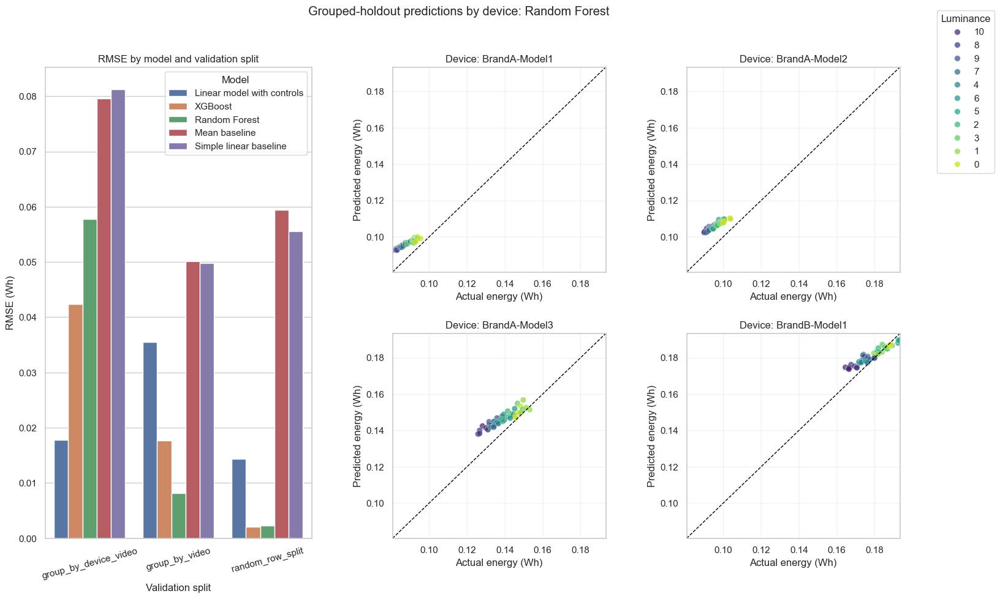

In [8]:
plot_df = all_results.copy()

afig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.barplot(
    data=plot_df,
    x="Split",
    y="RMSE_Wh",
    hue="Model",
    ax=axes[0],
)
axes[0].set_title("RMSE by model and validation split")
axes[0].set_xlabel("Validation split")
axes[0].set_ylabel("RMSE (Wh)")
axes[0].tick_params(axis="x", rotation=15)

if "best_grouped_predictions" in globals():
    sns.scatterplot(
        data=best_grouped_predictions,
        x="Actual_Energy_Wh",
        y="Predicted_Energy_Wh",
        hue="videoName",
        style="device",
        ax=axes[1],
    )
    min_val = min(best_grouped_predictions["Actual_Energy_Wh"].min(), best_grouped_predictions["Predicted_Energy_Wh"].min())
    max_val = max(best_grouped_predictions["Actual_Energy_Wh"].max(), best_grouped_predictions["Predicted_Energy_Wh"].max())
    axes[1].plot([min_val, max_val], [min_val, max_val], linestyle="--", color="black")
    axes[1].set_title(f"Actual vs predicted energy: {best_grouped_model_name}")
    axes[1].set_xlabel("Actual energy (Wh)")
    axes[1].set_ylabel("Predicted energy (Wh)")
else:
    axes[1].axis("off")

plt.tight_layout()
plt.show()

In [8]:
selected_models = {
    "Linear model with controls": LinearRegression(),
    "Random Forest": RandomForestRegressor(
        n_estimators=400,
        random_state=42,
        n_jobs=-1,
    ),
}

if HAS_XGBOOST:
    selected_models["XGBoost"] = XGBRegressor(
        objective="reg:squarederror",
        n_estimators=300,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        verbosity=0,
    )

def run_exact_80_20_split(title="Exact 80% training / 20% testing split"):
    train_idx, test_idx = train_test_split(
        np.arange(len(X_full)),
        test_size=0.2,
        random_state=42,
    )

    X_train = X_full.iloc[train_idx].copy()
    X_test = X_full.iloc[test_idx].copy()
    y_train = y_full.iloc[train_idx].copy()
    y_test = y_full.iloc[test_idx].copy()

    print(title)
    print(f"Training rows: {len(train_idx)} ({len(train_idx) / len(X_full):.0%})")
    print(f"Testing rows: {len(test_idx)} ({len(test_idx) / len(X_full):.0%})")

    print("Training dataset")
    display(X_train.assign(Energy_Wh=y_train.values).head(20))

    print("Testing dataset")
    display(X_test.assign(Energy_Wh=y_test.values).head(20))

    method_results = []
    method_predictions = {}

    for model_name, estimator in selected_models.items():
        pipeline = Pipeline(
            steps=[
                ("preprocessor", make_preprocessor()),
                ("model", estimator),
            ]
        )

        pipeline.fit(X_train, y_train)
        pred = pipeline.predict(X_test)

        method_results.append(
            {
                "Model": model_name,
                **regression_metrics(y_test, pred),
            }
        )

        pred_df = X_test.copy()
        pred_df["Actual_Energy_Wh"] = y_test.values
        pred_df["Predicted_Energy_Wh"] = pred
        pred_df["Absolute_Error_Wh"] = np.abs(
            pred_df["Actual_Energy_Wh"] - pred_df["Predicted_Energy_Wh"]
        )
        method_predictions[model_name] = pred_df

    method_df = pd.DataFrame(method_results).sort_values("RMSE_Wh").reset_index(drop=True)
    display(method_df)

    fig, axes = plt.subplots(
        1,
        1 + len(method_predictions),
        figsize=(6 * (1 + len(method_predictions)), 6),
    )

    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])

    sns.barplot(
        data=method_df,
        x="Model",
        y="RMSE_Wh",
        hue="Model",
        legend=False,
        ax=axes[0],
    )
    axes[0].set_title(title)
    axes[0].set_xlabel("Model")
    axes[0].set_ylabel("RMSE (Wh)")
    axes[0].tick_params(axis="x", rotation=15)

    for i, (model_name, pred_df) in enumerate(method_predictions.items(), start=1):
        sns.scatterplot(
            data=pred_df,
            x="Actual_Energy_Wh",
            y="Predicted_Energy_Wh",
            hue="videoName",
            style="device",
            ax=axes[i],
        )

        min_val = min(
            pred_df["Actual_Energy_Wh"].min(),
            pred_df["Predicted_Energy_Wh"].min(),
        )
        max_val = max(
            pred_df["Actual_Energy_Wh"].max(),
            pred_df["Predicted_Energy_Wh"].max(),
        )

        axes[i].plot([min_val, max_val], [min_val, max_val], linestyle="--", color="black")
        axes[i].set_title(model_name)
        axes[i].set_xlabel("Actual energy (Wh)")
        axes[i].set_ylabel("Predicted energy (Wh)")

    plt.tight_layout()
    plt.show()

    return method_df

Exact 80% training / 20% testing split
Training rows: 563 (80%)
Testing rows: 141 (20%)
Training dataset


,device,videoName,luminanceReduction,bitrate_mbps,duration_seconds,Energy_Wh
24,BrandA-Model3,gameplay_4k_10s_luminance_60,0,2.4,10.0,0.150778
155,BrandA-Model3,tos_4k_10s_luminance_80,2,2.4,10.0,0.149944
210,BrandA-Model1,tos_4k_10s_luminance_120,3,2.4,10.0,0.152278
291,BrandA-Model1,tos_4k_10s_luminance_80,4,4.5,10.0,0.096722
537,BrandA-Model3,timescapes_4k_8s_luminance_100,8,2.4,8.0,0.134267
485,BrandA-Model2,timescapes_4k_8s_luminance_100,7,4.5,8.0,0.094578
110,BrandB-Model1,tos_4k_10s_luminance_120,1,4.5,10.0,0.283889
82,BrandA-Model1,tos_4k_10s_luminance_120,1,2.4,10.0,0.153722
51,BrandA-Model1,tos_4k_10s_luminance_80,0,11.6,10.0,0.098611
404,BrandA-Model2,gameplay_4k_10s_luminance_60,6,2.4,10.0,0.104000


Testing dataset


,device,videoName,luminanceReduction,bitrate_mbps,duration_seconds,Energy_Wh
296,BrandA-Model3,gameplay_4k_10s_luminance_60,4,4.5,10.0,0.148278
81,BrandA-Model1,timescapes_4k_8s_luminance_100,1,2.4,8.0,0.091778
77,BrandB-Model1,timescapes_4k_8s_luminance_100,1,0.6,8.0,0.186667
208,BrandA-Model1,gameplay_4k_10s_luminance_60,3,2.4,10.0,0.097000
318,BrandB-Model1,tos_4k_10s_luminance_120,4,11.6,10.0,0.273389
277,BrandA-Model2,timescapes_4k_8s_luminance_100,4,2.4,8.0,0.096578
244,BrandA-Model2,gameplay_4k_10s_luminance_60,3,11.6,10.0,0.108056
323,BrandA-Model1,tos_4k_10s_luminance_80,5,0.6,10.0,0.094722
284,BrandB-Model1,gameplay_4k_10s_luminance_60,4,2.4,10.0,0.178389
120,BrandA-Model3,gameplay_4k_10s_luminance_60,1,11.6,10.0,0.156111


,Model,MAE_Wh,RMSE_Wh,R2
0,XGBoost,0.001321,0.002121,0.998720
1,Random Forest,0.001498,0.002341,0.998441
2,Linear model with controls,0.011209,0.014367,0.941294


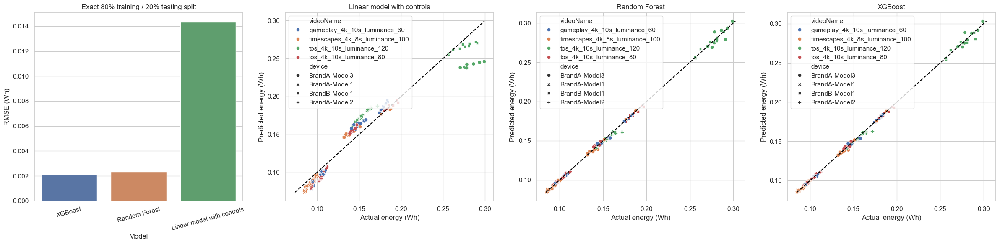

In [9]:
exact_80_20_results = run_exact_80_20_split()

,Energy rows,Merged rows,Unique devices,Unique videos
0,704,704,4,4


Objective-score training rows: 563 (80%)
Objective-score testing rows: 141 (20%)


,Model,MAE_W,RMSE_W,R2
0,XGBoost,0.725116,1.209223,0.996549
1,Random Forest,0.972470,2.444750,0.985896
2,Linear Regression,8.126966,10.750641,0.727256


Largest prediction errors for Linear Regression


,videoName,device,luminanceReduction,bitrate,Actual_Power_W,Predicted_Power_W,Absolute_Error_W
90,tos_4k_10s_luminance_120,BrandA-Model3,1,2400,105.62,71.897789,33.722211
10,tos_4k_10s_luminance_120,BrandA-Model3,0,600,107.68,77.861972,29.818028
234,tos_4k_10s_luminance_120,BrandA-Model3,3,4500,100.18,71.303749,28.876251
426,tos_4k_10s_luminance_120,BrandA-Model3,6,4500,100.08,71.352042,28.727958
346,tos_4k_10s_luminance_120,BrandA-Model3,5,2400,99.22,72.336956,26.883044
314,tos_4k_10s_luminance_120,BrandA-Model3,4,11600,103.06,77.702595,25.357405
30,tos_4k_10s_luminance_120,BrandB-Model1,0,2400,104.00,81.565547,22.434453
395,tos_4k_10s_luminance_80,BrandA-Model3,6,600,52.14,72.576232,20.436232
506,tos_4k_10s_luminance_120,BrandA-Model3,7,11600,97.36,77.226622,20.133378
331,tos_4k_10s_luminance_80,BrandA-Model3,5,600,52.42,72.528887,20.108887


Largest prediction errors for Random Forest


,videoName,device,luminanceReduction,bitrate,Actual_Power_W,Predicted_Power_W,Absolute_Error_W
346,tos_4k_10s_luminance_120,BrandA-Model3,5,2400,99.22,82.78950,16.43050
314,tos_4k_10s_luminance_120,BrandA-Model3,4,11600,103.06,88.21770,14.84230
506,tos_4k_10s_luminance_120,BrandA-Model3,7,11600,97.36,84.09150,13.26850
158,tos_4k_10s_luminance_120,BrandB-Model1,2,2400,101.10,95.80165,5.29835
54,tos_4k_10s_luminance_120,BrandA-Model2,0,11600,61.82,57.56790,4.25210
318,tos_4k_10s_luminance_120,BrandB-Model1,4,11600,98.42,94.23305,4.18695
78,tos_4k_10s_luminance_120,BrandB-Model1,1,600,104.60,100.45455,4.14545
234,tos_4k_10s_luminance_120,BrandA-Model3,3,4500,100.18,103.74470,3.56470
310,tos_4k_10s_luminance_120,BrandA-Model2,4,11600,57.44,54.25780,3.18220
306,tos_4k_10s_luminance_120,BrandA-Model1,4,11600,55.02,51.96705,3.05295


Largest prediction errors for XGBoost


,videoName,device,luminanceReduction,bitrate,Actual_Power_W,Predicted_Power_W,Absolute_Error_W
314,tos_4k_10s_luminance_120,BrandA-Model3,4,11600,103.060,96.675957,6.384043
346,tos_4k_10s_luminance_120,BrandA-Model3,5,2400,99.220,94.899727,4.320273
234,tos_4k_10s_luminance_120,BrandA-Model3,3,4500,100.180,104.168823,3.988823
54,tos_4k_10s_luminance_120,BrandA-Model2,0,11600,61.820,58.020084,3.799916
78,tos_4k_10s_luminance_120,BrandB-Model1,1,600,104.600,101.633133,2.966867
158,tos_4k_10s_luminance_120,BrandB-Model1,2,2400,101.100,98.394348,2.705652
318,tos_4k_10s_luminance_120,BrandB-Model1,4,11600,98.420,95.758614,2.661386
302,tos_4k_10s_luminance_120,BrandB-Model1,4,4500,101.000,98.403931,2.596069
377,timescapes_4k_8s_luminance_100,BrandA-Model3,5,11600,64.825,62.341347,2.483653
306,tos_4k_10s_luminance_120,BrandA-Model1,4,11600,55.020,52.544651,2.475349


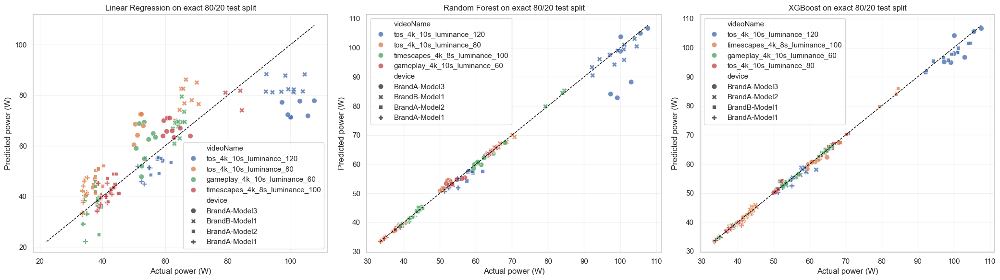

In [16]:
from pathlib import Path
import json
import re

def load_objective_feature_table(objective_root: Path) -> pd.DataFrame:
    rows = []

    for json_path in objective_root.rglob("*.json"):
        relative_path = json_path.relative_to(objective_root)
        score_family = relative_path.parts[0]
        stem = json_path.stem
        parsed_name = stem[len("vmaf_"):] if score_family == "vmaf" and stem.startswith("vmaf_") else stem

        match = re.match(r"(.+)_([0-9]+)_([0-9]+)k$", parsed_name)
        if not match:
            continue

        video_name, luminance_reduction, bitrate_k = match.groups()

        with open(json_path, "r", encoding="utf-8") as handle:
            payload = json.load(handle)

        row = {
            "videoName": video_name,
            "luminanceReduction": int(luminance_reduction),
            "bitrate": int(bitrate_k),
        }

        for top_key, top_value in payload.get("global", {}).items():
            if not isinstance(top_value, dict):
                continue
            for metric_name, metric_values in top_value.items():
                if isinstance(metric_values, dict) and "average" in metric_values:
                    row[f"{score_family}.{top_key}.{metric_name}.average"] = metric_values["average"]

        rows.append(row)

    objective_df = pd.DataFrame(rows)
    objective_df = (
        objective_df.groupby(["videoName", "luminanceReduction", "bitrate"], as_index=False)
        .first()
        .sort_values(["videoName", "luminanceReduction", "bitrate"])
        .reset_index(drop=True)
    )
    return objective_df


def regression_metrics_power(y_true, y_pred):
    return {
        "MAE_W": float(mean_absolute_error(y_true, y_pred)),
        "RMSE_W": float(np.sqrt(mean_squared_error(y_true, y_pred))),
        "R2": float(r2_score(y_true, y_pred)),
    }


energy_dataset_df = pd.read_csv("energy_measurement.csv")
objective_dataset_df = load_objective_feature_table((Path("..") / "objective-score").resolve())

modelling_df = energy_dataset_df.merge(
    objective_dataset_df,
    on=["videoName", "luminanceReduction", "bitrate"],
    how="inner",
)

modelling_df["duration_seconds"] = modelling_df["videoName"].str.extract(r"_(\d+)s_")[0].astype(float)

summary_dataset_model_df = pd.DataFrame(
    {
        "Energy rows": [len(energy_dataset_df)],
        "Merged rows": [len(modelling_df)],
        "Unique devices": [modelling_df["device"].nunique()],
        "Unique videos": [modelling_df["videoName"].nunique()],
    }
)
display(summary_dataset_model_df)

feature_columns_dataset = [
    "device",
    "luminanceReduction",
    "bitrate",
    "duration_seconds",
    "vmaf.vmaf.vmaf.average",
    "vmaf.vmaf.integer_motion.average",
    "psnr-ssim.psnr.psnr_avg.average",
    "psnr-ssim.ssim.ssim_avg.average",
]

modelling_ready_df = modelling_df[feature_columns_dataset + ["videoName", "Power"]].dropna().copy()

X_dataset = modelling_ready_df[feature_columns_dataset]
y_dataset = modelling_ready_df["Power"]

objective_train_idx, objective_test_idx = train_test_split(
    np.arange(len(modelling_ready_df)),
    test_size=0.2,
    random_state=42,
 )

print(f"Objective-score training rows: {len(objective_train_idx)} ({len(objective_train_idx) / len(modelling_ready_df):.0%})")
print(f"Objective-score testing rows: {len(objective_test_idx)} ({len(objective_test_idx) / len(modelling_ready_df):.0%})")

try:
    dataset_ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
except TypeError:
    dataset_ohe = OneHotEncoder(handle_unknown="ignore", sparse=False)

dataset_preprocessor = ColumnTransformer(
    transformers=[
        ("device", dataset_ohe, ["device"]),
        (
            "numeric",
            "passthrough",
            [
                "luminanceReduction",
                "bitrate",
                "duration_seconds",
                "vmaf.vmaf.vmaf.average",
                "vmaf.vmaf.integer_motion.average",
                "psnr-ssim.psnr.psnr_avg.average",
                "psnr-ssim.ssim.ssim_avg.average",
            ],
        ),
    ]
)

dataset_models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(
        n_estimators=400,
        random_state=42,
        n_jobs=-1,
    ),
}

if HAS_XGBOOST:
    dataset_models["XGBoost"] = XGBRegressor(
        objective="reg:squarederror",
        n_estimators=300,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        verbosity=0,
    )

results_rows = []
dataset_prediction_store = {}

for model_name, estimator in dataset_models.items():
    pipeline = Pipeline(
        steps=[
            ("preprocessor", dataset_preprocessor),
            ("model", estimator),
        ]
    )

    pipeline.fit(X_dataset.iloc[objective_train_idx], y_dataset.iloc[objective_train_idx])
    predictions = pipeline.predict(X_dataset.iloc[objective_test_idx])

    results_rows.append(
        {
            "Model": model_name,
            **regression_metrics_power(y_dataset.iloc[objective_test_idx], predictions),
        }
    )

    prediction_df = modelling_ready_df.iloc[objective_test_idx][["videoName"]].copy()
    prediction_df["device"] = X_dataset.iloc[objective_test_idx]["device"].values
    prediction_df["luminanceReduction"] = X_dataset.iloc[objective_test_idx]["luminanceReduction"].values
    prediction_df["bitrate"] = X_dataset.iloc[objective_test_idx]["bitrate"].values
    prediction_df["Actual_Power_W"] = y_dataset.iloc[objective_test_idx].values
    prediction_df["Predicted_Power_W"] = predictions
    prediction_df["Absolute_Error_W"] = np.abs(
        prediction_df["Actual_Power_W"] - prediction_df["Predicted_Power_W"]
    )
    dataset_prediction_store[model_name] = prediction_df.sort_values(
        "Absolute_Error_W", ascending=False
    )

dataset_model_results = pd.DataFrame(results_rows).sort_values("RMSE_W").reset_index(drop=True)
display(dataset_model_results)

for model_name, prediction_df in dataset_prediction_store.items():
    print(f"Largest prediction errors for {model_name}")
    display(prediction_df.head(10))

fig, axes = plt.subplots(1, len(dataset_models), figsize=(7 * len(dataset_models), 6))

if not isinstance(axes, np.ndarray):
    axes = np.array([axes])

for axis, (model_name, prediction_df) in zip(axes, dataset_prediction_store.items()):
    sns.scatterplot(
        data=prediction_df,
        x="Actual_Power_W",
        y="Predicted_Power_W",
        hue="videoName",
        style="device",
        s=60,
        alpha=0.8,
        ax=axis,
    )
    min_val = min(
        prediction_df["Actual_Power_W"].min(),
        prediction_df["Predicted_Power_W"].min(),
    )
    max_val = max(
        prediction_df["Actual_Power_W"].max(),
        prediction_df["Predicted_Power_W"].max(),
    )
    axis.plot([min_val, max_val], [min_val, max_val], linestyle="--", color="black", linewidth=1)
    axis.set_title(f"{model_name} on exact 80/20 test split")
    axis.set_xlabel("Actual power (W)")
    axis.set_ylabel("Predicted power (W)")
    axis.grid(alpha=0.25)

plt.tight_layout()
plt.show()

In [10]:
print(
    "Grouped split methods are not exactly 80/20 on this dataset because whole groups must be held out. "
    "Use the exact_80_20_results cell above when you need a strict 80% training and 20% testing split."
)

Grouped split methods are not exactly 80/20 on this dataset because whole groups must be held out. Use the exact_80_20_results cell above when you need a strict 80% training and 20% testing split.


In [11]:
split_size_summary = pd.DataFrame(
    [
        {
            "Method": "Exact random split",
            "Training rows": int(round(len(X_full) * 0.8)),
            "Testing rows": len(X_full) - int(round(len(X_full) * 0.8)),
        },
        {
            "Method": "Group by video",
            "Training rows": len(splits["group_by_video"][0]),
            "Testing rows": len(splits["group_by_video"][1]),
        },
        {
            "Method": "Group by device and video",
            "Training rows": len(splits["group_by_device_video"][0]),
            "Testing rows": len(splits["group_by_device_video"][1]),
        },
    ]
)

split_size_summary["Training %"] = split_size_summary["Training rows"] / len(X_full)
split_size_summary["Testing %"] = split_size_summary["Testing rows"] / len(X_full)

display(split_size_summary)

,Method,Training rows,Testing rows,Training %,Testing %
0,Exact random split,563,141,0.799716,0.200284
1,Group by video,528,176,0.750000,0.250000
2,Group by device and video,528,176,0.750000,0.250000


Future scenario forecast using the best dataset-based model


,Forecast_Type,Model_Used,device,videoName,luminanceReduction,bitrate,duration_seconds,Forecast_Power_W,Forecast_Energy_Wh
0,Scenario forecast from known dataset patterns,Linear Regression,BrandA-Model1,gameplay_4k_10s_luminance_60,10,11600,10.0,29.680031,0.082445
1,Scenario forecast from known dataset patterns,Linear Regression,BrandA-Model2,timescapes_4k_8s_luminance_100,10,11600,8.0,40.330723,0.089624
2,Scenario forecast from known dataset patterns,Linear Regression,BrandA-Model3,tos_4k_10s_luminance_120,10,11600,10.0,77.209090,0.214470
3,Scenario forecast from known dataset patterns,Linear Regression,BrandB-Model1,tos_4k_10s_luminance_80,10,11600,10.0,79.219690,0.220055


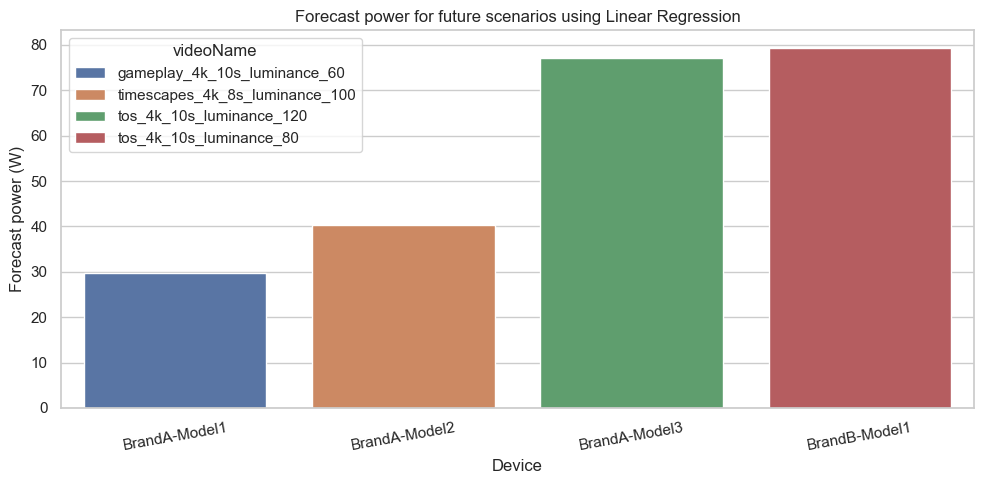

In [19]:
# Forecast future scenarios using the best dataset-based model
# This is scenario forecasting: you provide future settings, and the model predicts expected power and energy.

best_dataset_model_name = dataset_model_results.iloc[0]["Model"]
if best_dataset_model_name == "Linear Regression":
    best_dataset_estimator = LinearRegression()
elif best_dataset_model_name == "XGBoost":
    best_dataset_estimator = XGBRegressor(
        objective="reg:squarederror",
        n_estimators=300,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        verbosity=0,
    )
else:
    raise ValueError(f"Unsupported dataset model: {best_dataset_model_name}")

forecast_pipeline = Pipeline(
    steps=[
        ("preprocessor", dataset_preprocessor),
        ("model", best_dataset_estimator),
    ]
)
forecast_pipeline.fit(X_dataset, y_dataset)

reference_content_features = (
    modelling_df[
        [
            "videoName",
            "luminanceReduction",
            "bitrate",
            "duration_seconds",
            "vmaf.vmaf.vmaf.average",
            "vmaf.vmaf.integer_motion.average",
            "psnr-ssim.psnr.psnr_avg.average",
            "psnr-ssim.ssim.ssim_avg.average",
        ]
    ]
    .drop_duplicates()
    .reset_index(drop=True)
)

future_template = pd.DataFrame(
    [
        {"device": "BrandA-Model1", "videoName": "gameplay_4k_10s_luminance_60"},
        {"device": "BrandA-Model2", "videoName": "timescapes_4k_8s_luminance_100"},
        {"device": "BrandA-Model3", "videoName": "tos_4k_10s_luminance_120"},
        {"device": "BrandB-Model1", "videoName": "tos_4k_10s_luminance_80"},
    ]
)

best_available_settings = (
    reference_content_features
    .sort_values(["videoName", "luminanceReduction", "bitrate"], ascending=[True, False, False])
    .groupby("videoName", as_index=False)
    .first()
)

future_scenarios = future_template.merge(
    best_available_settings,
    on="videoName",
    how="left",
)

if future_scenarios.isna().any().any():
    missing_videos = future_scenarios[future_scenarios.isna().any(axis=1)][["device", "videoName"]]
    raise ValueError(
        "Some requested videoName values were not found in the dataset feature table.\n"
        f"Missing rows:\n{missing_videos.to_string(index=False)}"
    )

future_feature_frame = future_scenarios[feature_columns_dataset].copy()
future_scenarios["Forecast_Power_W"] = forecast_pipeline.predict(future_feature_frame)
future_scenarios["Forecast_Energy_Wh"] = future_scenarios["Forecast_Power_W"] * future_scenarios["duration_seconds"] / 3600.0
future_scenarios["Model_Used"] = best_dataset_model_name
future_scenarios["Forecast_Type"] = "Scenario forecast from known dataset patterns"

print("Future scenario forecast using the best dataset-based model")
display(
    future_scenarios[
        [
            "Forecast_Type",
            "Model_Used",
            "device",
            "videoName",
            "luminanceReduction",
            "bitrate",
            "duration_seconds",
            "Forecast_Power_W",
            "Forecast_Energy_Wh",
        ]
    ]
)

plt.figure(figsize=(10, 5))
sns.barplot(
    data=future_scenarios,
    x="device",
    y="Forecast_Power_W",
    hue="videoName",
)
plt.title(f"Forecast power for future scenarios using {best_dataset_model_name}")
plt.xlabel("Device")
plt.ylabel("Forecast power (W)")
plt.xticks(rotation=10)
plt.tight_layout()
plt.show()